# Consumo de energía en Chicago en 2010

Alberto Ramos Sánchez

08/01/2021

## Contenido

* [Exploración de los datos](#Exploración-de-los-datos)
    * [Estudio de datos](#Estudio-de-datos)
        * [Comunidades que existen](#Comunidades-que-existen)
* [Ensayos](#Ensayos)
    * [Clustering de energía por tipo de zonas agrupando por ciudades](#Clustering-de-energía-por-tipo-de-zonas-agrupando-por-ciudades)
        * [Comercial](#Comercial)
        * [Residencial](#Residencial)
        * [Industrial](#Industrial)
    * [Clustering de gas por tipo de zonas agrupando por ciudades](#Clustering-de-gas-por-tipo-de-zonas-agrupando-por-ciudades)
        * [Comercial](#Comercial)
        * [Residencial](#Residencial)
        * [Industrial](#Industrial)
    * [Clustering de energía para cada comunidad observando patrones para cada bloque](#Clustering-de-energía-para-cada-comunidad-observando-patrones-para-cada-bloque)
        * [Comercial](#Comercial)
        * [Residencial](#Residencial)
        * [Industrial](#Industrial)
    * [Clustering de gas para cada comunidad observando patrones en cada bloque](#Clustering-de-gas-para-cada-comunidad-observando-patrones-en-cada-bloque)
        * [Comercial](#Comercial)
        * [Industrial](#Industrial)
        * [Residencial](#Residencial)
    * [Clustering de energia por media consumida en cada contador por comunidad](#Clustering-de-energia-por-media-consumida-en-cada-contador-por-comunidad)
    * [Clustering de gas por media consumida en cada contador por comunidad](#Clustering-de-gas-por-media-consumida-en-cada-contador-por-comunidad)
    * [Clustering por edad del edificio](#Clustering-por-edad-del-edificio)
    * [Clustering por dimensión del hogar](#Clustering-por-dimensión-del-hogar)
    * [Clustering por ocupación total](#Clustering-por-ocupación-total)
    * [Clustering por porcentaje de casas en renta](#Clustering-por-porcentaje-de-casas-en-renta)


***Dependencias***

In [1]:
import pandas as pd
import numpy as np
from scipy.stats import zscore

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from yellowbrick.cluster import silhouette_visualizer

import datetime

from sklearn import preprocessing

from scipy.stats import zscore

from dataloader import DataLoader

from clustering import KMeansCluster, CMeansCluster

from visualization import tsne

from pathlib import Path

images_path = Path("./images2")

np.random.seed(42)

## Exploración de los datos

Leemos de fichero los datos previamente preprocesados

In [2]:
df = pd.read_csv('energy-usage-2010-clean.csv')
df

,COMMUNITY AREA NAME,CENSUS BLOCK,BUILDING TYPE,BUILDING_SUBTYPE,KWH JANUARY 2010,KWH FEBRUARY 2010,KWH MARCH 2010,KWH APRIL 2010,KWH MAY 2010,KWH JUNE 2010,...,TOTAL POPULATION,TOTAL UNITS,AVERAGE STORIES,AVERAGE BUILDING AGE,AVERAGE HOUSESIZE,OCCUPIED UNITS,OCCUPIED UNITS PERCENTAGE,RENTER-OCCUPIED HOUSING UNITS,RENTER-OCCUPIED HOUSING PERCENTAGE,OCCUPIED HOUSING UNITS
0,Archer Heights,1.703157e+14,Residential,Multi < 7,NaN,NaN,NaN,NaN,NaN,NaN,...,89.0,24.0,2.00,71.33,3.87,23.0,0.9582,9.0,0.3910,23.0
1,Ashburn,1.703170e+14,Residential,Multi 7+,7334.0,7741.0,4214.0,4284.0,2518.0,4273.0,...,112.0,67.0,2.00,41.00,1.81,62.0,0.9254,50.0,0.8059,62.0
2,Auburn Gresham,1.703171e+14,Commercial,Multi < 7,NaN,NaN,NaN,NaN,NaN,NaN,...,102.0,48.0,3.00,86.00,3.00,34.0,0.7082,23.0,0.6759,34.0
3,Austin,1.703125e+14,Commercial,Multi < 7,NaN,NaN,NaN,NaN,NaN,NaN,...,121.0,56.0,2.00,84.00,2.95,41.0,0.7321,32.0,0.7800,41.0
4,Austin,1.703125e+14,Commercial,Multi < 7,NaN,NaN,NaN,NaN,NaN,NaN,...,62.0,23.0,2.00,85.00,3.26,19.0,0.8261,11.0,0.5790,19.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67046,Woodlawn,1.703184e+14,Residential,Single Family,2705.0,1318.0,1582.0,1465.0,1494.0,2990.0,...,116.0,55.0,1.00,0.00,3.14,37.0,0.6727,26.0,0.7030,37.0
67047,Woodlawn,1.703184e+14,Commercial,Multi < 7,1005.0,1760.0,1521.0,1832.0,2272.0,2361.0,...,31.0,24.0,3.00,104.50,2.07,15.0,0.6250,13.0,0.8670,15.0
67048,Woodlawn,1.703184e+14,Residential,Multi < 7,3567.0,3031.0,2582.0,2295.0,7902.0,4987.0,...,31.0,24.0,2.33,100.67,2.07,15.0,0.6250,13.0,0.8670,15.0
67049,Woodlawn,1.703184e+14,Residential,Single Family,1208.0,1055.0,1008.0,1109.0,1591.0,1367.0,...,0.0,0.0,1.00,0.00,0.00,0.0,NaN,0.0,NaN,0.0


El dataset contiene 72 columnas que contienen —además del consumo energético mensual— características de cada uno de los bloques censales de cada comunidad de Chicago.

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67051 entries, 0 to 67050
Data columns (total 73 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   COMMUNITY AREA NAME                  67051 non-null  object 
 1   CENSUS BLOCK                         66974 non-null  float64
 2   BUILDING TYPE                        66974 non-null  object 
 3   BUILDING_SUBTYPE                     66974 non-null  object 
 4   KWH JANUARY 2010                     66180 non-null  float64
 5   KWH FEBRUARY 2010                    66180 non-null  float64
 6   KWH MARCH 2010                       66180 non-null  float64
 7   KWH APRIL 2010                       66180 non-null  float64
 8   KWH MAY 2010                         66180 non-null  float64
 9   KWH JUNE 2010                        66180 non-null  float64
 10  KWH JULY 2010                        66180 non-null  float64
 11  KWH AUGUST 2010             

Las columnas más importantes son:
- __COMMUNITY AREA NAME__: nombre de un área de Chicago
- __CENSUS BLOCK__: número censal. Los registros en blanco son zonas a las que no se agregaron información por privacidad
- __BUILDING TYPE__: tipo de edificios en ese área (Residential, Commercial, Industrial). Los registros en blanco son zonas con número censal en blanco.
- __BUILDING_SUBTYPE__: subtipo de edificio en ese área (Single Family, Multi <7, Multi 7+, Commercial, Industrial, Municipal). Los registros en blanco son zonas con número censal en blanco.
- __KWH JANUARY 2010 ... KWH DECEMBER 2010__: KWH consumidos en cada mes en ese área.
- __TOTAL KWH__: Total de KWH consumidos
- __ELECTRICITY ACCOUNTS__: número de contadores en la zona. Cada contador no corresponde a un edificio.
- __ZERO KWH ACCOUNTS__: contadores que no han consumido energía.
- __THERM JANUARY 2010 ... THERM DECEMBER 2010__: therms consumidos en cada mes en ese área.
- __TOTAL THERMS__: consumo total de gas.
- __GAS ACCOUNTS__: contadores de gas.
- __TOTAL POPULATION__: tamaño de la población
- __TOTAL UNITS__: Número de viviendas/comercios/fábricas según el tipo de zona.
- __AVERAGE BUILDING AGE__: edad media de los edificios
- __AVERAGE HOUSESIZE__: dimensión media del hogar. Se obtiene dividiendo el número de personas en los hogares por el número de hogares.
- __OCCUPIED UNITS__: edificios ocupados
- __OCCUPIED UNITS PERCENTAGE__: porcentaje de edificios ocupados
- __RENTER-OCCUPIED HOUSING UNITS__: unidades rentadas
- __RENTER-OCCUPIED HOUSING PERCENTAGE__: porcentaje de unidades rentadas

Las demás columnas están descritas en: https://data.cityofchicago.org/Environment-Sustainable-Development/Energy-Usage-2010/8yq3-m6wp

### Estudio de datos

La clase ***dataloader*** facilita la selección de datos no nulos del *dataset*. A través de las propiedades *energy_cols* y *gas_cols* podemos seleccionar todas las columnas que reflejan el consumo mensual de electricidad y gas, respectivamente.

In [4]:
dl = DataLoader(df)

In [5]:
all_energy_df = dl[dl.energy_cols]
all_gas_df = dl[dl.gas_cols]

#### Outliers

##### Energía

El siguiente *boxplot* muestra la existencia de *outliers*, que corresponden a comunidades con un alto consumo de electricidad.

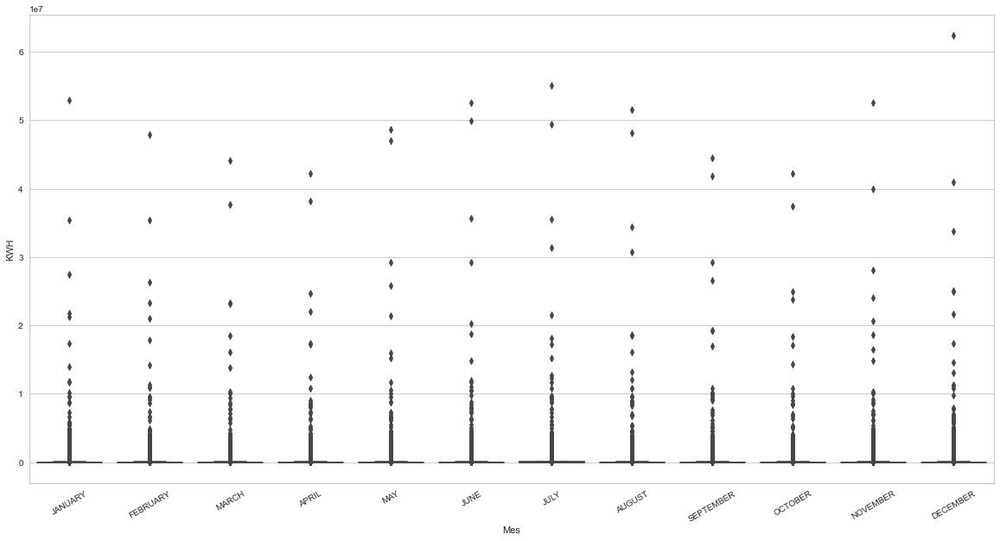

In [6]:
figure = plt.figure(figsize = (20,10))

ax = sns.boxplot(data=all_energy_df)
_ = ax.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=30)
_ = ax.set(xlabel="Mes", ylabel="KWH")

path = images_path / Path("exploracion_datos/outliers/energia")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("boxplot.eps"))

Los valores más altos de consumo hacen notar que en los meses de vacaciones (navidades y verano) aumenta el consumo de energía. Aún así, según el valor medio se observa un crecimiento del consumo de energía. Sería interesante tener los datos de siguientes años para poder comprobar si esta tendencia continúa en los siguientes años.

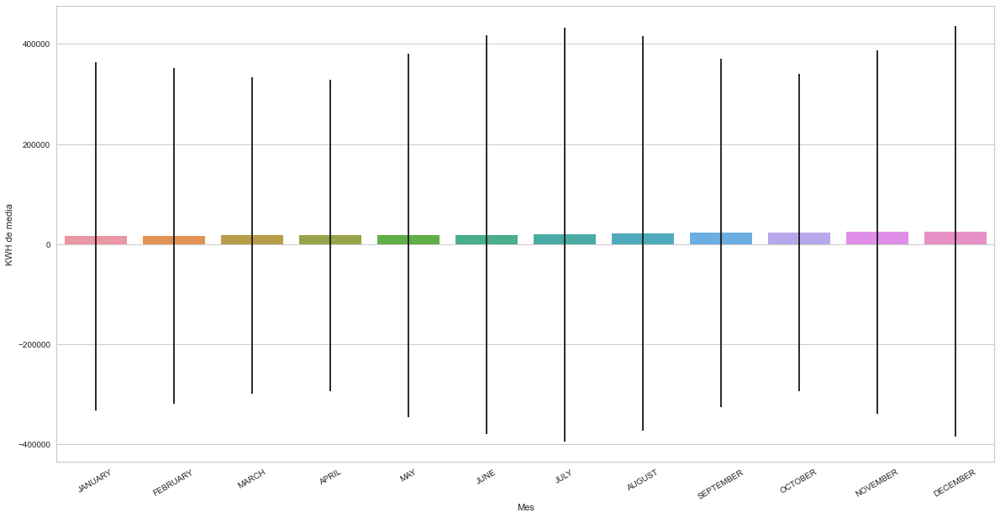

In [7]:
figure = plt.figure(figsize = (20,10))

energy_all_mean = all_energy_df.mean(axis=0)
energy_all_sd = all_energy_df.std(axis=0)
ax = sns.barplot(data=energy_all_mean, x = energy_all_mean.index, y = energy_all_mean.values, yerr=energy_all_sd)
_ = ax.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=30)
_ = ax.set(xlabel="Mes", ylabel="KWH de media")

path = images_path / Path("exploracion_datos/outliers/energia")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("barplot.eps"))

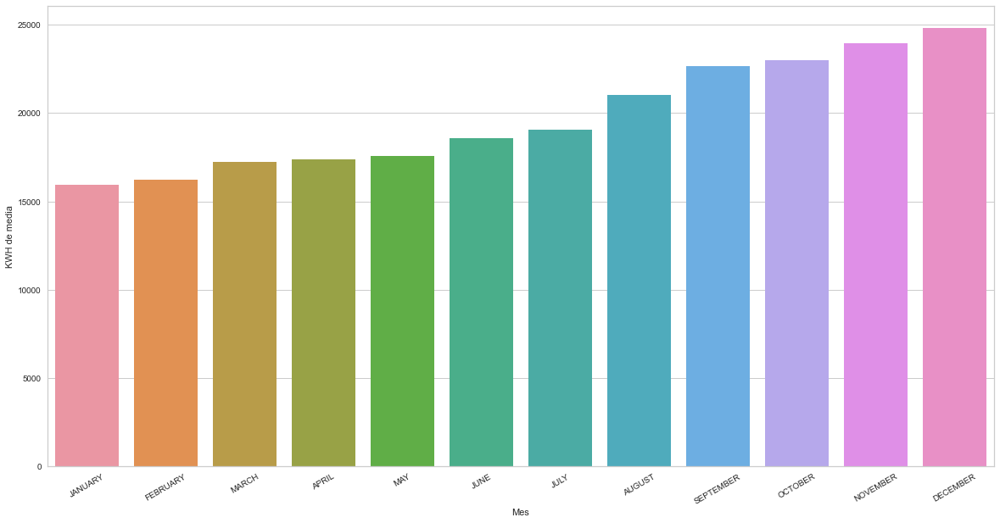

In [8]:
figure = plt.figure(figsize = (20,10))

energy_all_mean = all_energy_df.mean(axis=0)
ax = sns.barplot(data=energy_all_mean, x = energy_all_mean.index, y = energy_all_mean.values)
_ = ax.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=30)
_ = ax.set(xlabel="Mes", ylabel="KWH de media")

path = images_path / Path("exploracion_datos/outliers/energia")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("barras.eps"))

##### Gas

Al igual que con la electricidad, el siguiente *boxplot* muestra la existencia de *outliers*, que corresponden a comunidades con un alto consumo de gas.

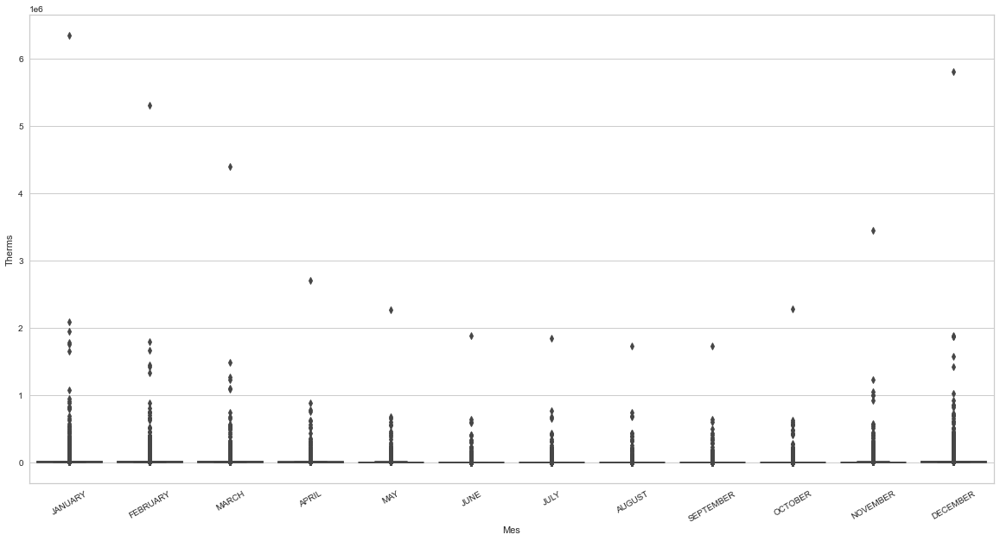

In [9]:
figure = plt.figure(figsize = (20,10))

ax = sns.boxplot(data=all_gas_df)
_ = ax.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=30)
_ = ax.set(xlabel="Mes", ylabel="Therms")

path = images_path / Path("exploracion_datos/outliers/gas")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("boxplot.svg"))

Los valores más altos de varianza reflejan la tendencia de uso que se podría esperar, que se utilice más el gas en épocas invernales. Aún así, el valor medio refleja justo lo opuesto, el consumo de gas tiende a aumentar.

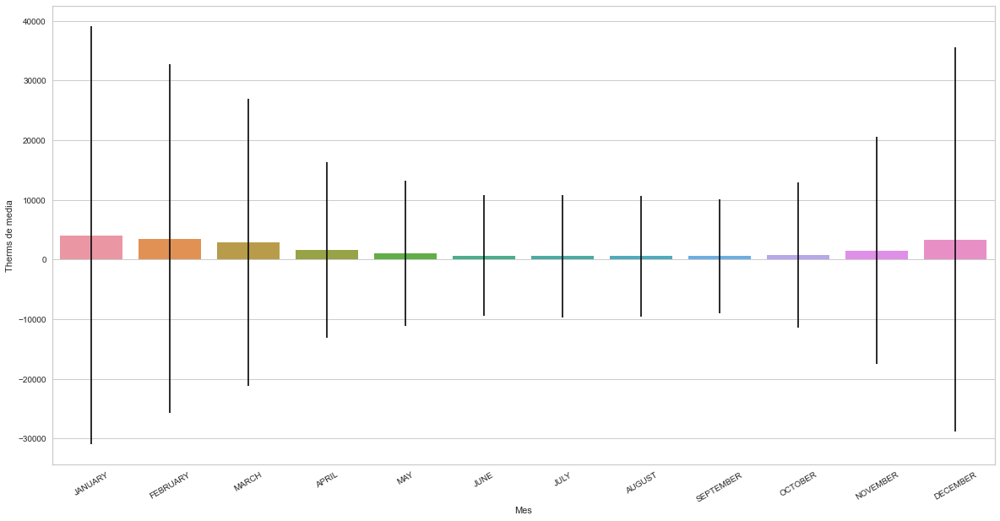

In [10]:
figure = plt.figure(figsize = (20,10))

gas_all_mean = all_gas_df.mean(axis=0)
gas_all_sd = all_gas_df.std(axis=0)
ax = sns.barplot(data=energy_all_mean, x = gas_all_mean.index, y = gas_all_mean.values, yerr=gas_all_sd)
_ = ax.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=30)
_ = ax.set(xlabel="Mes", ylabel="Therms de media")

path = images_path / Path("exploracion_datos/outliers/gas")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("barplot.svg"))

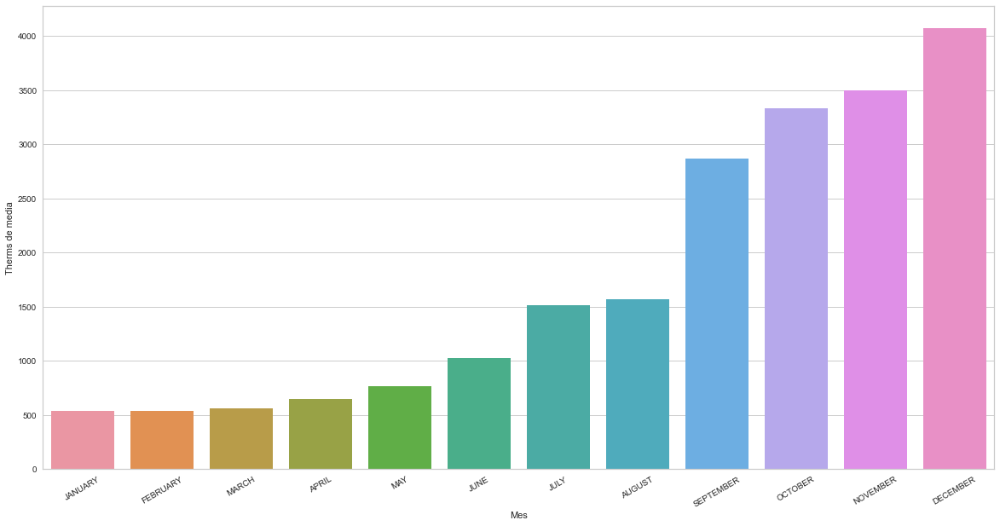

In [11]:
figure = plt.figure(figsize = (20,10))

gas_all_mean = all_gas_df.mean(axis=0)
ax = sns.barplot(data=gas_all_mean, x = gas_all_mean.index, y = gas_all_mean.values)
_ = ax.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=30)
_ = ax.set(xlabel="Mes", ylabel="Therms de media")

path = images_path / Path("exploracion_datos/outliers/gas")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("barras.svg"))

#### Comunidades que existen

En el dataset se encuentran las 77 comunidades de Chicago.

In [12]:
dl['COMMUNITY AREA NAME'].drop_duplicates()

0          Archer Heights
1                 Ashburn
2          Auburn Gresham
3                  Austin
12               Avondale
              ...        
591           West Elsdon
602         South Deering
607    Washington Heights
736       Mount Greenwood
740       Near South Side
Name: COMMUNITY AREA NAME, Length: 77, dtype: object

### [Volver al inicio](#Consumo-de-energía-en-Chicago-en-2010)

---

## Ensayos 

### Clustering de energía por tipo de zonas agrupando por ciudades

Se va a calcular el valor medio de consumo eléctrico por cada una de las comunidades y buscar las posibles agrupaciones de consumo para cada tipo de zona en la ciudad (comercial, industrial y residencial).

A continuación se calcula la media de consumo eléctrico para cada zona.

In [13]:
energy_mean_by_community_type = dl[['COMMUNITY AREA NAME', 'BUILDING TYPE'] + dl.energy_cols].groupby(['COMMUNITY AREA NAME', 'BUILDING TYPE'], as_index=False).mean()
energy_mean_by_community_type

,COMMUNITY AREA NAME,BUILDING TYPE,KWH JANUARY 2010,KWH FEBRUARY 2010,KWH MARCH 2010,KWH APRIL 2010,KWH MAY 2010,KWH JUNE 2010,KWH JULY 2010,KWH AUGUST 2010,KWH SEPTEMBER 2010,KWH OCTOBER 2010,KWH NOVEMBER 2010,KWH DECEMBER 2010
0,Albany Park,Commercial,6485.973190,6598.123324,6350.994638,6565.369973,8521.268097,10648.798928,10824.525469,9204.222520,7193.860590,7063.611260,8875.603217,9536.718499
1,Albany Park,Industrial,4387.000000,3671.000000,4849.000000,4923.000000,6580.000000,8196.000000,7074.000000,7556.000000,4655.000000,6193.000000,12597.000000,8237.000000
2,Albany Park,Residential,4493.482445,4868.560468,4831.300390,4704.583875,6202.847854,9507.514954,10494.762029,7880.837451,5533.161248,5713.767230,8412.635891,9043.319896
3,Archer Heights,Commercial,76154.428571,77902.155844,74525.714286,72982.935065,76074.220779,85996.129870,84604.389610,85607.376623,77916.636364,73602.805195,76310.571429,84052.545455
4,Archer Heights,Industrial,1100.000000,634.000000,508.000000,456.000000,552.000000,829.000000,4405.000000,1304.000000,895.000000,657.000000,784.000000,1586.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
168,West Town,Commercial,7890.108716,8219.340206,7867.381443,7907.283037,9768.865979,12332.753515,13705.432052,13291.417057,10410.490159,9151.462980,10051.944705,11954.955014
169,West Town,Industrial,7642.000000,6762.000000,5174.000000,6681.000000,8466.000000,16203.000000,16007.000000,13908.000000,9200.000000,7256.000000,8621.000000,10312.000000
170,West Town,Residential,4035.878754,4627.875921,4392.944476,4392.706516,5338.343909,7254.643626,9278.979603,9354.343909,7011.481020,5714.180737,6840.808499,8876.675921
171,Woodlawn,Commercial,66321.169231,62376.574359,46025.943590,44388.046154,41310.712821,48550.261538,44273.635897,52702.687179,59037.825641,50860.584615,53246.569231,76645.671795


#### Comercial

Se seleccionan los valores medio de consumo para las zonas comerciales.

In [14]:
energy_commercial_by_community = energy_mean_by_community_type[energy_mean_by_community_type['BUILDING TYPE']=="Commercial"]
energy_commercial_by_community

,COMMUNITY AREA NAME,BUILDING TYPE,KWH JANUARY 2010,KWH FEBRUARY 2010,KWH MARCH 2010,KWH APRIL 2010,KWH MAY 2010,KWH JUNE 2010,KWH JULY 2010,KWH AUGUST 2010,KWH SEPTEMBER 2010,KWH OCTOBER 2010,KWH NOVEMBER 2010,KWH DECEMBER 2010
0,Albany Park,Commercial,6485.973190,6598.123324,6350.994638,6565.369973,8521.268097,10648.798928,10824.525469,9204.222520,7193.860590,7063.611260,8875.603217,9536.718499
3,Archer Heights,Commercial,76154.428571,77902.155844,74525.714286,72982.935065,76074.220779,85996.129870,84604.389610,85607.376623,77916.636364,73602.805195,76310.571429,84052.545455
6,Armour Square,Commercial,37698.041667,34363.145833,30411.239583,31034.666667,31278.093750,33461.270833,42105.614583,39720.145833,32412.708333,23017.114583,31733.833333,48211.739583
9,Ashburn,Commercial,24129.737374,22406.404040,20967.484848,21031.595960,26618.222222,28948.676768,29027.707071,26762.808081,22696.373737,21852.020202,25317.878788,28463.444444
11,Auburn Gresham,Commercial,5184.100386,5056.308880,5084.494208,5122.316602,6511.660232,7688.424710,7925.613900,6999.822394,5477.868726,5558.455598,6506.455598,7659.637066
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
162,West Lawn,Commercial,65512.178947,71017.073684,67999.989474,69908.431579,84869.778947,94092.010526,91777.000000,92741.736842,78164.905263,66165.336842,69139.621053,78315.905263
164,West Pullman,Commercial,4018.162791,4657.023256,4679.779070,4860.197674,5639.651163,6886.476744,7874.616279,7650.453488,6234.651163,5450.593023,6107.093023,7010.883721
166,West Ridge,Commercial,9307.416335,9402.619522,8822.699203,9619.591633,12595.511952,15000.701195,14534.021912,12644.521912,9959.976096,10351.906375,12838.211155,13003.069721
168,West Town,Commercial,7890.108716,8219.340206,7867.381443,7907.283037,9768.865979,12332.753515,13705.432052,13291.417057,10410.490159,9151.462980,10051.944705,11954.955014


Aplicamos *KMeans* para varios valores de k y seleccionamos el punto codo en la gráfica de *Elbow*.

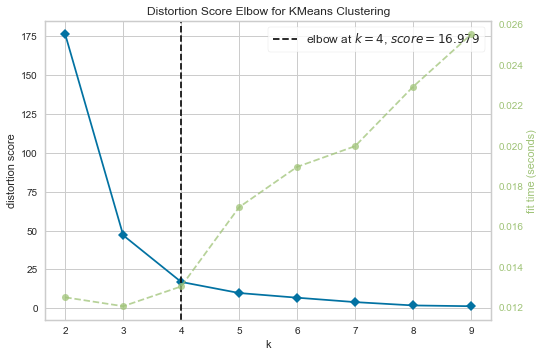

<Figure size 576x396 with 0 Axes>

In [15]:
kmax = 10
k_values = (2, kmax)

scaler = preprocessing.StandardScaler()
data = energy_commercial_by_community[dl.energy_cols]
norm_data = scaler.fit(data).transform(data)

km = KMeansCluster(norm_data)
km.cluster(k_values)

path = images_path / Path("ensayos/clustering_energia_tipo_zona_agrupa_ciudades/comercial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("elbow.svg"))

Seleccionamos el mejor resultado de clustering. El punto de codo está sobre k=4.

In [16]:
km_best = km.get_kmeans_of(4)
km_labels = km_best.labels_
km_centroids = scaler.inverse_transform(km_best.cluster_centers_)

km_labels, np.where(km_labels==0)[0]

(array([0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
        0, 0, 0, 2, 2, 3, 0, 0, 0, 0, 0, 3, 0, 0, 3, 3, 0, 0, 0, 3, 0, 0,
        0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0]),
 array([ 0,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 50, 51, 52, 53, 54, 56, 57,
        60, 61, 62, 64, 65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 76],
       dtype=int64))

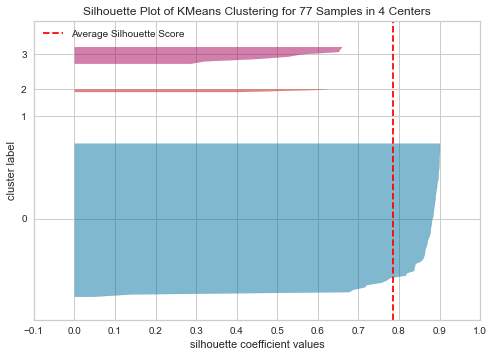

<Figure size 576x396 with 0 Axes>

In [17]:
_ = silhouette_visualizer(km_best, norm_data, colors='yellowbrick')

path = images_path / Path("ensayos/clustering_energia_tipo_zona_agrupa_ciudades/comercial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("silhouette.svg"))

A continuación aplicamos *CMeans*.

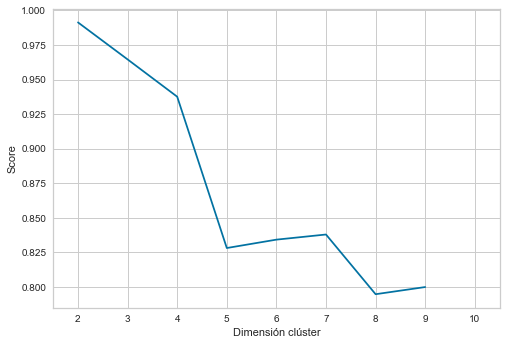

In [18]:
kmax = 10
k_values = [e for e in range(2, kmax)]

scaler = preprocessing.StandardScaler()
data = energy_commercial_by_community[dl.energy_cols]
norm_data = scaler.fit(data).transform(data)

cm = CMeansCluster(norm_data)
cm.cluster(k_values)

scores = cm.get_scores()
ax = sns.lineplot(data=scores, x="cluster_dim", y="score")
_ = ax.set(xlabel="Dimensión clúster", ylabel="Score")
_ = ax.set(xlim=(1.5, kmax + .5))

path = images_path / Path("ensayos/clustering_energia_tipo_zona_agrupa_ciudades/comercial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("elbow_cmeans.svg"))

In [19]:
cm_best = cm.get_cmeans_of(2)
cntr, u, u0, d, jm, p, fpc = cm_best

labels = u.argmax(axis=0)

labels, np.where(labels==1)[0]

(array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int64),
 array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
        52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
        69, 70, 71, 72, 73, 74, 75, 76], dtype=int64))

Con Cmeans hemos obtenido una división de una muestra en un único clúster.

En la siguiente gráfica se muestran los 4 clústers obtenidos con KMeans. *Loop* se encuentra en un único clúster y su consumo medio es el más alto. Este resultado era de esperable pues es, junto a *Near North Side* y *Near South Side*, las comunidades centrales de Chicago.

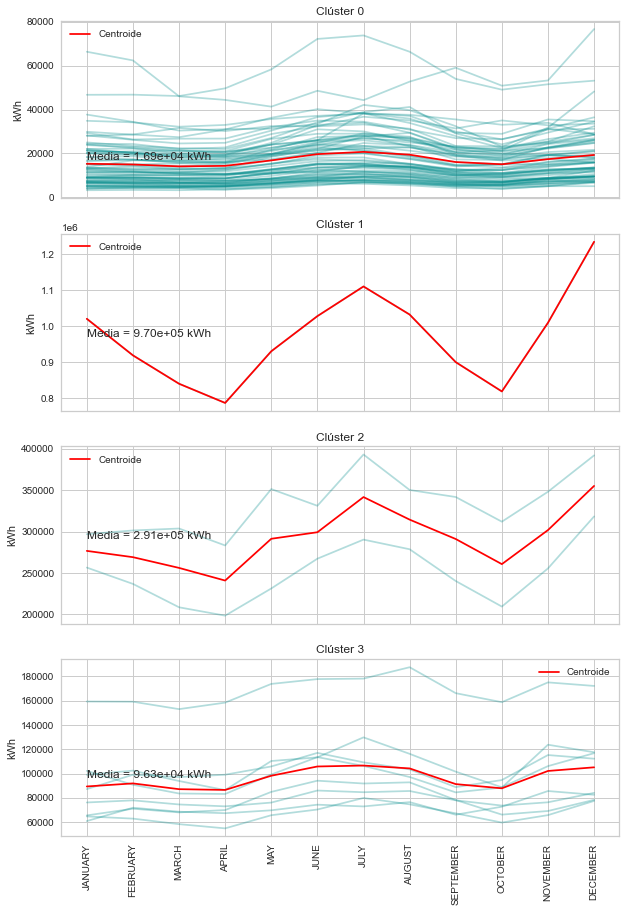

In [20]:
labels = pd.DataFrame(km_labels, columns=["label"])

k = km_centroids.shape[0]

f, axes = plt.subplots(k, 1, figsize=(10, 15), sharex=True)

for ki in range(k):
    cluster = energy_commercial_by_community.iloc[labels.query(f'label == {ki}').index][dl.energy_cols]
    palette={i:"darkcyan" for i in range(cluster.shape[0])}

    ax0 = sns.lineplot(data=cluster.values.T, ax=axes[ki], palette=palette, alpha=0.3)
    _ = [line.set_linestyle("-") for line in ax0.lines]
    
    ax0c = sns.lineplot(data=km_centroids[ki, :].T, ax=axes[ki], color="red")
    _ = [line.set_linestyle("-") for line in ax0c.lines]
    
    ax0c.legend(ax0c.lines[-1:], ["Centroide"]);
    
    ax0.set_title(f"Clúster {ki}")
    Media = km_centroids[ki, :].mean()
    ax0.text(0, Media, f"{Media = :0.2e} kWh")
    ax0.set(ylabel="kWh")
    
    ax0.set_xticks([e for e in range(0, 12)])
    ax0.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)

path = images_path / Path("ensayos/clustering_energia_tipo_zona_agrupa_ciudades/comercial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_grafica.svg"))

La siguiente gráfica nos muestra la división de los clúster encontrados.

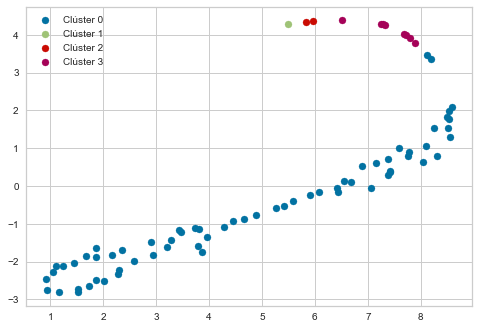

In [21]:
v = tsne(energy_commercial_by_community[dl.energy_cols], 2)
for label in range(k):
    plt.scatter(
            x=v[(labels['label']==label).values, 0],
            y=v[(labels['label']==label).values, 1]
    )
plt.legend([f"Clúster {e}" for e in range(k)])

path = images_path / Path("ensayos/clustering_energia_tipo_zona_agrupa_ciudades/comercial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_scatter.svg"))

¿Que comunidades pertenecen a cada cluster?

Junto a Loop, Near North Side y Near South Side forman parte del centro de la ciudad de Chicago, por lo que era de esperar que estas ciudades se encontraran entre las de más consumo de energía, en los clúster 1 y 3.

In [22]:
comunities_by_cluster = {}

for nlab in range(k):
    com_index = np.where(labels==nlab)[0]
    com_list = []
    for c in energy_commercial_by_community.values[com_index][:,0]:
        com_list.append(c)
    comunities_by_cluster[nlab] = com_list

for k in sorted(comunities_by_cluster, key=lambda k: len(comunities_by_cluster[k])):
    print(f"Al clúster {k} pertenecen las comunidades:")
    for e in comunities_by_cluster[k]:
        print("\t", e)
    

Al clúster 1 pertenecen las comunidades:
	 Loop
Al clúster 2 pertenecen las comunidades:
	 Near North Side
	 Near South Side
Al clúster 3 pertenecen las comunidades:
	 Archer Heights
	 Forest Glen
	 Near West Side
	 O'Hare
	 Pullman
	 Riverdale
	 South Deering
	 West Lawn
Al clúster 0 pertenecen las comunidades:
	 Albany Park
	 Armour Square
	 Ashburn
	 Auburn Gresham
	 Austin
	 Avalon Park
	 Avondale
	 Belmont Cragin
	 Beverly
	 Bridgeport
	 Brighton Park
	 Burnside
	 Calumet Heights
	 Chatham
	 Chicago Lawn
	 Clearing
	 Douglas
	 Dunning
	 East Garfield Park
	 East Side
	 Edgewater
	 Edison Park
	 Englewood
	 Fuller Park
	 Gage Park
	 Garfield Ridge
	 Grand Boulevard
	 Greater Grand Crossing
	 Hegewisch
	 Hermosa
	 Humboldt Park
	 Hyde Park
	 Irving Park
	 Jefferson Park
	 Kenwood
	 Lakeview
	 Lincoln Park
	 Lincoln Square
	 Logan Square
	 Lower West Side
	 McKinley Park
	 Montclare
	 Morgan Park
	 Mount Greenwood
	 New City
	 North Center
	 North Lawndale
	 North Park
	 Norwood Park

Veamos los resultados de cmeans. Se obtiene dos clústeres, donde en uno hay una única muestra.

In [24]:
cm_best = cm.get_cmeans_of(2)
cntr, u, u0, d, jm, p, fpc = cm_best

cntr = scaler.inverse_transform(cntr)
cm_labels = u.argmax(axis=0)

cm_labels

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int64)

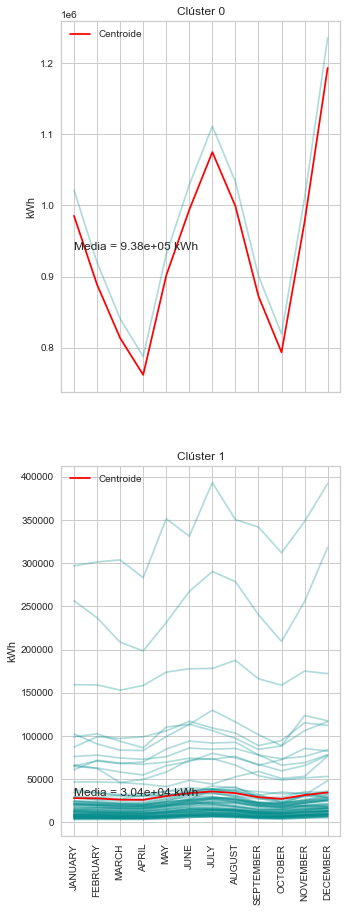

In [25]:
labels = pd.DataFrame(cm_labels, columns=["label"])

k = cntr.shape[0]

f, axes = plt.subplots(k, 1, figsize=(5, 15), sharex=True)

for ki in range(k):
    cluster = energy_commercial_by_community.iloc[labels.query(f'label == {ki}').index][dl.energy_cols]
    palette={i:"darkcyan" for i in range(cluster.shape[0])}

    ax0 = sns.lineplot(data=cluster.values.T, ax=axes[ki], palette=palette, alpha=0.3)
    _ = [line.set_linestyle("-") for line in ax0.lines]
    
    ax0c = sns.lineplot(data=cntr[ki, :].T, ax=axes[ki], color="red")
    _ = [line.set_linestyle("-") for line in ax0c.lines]
    
    ax0c.legend(ax0c.lines[-1:], ["Centroide"]);
    
    ax0.set_title(f"Clúster {ki}")
    Media = cntr[ki, :].mean()
    ax0.text(0, Media, f"{Media = :0.2e} kWh")
    ax0.set(ylabel="kWh")
    
    ax0.set_xticks([e for e in range(0, 12)])
    ax0.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)

path = images_path / Path("ensayos/clustering_energia_tipo_zona_agrupa_ciudades/comercial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_grafica_cmeans.svg"))

#### Residencial

A continuación se selecciona los valores medio de consumo por comunidad para las zonas tipo residencial.

In [26]:
energy_residential_by_community = energy_mean_by_community_type[energy_mean_by_community_type['BUILDING TYPE']=="Residential"]
energy_residential_by_community

,COMMUNITY AREA NAME,BUILDING TYPE,KWH JANUARY 2010,KWH FEBRUARY 2010,KWH MARCH 2010,KWH APRIL 2010,KWH MAY 2010,KWH JUNE 2010,KWH JULY 2010,KWH AUGUST 2010,KWH SEPTEMBER 2010,KWH OCTOBER 2010,KWH NOVEMBER 2010,KWH DECEMBER 2010
2,Albany Park,Residential,4493.482445,4868.560468,4831.300390,4704.583875,6202.847854,9507.514954,10494.762029,7880.837451,5533.161248,5713.767230,8412.635891,9043.319896
5,Archer Heights,Residential,4779.779605,3830.042763,3381.667763,4259.944079,5050.868421,7143.690789,10079.098684,8852.562500,5186.148026,4123.243421,5542.542763,7024.115132
8,Armour Square,Residential,4880.892655,5422.807910,5269.322034,5195.807910,5739.259887,6977.977401,10876.067797,10688.847458,8135.774011,6055.570621,7107.508475,9459.282486
10,Ashburn,Residential,7685.557441,7535.497389,7290.016971,7476.365535,10381.006527,16359.704961,18197.938642,13426.244125,9015.569191,8341.000000,12181.706266,13469.849869
12,Auburn Gresham,Residential,5250.104076,5428.169991,5243.229835,5094.189939,6166.013877,8637.880312,9349.874241,7706.798786,5858.764094,6152.209887,8788.036427,10000.882914
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163,West Lawn,Residential,5884.403716,5566.481419,5527.908784,5224.923986,7577.138514,11927.521959,13929.736486,11061.168919,6631.606419,5928.351351,7740.572635,9650.545608
165,West Pullman,Residential,2512.937376,4048.336978,3890.841948,4105.110338,4580.604374,5652.351889,7412.451292,7063.981113,5111.528827,4619.525845,5552.450298,7356.383698
167,West Ridge,Residential,5471.784787,5573.705937,5368.393321,5863.319109,7990.311688,11648.390538,11575.739332,8624.476809,5947.495362,6420.602041,9243.713358,9150.877551
170,West Town,Residential,4035.878754,4627.875921,4392.944476,4392.706516,5338.343909,7254.643626,9278.979603,9354.343909,7011.481020,5714.180737,6840.808499,8876.675921


Aplicamos *KMeans*

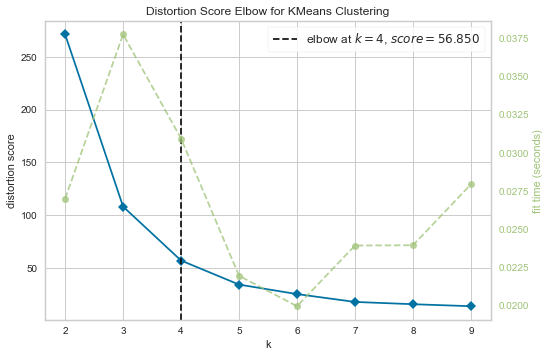

<Figure size 576x396 with 0 Axes>

In [27]:
kmax = 10
k_values = (2, kmax)

scaler = preprocessing.StandardScaler()
data = energy_residential_by_community[dl.energy_cols]
norm_data = scaler.fit(data).transform(data)

km = KMeansCluster(norm_data)
km.cluster(k_values)

path = images_path / Path("ensayos/clustering_energia_tipo_zona_agrupa_ciudades/residencial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("elbow.svg"))

En este caso, el punto de codo se encuentra en k=4

In [28]:
km_best = km.get_kmeans_of(4)
km_labels = km_best.labels_
km_centroids = scaler.inverse_transform(km_best.cluster_centers_)

km_labels

array([3, 3, 3, 0, 3, 3, 3, 3, 3, 0, 3, 3, 3, 3, 3, 3, 0, 0, 0, 3, 3, 3,
       0, 3, 0, 3, 3, 0, 3, 3, 3, 3, 3, 3, 3, 3, 0, 3, 0, 3, 3, 1, 3, 3,
       3, 0, 0, 2, 2, 0, 3, 3, 3, 3, 0, 0, 3, 3, 3, 0, 3, 3, 3, 3, 3, 3,
       0, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3])

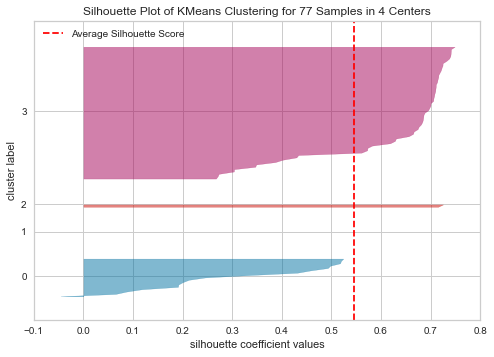

<Figure size 576x396 with 0 Axes>

In [29]:
_ = silhouette_visualizer(km_best, norm_data, colors='yellowbrick')

path = images_path / Path("ensayos/clustering_energia_tipo_zona_agrupa_ciudades/residencial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("silhouette.svg"))

En la siguientes gráfica podemos observar las tendencias de cada uno de los clústeres. 

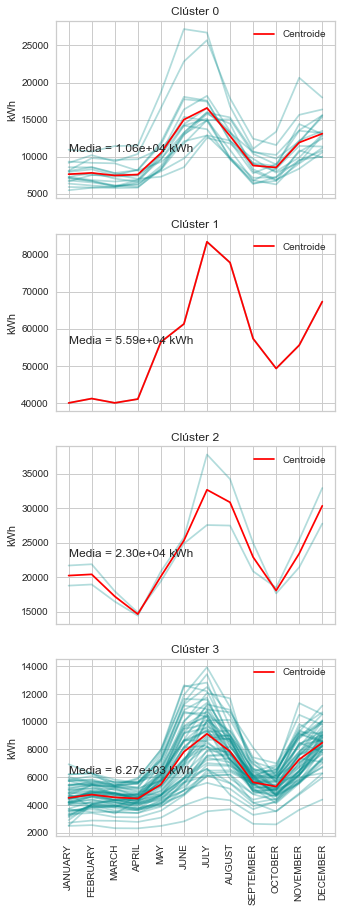

In [30]:
labels = pd.DataFrame(km_labels, columns=["label"])

k = km_centroids.shape[0]

f, axes = plt.subplots(k, 1, figsize=(5, 15), sharex=True)

for ki in range(k):
    cluster = energy_residential_by_community.iloc[labels.query(f'label == {ki}').index][dl.energy_cols]
    palette={i:"darkcyan" for i in range(cluster.shape[0])}

    ax0 = sns.lineplot(data=cluster.values.T, ax=axes[ki], palette=palette, alpha=0.3)
    _ = [line.set_linestyle("-") for line in ax0.lines]
    
    ax0c = sns.lineplot(data=km_centroids[ki, :].T, ax=axes[ki], color="red")
    _ = [line.set_linestyle("-") for line in ax0c.lines]
    
    ax0c.legend(ax0c.lines[-1:], ["Centroide"]);
    
    ax0.set_title(f"Clúster {ki}")
    Media = km_centroids[ki, :].mean()
    ax0.text(0, Media, f"{Media = :0.2e} kWh")
    ax0.set(ylabel="kWh")
    
    ax0.set_xticks([e for e in range(0, 12)])
    ax0.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)

path = images_path / Path("ensayos/clustering_energia_tipo_zona_agrupa_ciudades/residencial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_grafica.svg"))

En el siguiente gráfico se muestra las muestras agrupadas en cada uno de los clústers.

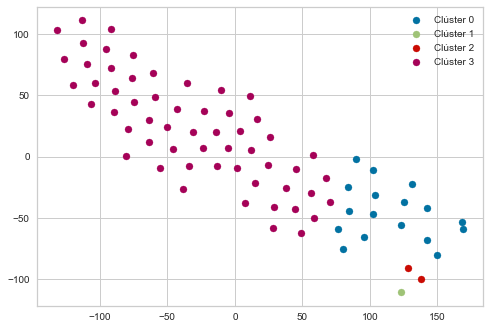

In [33]:
v = tsne(energy_residential_by_community[dl.energy_cols], 2)
for label in range(k):
    plt.scatter(
            x=v[(labels['label']==label).values, 0],
            y=v[(labels['label']==label).values, 1]
    )
plt.legend([f"Clúster {i}" for i in range(k)])
    
path = images_path / Path("ensayos/clustering_energia_tipo_zona_agrupa_ciudades/residencial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_scatter.svg"))

¿Qué comunidad está en cada cluster?

In [34]:
comunities_by_cluster = {}

for nlab in range(k):
    com_index = np.where(labels==nlab)[0]
    com_list = []
    for c in energy_residential_by_community.values[com_index][:,0]:
        com_list.append(c)
    comunities_by_cluster[nlab] = com_list

for k in sorted(comunities_by_cluster, key=lambda k: len(comunities_by_cluster[k])):
    print(f"Al clúster {k} pertenecen las comunidades:")
    for e in comunities_by_cluster[k]:
        print("\t", e)

Al clúster 1 pertenecen las comunidades:
	 Loop
Al clúster 2 pertenecen las comunidades:
	 Near North Side
	 Near South Side
Al clúster 0 pertenecen las comunidades:
	 Ashburn
	 Beverly
	 Clearing
	 Douglas
	 Dunning
	 Edison Park
	 Forest Glen
	 Garfield Ridge
	 Kenwood
	 Lincoln Park
	 Morgan Park
	 Mount Greenwood
	 Near West Side
	 Norwood Park
	 O'Hare
	 Riverdale
	 Uptown
Al clúster 3 pertenecen las comunidades:
	 Albany Park
	 Archer Heights
	 Armour Square
	 Auburn Gresham
	 Austin
	 Avalon Park
	 Avondale
	 Belmont Cragin
	 Bridgeport
	 Brighton Park
	 Burnside
	 Calumet Heights
	 Chatham
	 Chicago Lawn
	 East Garfield Park
	 East Side
	 Edgewater
	 Englewood
	 Fuller Park
	 Gage Park
	 Grand Boulevard
	 Greater Grand Crossing
	 Hegewisch
	 Hermosa
	 Humboldt Park
	 Hyde Park
	 Irving Park
	 Jefferson Park
	 Lakeview
	 Lincoln Square
	 Logan Square
	 Lower West Side
	 McKinley Park
	 Montclare
	 New City
	 North Center
	 North Lawndale
	 North Park
	 Oakland
	 Portage Park
	 P

#### Industrial

Seleccionamos el consumo medio por comunidad para las zonas industriales.

In [35]:
energy_industrial_by_community = energy_mean_by_community_type[energy_mean_by_community_type['BUILDING TYPE']=="Industrial"]
energy_industrial_by_community

,COMMUNITY AREA NAME,BUILDING TYPE,KWH JANUARY 2010,KWH FEBRUARY 2010,KWH MARCH 2010,KWH APRIL 2010,KWH MAY 2010,KWH JUNE 2010,KWH JULY 2010,KWH AUGUST 2010,KWH SEPTEMBER 2010,KWH OCTOBER 2010,KWH NOVEMBER 2010,KWH DECEMBER 2010
1,Albany Park,Industrial,4.387000e+03,3.671000e+03,4849.0,4.923000e+03,6.580000e+03,8.196000e+03,7.074000e+03,7.556000e+03,4.655000e+03,6.193000e+03,1.259700e+04,8.237000e+03
4,Archer Heights,Industrial,1.100000e+03,6.340000e+02,508.0,4.560000e+02,5.520000e+02,8.290000e+02,4.405000e+03,1.304000e+03,8.950000e+02,6.570000e+02,7.840000e+02,1.586000e+03
7,Armour Square,Industrial,2.537600e+04,2.299100e+04,18723.0,2.217700e+04,3.171000e+04,3.259000e+04,6.834600e+04,5.245100e+04,3.563400e+04,2.720200e+04,2.700300e+04,3.384400e+04
14,Austin,Industrial,4.581100e+04,4.222500e+04,34700.0,4.234500e+04,3.812000e+04,4.082000e+04,4.624200e+04,5.580700e+04,4.414400e+04,4.315900e+04,4.946300e+04,5.294800e+04
19,Avondale,Industrial,1.364200e+04,1.302200e+04,11056.0,1.025400e+04,1.116000e+04,1.404700e+04,1.264000e+04,1.122500e+04,1.078100e+04,1.049000e+04,1.267200e+04,1.496800e+04
28,Brighton Park,Industrial,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000e+00,5.440000e+02,9.760000e+02,7.620000e+02,1.137000e+03,4.780000e+02,6.360000e+02,7.020000e+02
49,Edgewater,Industrial,3.373000e+03,2.297500e+03,2023.5,3.184500e+03,4.155000e+03,5.877000e+03,5.980000e+03,4.898000e+03,3.381500e+03,2.712000e+03,4.574000e+03,3.878000e+03
56,Forest Glen,Industrial,4.909000e+03,4.079000e+03,6355.0,5.398000e+03,9.727000e+03,1.626400e+04,1.414400e+04,8.681000e+03,5.932000e+03,4.960000e+03,7.843000e+03,6.714000e+03
61,Gage Park,Industrial,4.140000e+02,8.370000e+02,1083.0,1.182000e+03,8.420000e+02,1.140000e+03,1.468000e+03,3.129000e+03,1.752000e+03,1.122000e+03,1.156000e+03,1.213000e+03
72,Hermosa,Industrial,7.989000e+03,1.101300e+04,10109.0,9.970000e+03,9.236000e+03,1.098200e+04,1.255600e+04,1.058800e+04,9.284000e+03,8.591000e+03,1.145800e+04,3.539000e+04


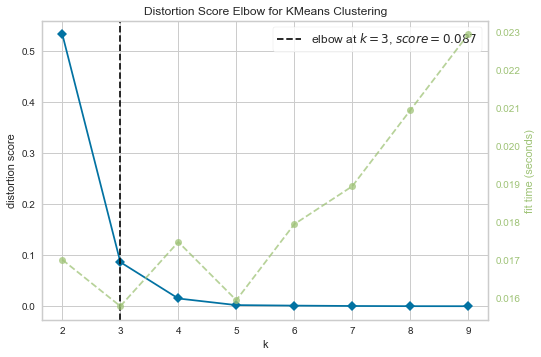

<Figure size 576x396 with 0 Axes>

In [36]:
kmax = 10
k_values = (2, kmax)

scaler = preprocessing.StandardScaler()
data = energy_industrial_by_community[dl.energy_cols]
norm_data = scaler.fit(data).transform(data)

km = KMeansCluster(norm_data)
km.cluster(k_values)

path = images_path / Path("ensayos/clustering_energia_tipo_zona_agrupa_ciudades/industrial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("elbow.svg"))

Con k=3 tendríamos una división óptima.

In [37]:
km_best = km.get_kmeans_of(3)
km_labels = km_best.labels_
km_centroids = scaler.inverse_transform(km_best.cluster_centers_)

km_labels

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 2, 0])

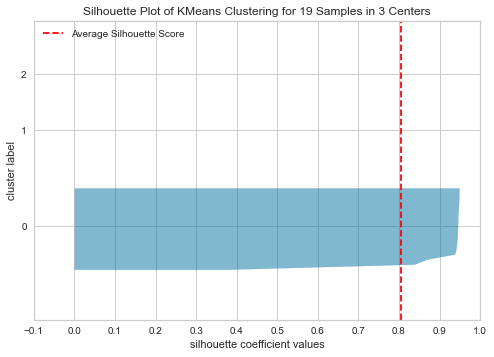

<Figure size 576x396 with 0 Axes>

In [38]:
_ = silhouette_visualizer(km_best, norm_data, colors='yellowbrick')

path = images_path / Path("ensayos/clustering_energia_tipo_zona_agrupa_ciudades/industrial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("silhouette.svg"))

A continuación se muestran las gráficas de tendencias para cada clúster.

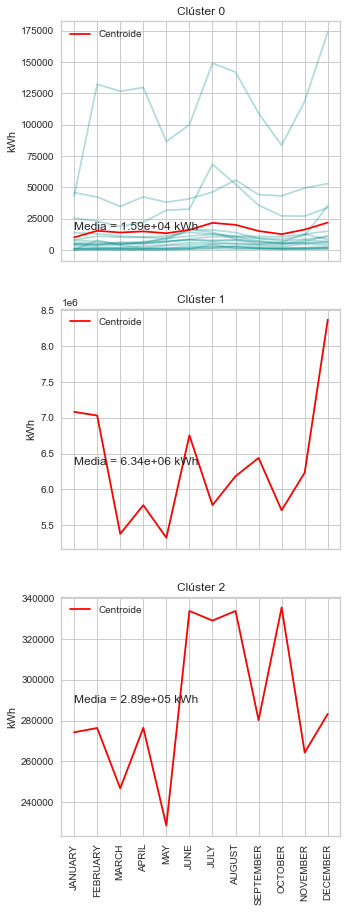

In [39]:
labels = pd.DataFrame(km_labels, columns=["label"])

k = km_centroids.shape[0]

f, axes = plt.subplots(k, 1, figsize=(5, 15), sharex=True)

for ki in range(k):
    cluster = energy_industrial_by_community.iloc[labels.query(f'label == {ki}').index][dl.energy_cols]
    palette={i:"darkcyan" for i in range(cluster.shape[0])}

    ax0 = sns.lineplot(data=cluster.values.T, ax=axes[ki], palette=palette, alpha=0.3)
    _ = [line.set_linestyle("-") for line in ax0.lines]
    
    ax0c = sns.lineplot(data=km_centroids[ki, :].T, ax=axes[ki], color="red")
    _ = [line.set_linestyle("-") for line in ax0c.lines]
    
    ax0c.legend(ax0c.lines[-1:], ["Centroide"]);
    
    ax0.set_title(f"Clúster {ki}")
    Media = km_centroids[ki, :].mean()
    ax0.text(0, Media, f"{Media = :0.2e} kWh")
    ax0.set(ylabel="kWh")
    
    ax0.set_xticks([e for e in range(0, 12)])
    ax0.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)

path = images_path / Path("ensayos/clustering_energia_tipo_zona_agrupa_ciudades/industrial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_grafica.svg"))

Se grafican las agrupaciones en clases para cada muestra.

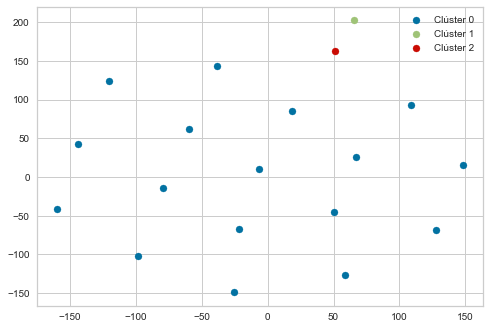

In [40]:
v = tsne(energy_industrial_by_community[dl.energy_cols], 2)
for label in range(k):
    plt.scatter(
            x=v[(labels['label']==label).values, 0],
            y=v[(labels['label']==label).values, 1]
    )
plt.legend([f"Clúster {i}" for i in range(k)])

path = images_path / Path("ensayos/clustering_energia_tipo_zona_agrupa_ciudades/industrial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_scatter.svg"))

¿Qué comunidad hay en cada clúster?

In [41]:
comunities_by_cluster = {}

for nlab in range(k):
    com_index = np.where(labels==nlab)[0]
    com_list = []
    for c in energy_industrial_by_community.values[com_index][:,0]:
        com_list.append(c)
    comunities_by_cluster[nlab] = com_list

for k in sorted(comunities_by_cluster, key=lambda k: len(comunities_by_cluster[k])):
    print(f"Al clúster {k} pertenecen las comunidades:")
    for e in comunities_by_cluster[k]:
        print("\t", e)




Al clúster 1 pertenecen las comunidades:
	 Near West Side
Al clúster 2 pertenecen las comunidades:
	 South Lawndale
Al clúster 0 pertenecen las comunidades:
	 Albany Park
	 Archer Heights
	 Armour Square
	 Austin
	 Avondale
	 Brighton Park
	 Edgewater
	 Forest Glen
	 Gage Park
	 Hermosa
	 Irving Park
	 Kenwood
	 Lakeview
	 Logan Square
	 Near South Side
	 North Lawndale
	 West Town


### [Volver al inicio](#Consumo-de-energía-en-Chicago-en-2010)

---

### Clustering de gas por tipo de zonas agrupando por ciudades

Se va a calcular el valor medio de consumo de gas por cada una de las comunidades y buscar las posibles agrupaciones de consumo para cada tipo de zona en la ciudad (comercial, industrial y residencial).

A continuación se calcula la media de consumo de gas para cada zona.

In [42]:
gas_mean_by_community_type = dl[['COMMUNITY AREA NAME', 'BUILDING TYPE'] + dl.gas_cols].groupby(['COMMUNITY AREA NAME', 'BUILDING TYPE'], as_index=False).mean()
gas_mean_by_community_type

,COMMUNITY AREA NAME,BUILDING TYPE,THERM JANUARY 2010,THERM FEBRUARY 2010,THERM MARCH 2010,THERM APRIL 2010,THERM MAY 2010,THERM JUNE 2010,THERM JULY 2010,THERM AUGUST 2010,THERM SEPTEMBER 2010,THERM OCTOBER 2010,THERM NOVEMBER 2010,THERM DECEMBER 2010
0,Albany Park,Commercial,2452.952909,2075.800554,1740.199446,959.753463,651.722992,428.936288,383.991690,338.675900,371.581717,427.340720,735.626039,1650.426593
1,Albany Park,Industrial,2146.000000,1963.000000,1967.000000,1038.000000,681.000000,475.000000,336.000000,344.000000,486.000000,549.000000,621.000000,1227.000000
2,Albany Park,Residential,3241.642670,2769.778796,2315.806283,1258.925393,809.119110,453.017016,340.260471,299.039267,310.349476,378.269634,804.899215,2178.858639
3,Archer Heights,Commercial,8188.828571,6049.671429,4799.785714,2470.214286,1610.285714,1260.871429,1232.642857,1075.342857,1031.357143,1411.228571,2701.742857,6576.000000
4,Archer Heights,Industrial,955.000000,815.000000,713.000000,586.000000,442.000000,367.000000,363.000000,328.000000,330.000000,330.000000,402.000000,651.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
169,West Town,Commercial,1986.941355,1696.244692,1459.205258,727.702730,455.524772,327.140546,277.324570,253.211325,268.819009,318.184024,540.920121,1413.849343
170,West Town,Industrial,1579.000000,1517.000000,944.000000,374.000000,299.000000,227.000000,224.000000,211.000000,219.000000,254.000000,491.000000,1720.000000
171,West Town,Residential,2513.479660,2132.196114,1986.321190,969.794171,573.477231,359.237401,251.375228,227.674560,234.496053,285.306618,536.063752,1626.820886
172,Woodlawn,Commercial,2834.130682,2401.289773,2113.295455,1213.556818,792.159091,471.852273,310.397727,258.914773,335.318182,500.318182,994.585227,1930.295455


#### Comercial

Se seleccionan las muestras de consumo medio para las zonas comerciales de cada comunidad.

In [43]:
gas_commercial_by_community = gas_mean_by_community_type[gas_mean_by_community_type['BUILDING TYPE']=="Commercial"]
gas_commercial_by_community

,COMMUNITY AREA NAME,BUILDING TYPE,THERM JANUARY 2010,THERM FEBRUARY 2010,THERM MARCH 2010,THERM APRIL 2010,THERM MAY 2010,THERM JUNE 2010,THERM JULY 2010,THERM AUGUST 2010,THERM SEPTEMBER 2010,THERM OCTOBER 2010,THERM NOVEMBER 2010,THERM DECEMBER 2010
0,Albany Park,Commercial,2452.952909,2075.800554,1740.199446,959.753463,651.722992,428.936288,383.991690,338.675900,371.581717,427.340720,735.626039,1650.426593
3,Archer Heights,Commercial,8188.828571,6049.671429,4799.785714,2470.214286,1610.285714,1260.871429,1232.642857,1075.342857,1031.357143,1411.228571,2701.742857,6576.000000
6,Armour Square,Commercial,6478.955556,4191.155556,6708.666667,3393.488889,2674.088889,2236.422222,1926.355556,2014.577778,1994.600000,2614.133333,4044.177778,6843.533333
8,Ashburn,Commercial,3481.688889,2982.266667,2690.400000,1358.300000,643.333333,489.133333,410.922222,394.155556,380.022222,480.088889,793.022222,1809.377778
11,Auburn Gresham,Commercial,2171.017021,2023.059574,1663.072340,904.761702,575.544681,387.736170,298.910638,287.625532,315.757447,427.374468,815.834043,1793.906383
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163,West Lawn,Commercial,7348.329545,6110.534091,4972.920455,3105.943182,2553.590909,2220.943182,2006.045455,2479.113636,2314.534091,2225.090909,2769.556818,5755.295455
165,West Pullman,Commercial,1978.388889,1748.277778,1328.944444,689.555556,396.388889,225.263889,187.805556,188.222222,210.152778,358.972222,671.430556,1529.125000
167,West Ridge,Commercial,3263.905782,2743.177730,2170.552463,1297.751606,960.359743,686.691649,679.357602,594.314775,552.002141,662.603854,1267.509636,2628.933619
169,West Town,Commercial,1986.941355,1696.244692,1459.205258,727.702730,455.524772,327.140546,277.324570,253.211325,268.819009,318.184024,540.920121,1413.849343


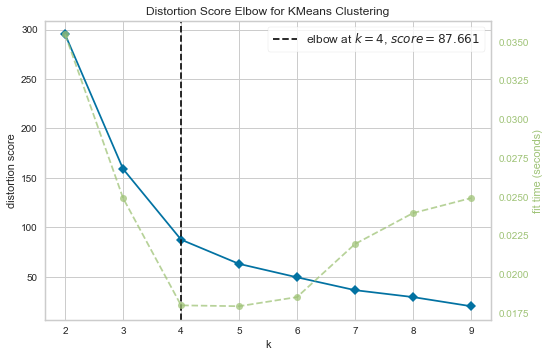

<Figure size 576x396 with 0 Axes>

In [44]:
kmax = 10
k_values = (2, kmax)

scaler = preprocessing.StandardScaler()
data = gas_commercial_by_community[dl.gas_cols]
norm_data = scaler.fit_transform(data)

km = KMeansCluster(norm_data)
km.cluster(k_values)

path = images_path / Path("ensayos/clustering_gas_tipo_zona_agrupa_ciudades/comercial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("elbow.svg"))

Con K=4 seleccionamos la mejor división.

In [45]:
km_best = km.get_kmeans_of(4)
km_labels = km_best.labels_
km_centroids = scaler.inverse_transform(km_best.cluster_centers_)

km_labels

array([1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 0, 1, 1, 1, 0,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 3, 1, 1,
       1, 1, 1, 2, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 2, 2, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1])

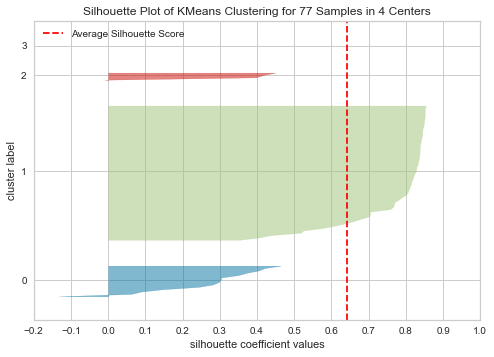

<Figure size 576x396 with 0 Axes>

In [46]:
_ = silhouette_visualizer(km_best, norm_data, colors='yellowbrick')

path = images_path / Path("ensayos/clustering_gas_tipo_zona_agrupa_ciudades/comercial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("silhouette.svg"))

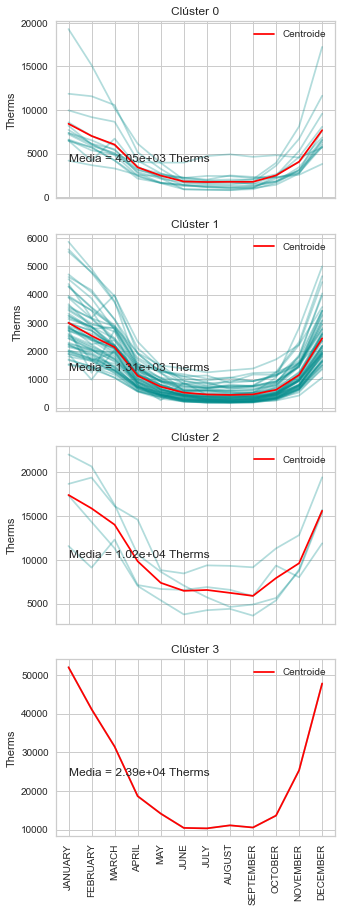

In [47]:
labels = pd.DataFrame(km_labels, columns=["label"])

k = km_centroids.shape[0]

f, axes = plt.subplots(k, 1, figsize=(5, 15), sharex=True)

for ki in range(k):
    cluster = gas_commercial_by_community.iloc[labels.query(f'label == {ki}').index][dl.gas_cols]
    palette={i:"darkcyan" for i in range(cluster.shape[0])}

    ax0 = sns.lineplot(data=cluster.values.T, ax=axes[ki], palette=palette, alpha=0.3)
    _ = [line.set_linestyle("-") for line in ax0.lines]
    
    ax0c = sns.lineplot(data=km_centroids[ki, :].T, ax=axes[ki], color="red")
    _ = [line.set_linestyle("-") for line in ax0c.lines]
    
    ax0c.legend(ax0c.lines[-1:], ["Centroide"]);
    
    ax0.set_title(f"Clúster {ki}")
    Media = km_centroids[ki, :].mean()
    ax0.text(0, Media, f"{Media = :0.2e} Therms")
    ax0.set(ylabel="Therms")
    
    ax0.set_xticks([e for e in range(0, 12)])
    ax0.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)

path = images_path / Path("ensayos/clustering_gas_tipo_zona_agrupa_ciudades/comercial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_grafica.svg"))

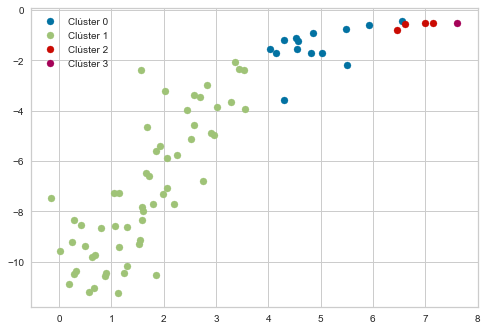

In [48]:
v = tsne(gas_commercial_by_community[dl.gas_cols], 2)
for label in range(k):
    plt.scatter(
            x=v[(labels['label']==label).values, 0],
            y=v[(labels['label']==label).values, 1]
    )
plt.legend([f"Clúster {i}" for i in range(k)])

path = images_path / Path("ensayos/clustering_gas_tipo_zona_agrupa_ciudades/comercial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_scatter.svg"))

¿Qué comunidades hay en cada clúster?

In [49]:
comunities_by_cluster = {}

for nlab in range(k):
    com_index = np.where(labels==nlab)[0]
    com_list = []
    for c in gas_commercial_by_community.values[com_index][:,0]:
        com_list.append(c)
    comunities_by_cluster[nlab] = com_list

for k in sorted(comunities_by_cluster, key=lambda k: len(comunities_by_cluster[k])):
    print(f"Al clúster {k} pertenecen las comunidades:")
    for e in comunities_by_cluster[k]:
        print("\t", e)

Al clúster 3 pertenecen las comunidades:
	 Loop
Al clúster 2 pertenecen las comunidades:
	 Burnside
	 Near North Side
	 Pullman
	 Riverdale
Al clúster 0 pertenecen las comunidades:
	 Archer Heights
	 Armour Square
	 Douglas
	 Edgewater
	 Gage Park
	 Hyde Park
	 Kenwood
	 Near South Side
	 Near West Side
	 New City
	 O'Hare
	 Portage Park
	 South Deering
	 West Lawn
Al clúster 1 pertenecen las comunidades:
	 Albany Park
	 Ashburn
	 Auburn Gresham
	 Austin
	 Avalon Park
	 Avondale
	 Belmont Cragin
	 Beverly
	 Bridgeport
	 Brighton Park
	 Calumet Heights
	 Chatham
	 Chicago Lawn
	 Clearing
	 Dunning
	 East Garfield Park
	 East Side
	 Edison Park
	 Englewood
	 Forest Glen
	 Fuller Park
	 Garfield Ridge
	 Grand Boulevard
	 Greater Grand Crossing
	 Hegewisch
	 Hermosa
	 Humboldt Park
	 Irving Park
	 Jefferson Park
	 Lakeview
	 Lincoln Park
	 Lincoln Square
	 Logan Square
	 Lower West Side
	 McKinley Park
	 Montclare
	 Morgan Park
	 Mount Greenwood
	 North Center
	 North Lawndale
	 North Park

#### Residencial

Se seleccionan las muestras de consumo medio para las zonas residenciales de cada comunidad.

In [50]:
gas_residential_by_community = gas_mean_by_community_type[gas_mean_by_community_type['BUILDING TYPE']=="Residential"]
gas_residential_by_community

,COMMUNITY AREA NAME,BUILDING TYPE,THERM JANUARY 2010,THERM FEBRUARY 2010,THERM MARCH 2010,THERM APRIL 2010,THERM MAY 2010,THERM JUNE 2010,THERM JULY 2010,THERM AUGUST 2010,THERM SEPTEMBER 2010,THERM OCTOBER 2010,THERM NOVEMBER 2010,THERM DECEMBER 2010
2,Albany Park,Residential,3241.642670,2769.778796,2315.806283,1258.925393,809.119110,453.017016,340.260471,299.039267,310.349476,378.269634,804.899215,2178.858639
5,Archer Heights,Residential,2545.916399,2156.491961,1613.273312,876.234727,541.424437,303.745981,284.848875,242.289389,257.781350,322.742765,743.231511,1967.601286
7,Armour Square,Residential,3862.246377,1321.884058,4437.101449,1282.884058,804.057971,638.521739,524.304348,535.840580,510.826087,707.594203,1762.594203,3795.260870
10,Ashburn,Residential,3909.274536,3348.224138,3204.883289,1777.124668,923.917772,646.332891,368.294430,386.696286,352.381963,445.805040,833.238727,2128.458886
12,Auburn Gresham,Residential,3406.123684,3148.660526,2421.146491,1318.972807,796.865789,401.747368,266.898246,257.805263,264.690351,471.408772,1128.202632,2890.464912
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164,West Lawn,Residential,3252.747871,2892.359455,2004.451448,1125.492334,670.580920,376.269165,348.132879,319.649063,307.131175,428.001704,964.115843,2642.299830
166,West Pullman,Residential,2077.643002,1966.321501,1413.970588,762.053753,506.345842,222.771805,179.826572,178.399594,168.265720,278.640974,696.110548,1775.339757
168,West Ridge,Residential,3534.174115,2885.684358,2397.912477,1426.387337,880.140596,459.661080,356.593110,307.603352,327.020484,424.310056,933.571695,2384.201117
171,West Town,Residential,2513.479660,2132.196114,1986.321190,969.794171,573.477231,359.237401,251.375228,227.674560,234.496053,285.306618,536.063752,1626.820886


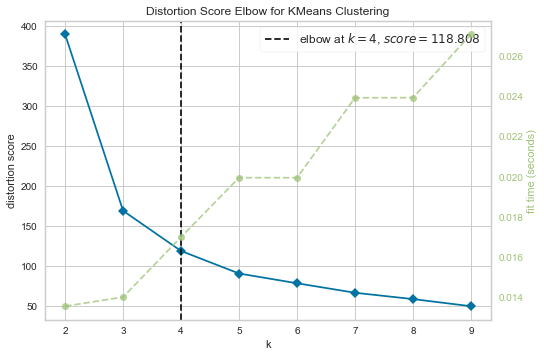

<Figure size 576x396 with 0 Axes>

In [51]:
kmax = 10
k_values = (2, kmax)

scaler = preprocessing.StandardScaler()
data = gas_residential_by_community[dl.gas_cols]
norm_data = scaler.fit_transform(data)

km = KMeansCluster(norm_data)
km.cluster(k_values)

path = images_path / Path("ensayos/clustering_gas_tipo_zona_agrupa_ciudades/residencial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("elbow.svg"))

Con k=4 tenemos la división óptima.

In [52]:
km_best = km.get_kmeans_of(4)
km_labels = km_best.labels_
km_centroids = scaler.inverse_transform(km_best.cluster_centers_)

km_labels

array([3, 0, 3, 3, 3, 3, 3, 0, 0, 3, 0, 0, 0, 3, 3, 0, 0, 1, 3, 3, 0, 3,
       3, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 3, 3, 3, 0, 2, 0, 0,
       0, 3, 3, 3, 1, 0, 0, 0, 0, 3, 3, 1, 0, 3, 0, 3, 3, 0, 0, 0, 0, 3,
       3, 3, 3, 0, 0, 0, 3, 0, 3, 0, 0])

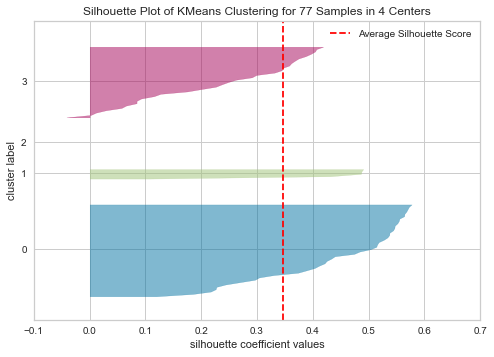

<Figure size 576x396 with 0 Axes>

In [53]:
_ = silhouette_visualizer(km_best, norm_data, colors='yellowbrick')

path = images_path / Path("ensayos/clustering_gas_tipo_zona_agrupa_ciudades/residencial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("silhouette.svg"))

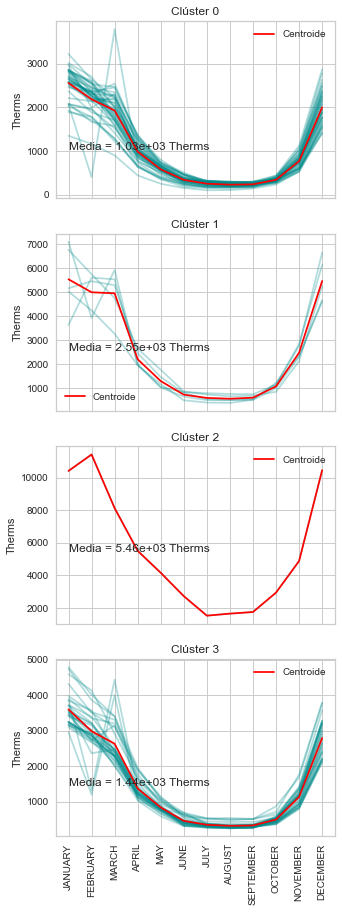

In [54]:
labels = pd.DataFrame(km_labels, columns=["label"])

k = km_centroids.shape[0]

f, axes = plt.subplots(k, 1, figsize=(5, 15), sharex=True)

for ki in range(k):
    cluster = gas_residential_by_community.iloc[labels.query(f'label == {ki}').index][dl.gas_cols]
    palette={i:"darkcyan" for i in range(cluster.shape[0])}

    ax0 = sns.lineplot(data=cluster.values.T, ax=axes[ki], palette=palette, alpha=0.3)
    _ = [line.set_linestyle("-") for line in ax0.lines]
    
    ax0c = sns.lineplot(data=km_centroids[ki, :].T, ax=axes[ki], color="red")
    _ = [line.set_linestyle("-") for line in ax0c.lines]
    
    ax0c.legend(ax0c.lines[-1:], ["Centroide"]);
    
    ax0.set_title(f"Clúster {ki}")
    Media = km_centroids[ki, :].mean()
    ax0.text(0, Media, f"{Media = :0.2e} Therms")
    ax0.set(ylabel="Therms")
    
    ax0.set_xticks([e for e in range(0, 12)])
    ax0.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)

path = images_path / Path("ensayos/clustering_gas_tipo_zona_agrupa_ciudades/residencial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_grafica.svg"))

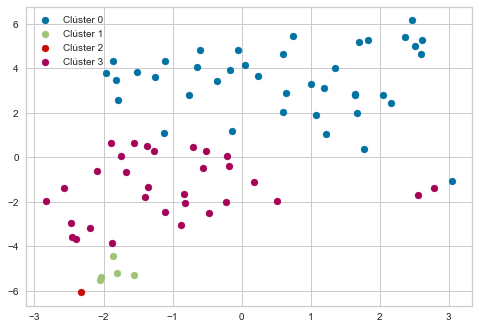

In [55]:
v = tsne(gas_residential_by_community[dl.gas_cols], 2)
for label in range(k):
    plt.scatter(
            x=v[(labels['label']==label).values, 0],
            y=v[(labels['label']==label).values, 1]
    )
plt.legend([f"Clúster {i}" for i in range(k)])

path = images_path / Path("ensayos/clustering_gas_tipo_zona_agrupa_ciudades/residencial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_scatter.svg"))

In [56]:
comunities_by_cluster = {}

for nlab in range(k):
    com_index = np.where(labels==nlab)[0]
    com_list = []
    for c in gas_residential_by_community.values[com_index][:,0]:
        com_list.append(c)
    comunities_by_cluster[nlab] = com_list

for k in sorted(comunities_by_cluster, key=lambda k: len(comunities_by_cluster[k])):
    print(f"Al clúster {k} pertenecen las comunidades:")
    for e in comunities_by_cluster[k]:
        print("\t", e)


Al clúster 2 pertenecen las comunidades:
	 Loop
Al clúster 1 pertenecen las comunidades:
	 Douglas
	 Hyde Park
	 Kenwood
	 Near South Side
	 O'Hare
Al clúster 3 pertenecen las comunidades:
	 Albany Park
	 Armour Square
	 Ashburn
	 Auburn Gresham
	 Austin
	 Avalon Park
	 Beverly
	 Calumet Heights
	 Chatham
	 Dunning
	 East Garfield Park
	 Edgewater
	 Edison Park
	 Forest Glen
	 Lakeview
	 Lincoln Park
	 Lincoln Square
	 Morgan Park
	 Mount Greenwood
	 Near North Side
	 North Park
	 Norwood Park
	 Portage Park
	 Riverdale
	 Rogers Park
	 South Shore
	 Uptown
	 Washington Heights
	 Washington Park
	 West Lawn
	 West Ridge
Al clúster 0 pertenecen las comunidades:
	 Archer Heights
	 Avondale
	 Belmont Cragin
	 Bridgeport
	 Brighton Park
	 Burnside
	 Chicago Lawn
	 Clearing
	 East Side
	 Englewood
	 Fuller Park
	 Gage Park
	 Garfield Ridge
	 Grand Boulevard
	 Greater Grand Crossing
	 Hegewisch
	 Hermosa
	 Humboldt Park
	 Irving Park
	 Jefferson Park
	 Logan Square
	 Lower West Side
	 McKinle

#### Industrial

Se seleccionan las muestras de consumo medio para las zonas industriales de cada comunidad.

In [57]:
gas_industrial_by_community = gas_mean_by_community_type[gas_mean_by_community_type['BUILDING TYPE']=="Industrial"]
gas_industrial_by_community

,COMMUNITY AREA NAME,BUILDING TYPE,THERM JANUARY 2010,THERM FEBRUARY 2010,THERM MARCH 2010,THERM APRIL 2010,THERM MAY 2010,THERM JUNE 2010,THERM JULY 2010,THERM AUGUST 2010,THERM SEPTEMBER 2010,THERM OCTOBER 2010,THERM NOVEMBER 2010,THERM DECEMBER 2010
1,Albany Park,Industrial,2146.0,1963.000000,1967.000000,1038.000000,681.000000,475.000000,336.0,344.000000,486.000000,549.000000,621.000000,1227.000000
4,Archer Heights,Industrial,955.0,815.000000,713.000000,586.000000,442.000000,367.000000,363.0,328.000000,330.000000,330.000000,402.000000,651.000000
9,Ashburn,Industrial,930.0,940.000000,978.000000,368.000000,246.000000,104.000000,11.0,18.000000,11.000000,18.000000,126.000000,380.000000
14,Austin,Industrial,18043.5,17736.000000,15444.500000,6863.000000,5171.000000,2614.500000,3016.0,2598.000000,3047.000000,4616.000000,7567.500000,14517.000000
27,Brighton Park,Industrial,331.0,66.000000,205.000000,93.000000,65.000000,43.000000,28.0,33.000000,19.000000,38.000000,86.000000,191.000000
46,East Side,Industrial,2587.0,2152.000000,1263.000000,404.000000,242.000000,7.000000,6.0,6.000000,6.000000,40.000000,260.000000,1759.000000
49,Edgewater,Industrial,797.0,749.000000,511.500000,232.000000,148.500000,93.500000,78.0,84.000000,102.000000,117.500000,272.000000,844.500000
56,Forest Glen,Industrial,1126.0,921.000000,592.000000,362.000000,228.000000,160.000000,243.0,192.000000,179.000000,230.000000,396.000000,1046.000000
61,Gage Park,Industrial,24.0,30.000000,25.000000,15.000000,24.000000,15.000000,19.0,12.000000,13.000000,14.000000,12.000000,18.000000
72,Hermosa,Industrial,2157.0,1434.000000,1022.000000,499.000000,152.000000,55.000000,46.0,28.000000,25.000000,102.000000,248.000000,1544.000000


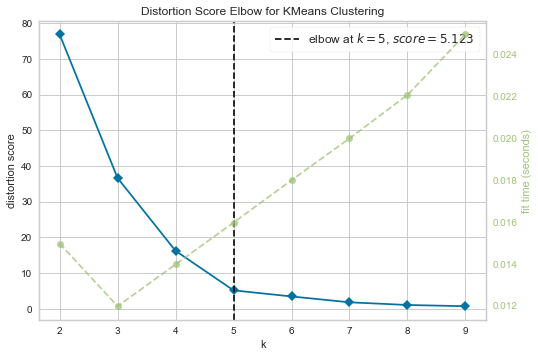

<Figure size 576x396 with 0 Axes>

In [58]:
kmax = 10
k_values = (2, kmax)

scaler = preprocessing.StandardScaler()
data = gas_industrial_by_community[dl.gas_cols]
norm_data = scaler.fit_transform(data)

km = KMeansCluster(norm_data)
km.cluster(k_values)

path = images_path / Path("ensayos/clustering_gas_tipo_zona_agrupa_ciudades/industrial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("elbow.svg"))

En k=5 tenemos el punto codo, por lo que seleccionamos ese número de clústeres.

In [59]:
km_best = km.get_kmeans_of(5)
km_labels = km_best.labels_
km_centroids = scaler.inverse_transform(km_best.cluster_centers_)

km_labels

array([0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 4, 3, 0, 0, 3, 0])

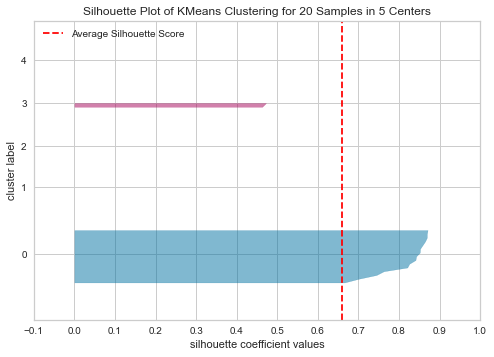

<Figure size 576x396 with 0 Axes>

In [60]:
_ = silhouette_visualizer(km_best, norm_data, colors='yellowbrick')

path = images_path / Path("ensayos/clustering_gas_tipo_zona_agrupa_ciudades/industrial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("silhouette.svg"))

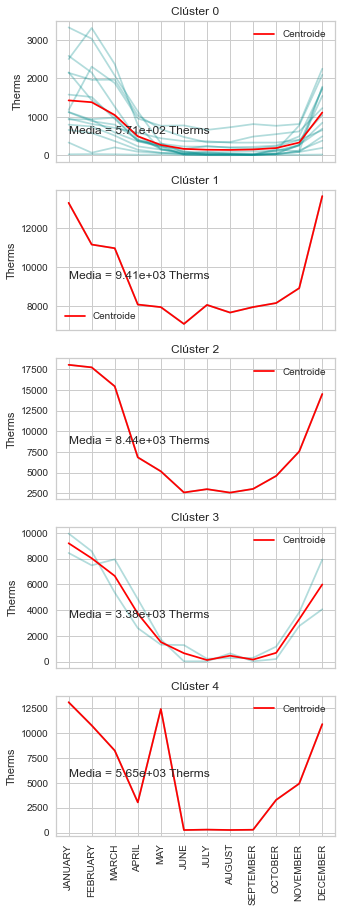

In [61]:
labels = pd.DataFrame(km_labels, columns=["label"])

k = km_centroids.shape[0]

f, axes = plt.subplots(k, 1, figsize=(5, 15), sharex=True)

for ki in range(k):
    cluster = gas_industrial_by_community.iloc[labels.query(f'label == {ki}').index][dl.gas_cols]
    palette={i:"darkcyan" for i in range(cluster.shape[0])}

    ax0 = sns.lineplot(data=cluster.values.T, ax=axes[ki], palette=palette, alpha=0.3)
    _ = [line.set_linestyle("-") for line in ax0.lines]
    
    ax0c = sns.lineplot(data=km_centroids[ki, :].T, ax=axes[ki], color="red")
    _ = [line.set_linestyle("-") for line in ax0c.lines]
    
    ax0c.legend(ax0c.lines[-1:], ["Centroide"]);
    
    ax0.set_title(f"Clúster {ki}")
    Media = km_centroids[ki, :].mean()
    ax0.text(0, Media, f"{Media = :0.2e} Therms")
    ax0.set(ylabel="Therms")
    
    ax0.set_xticks([e for e in range(0, 12)])
    ax0.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)

path = images_path / Path("ensayos/clustering_gas_tipo_zona_agrupa_ciudades/industrial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_grafica.svg"))

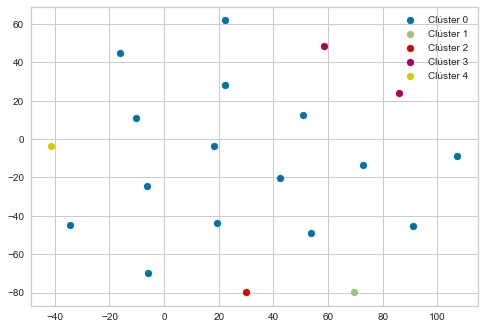

In [62]:
v = tsne(gas_industrial_by_community[dl.gas_cols], 2)
for label in range(k):
    plt.scatter(
            x=v[(labels['label']==label).values, 0],
            y=v[(labels['label']==label).values, 1]
    )
plt.legend([f"Clúster {i}" for i in range(k)])

path = images_path / Path("ensayos/clustering_gas_tipo_zona_agrupa_ciudades/industrial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_scatter.svg"))

In [63]:
v = tsne(gas_industrial_by_community[dl.gas_cols], 3)

fig = go.Figure()
for label in range(k):
    fig.add_trace(
        go.Scatter3d(
            x=v[(labels['label']==label).values, 0],
            y=v[(labels['label']==label).values, 1],
            z=v[(labels['label']==label).values, 2]
        )
    )
fig.show()

path = images_path / Path("ensayos/clustering_gas_tipo_zona_agrupa_ciudades/industrial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_scatter3d.svg"))

<Figure size 576x396 with 0 Axes>

In [64]:
comunities_by_cluster = {}

for nlab in range(k):
    com_index = np.where(labels==nlab)[0]
    com_list = []
    for c in energy_commercial_by_community.values[com_index][:,0]:
        com_list.append(c)
    comunities_by_cluster[nlab] = com_list

for k in sorted(comunities_by_cluster, key=lambda k: len(comunities_by_cluster[k])):
    print(f"Al clúster {k} pertenecen las comunidades:")
    for e in comunities_by_cluster[k]:
        print("\t", e)

Al clúster 1 pertenecen las comunidades:
	 Calumet Heights
Al clúster 2 pertenecen las comunidades:
	 Ashburn
Al clúster 4 pertenecen las comunidades:
	 Chatham
Al clúster 3 pertenecen las comunidades:
	 Chicago Lawn
	 Dunning
Al clúster 0 pertenecen las comunidades:
	 Albany Park
	 Archer Heights
	 Armour Square
	 Auburn Gresham
	 Austin
	 Avalon Park
	 Avondale
	 Belmont Cragin
	 Beverly
	 Bridgeport
	 Brighton Park
	 Burnside
	 Clearing
	 Douglas
	 East Garfield Park


### [Volver al inicio](#Consumo-de-energía-en-Chicago-en-2010)

---

### Clustering de energía para cada comunidad observando patrones para cada bloque

En este caso seleccionaremos la comunidad con más consumo para cada tipo encontrada anteriormente, y estudiaremos los patrones de consumo entre todos los bloques de dicha comunidad para cada tipo de comunidad (industrial, comercial y residencial).

In [65]:
energy_df = dl[["COMMUNITY AREA NAME", "CENSUS BLOCK", "BUILDING TYPE", "BUILDING_SUBTYPE"] + dl.energy_cols]
communities = dl['COMMUNITY AREA NAME'].drop_duplicates()
communities

0          Archer Heights
1                 Ashburn
2          Auburn Gresham
3                  Austin
12               Avondale
              ...        
591           West Elsdon
602         South Deering
607    Washington Heights
736       Mount Greenwood
740       Near South Side
Name: COMMUNITY AREA NAME, Length: 77, dtype: object

#### Comercial

La comunidad *Loop* es la que más electricidad consumió, por lo que seleccionamos dicha comunidad.

In [66]:
commercial_loop = energy_df[(energy_df["COMMUNITY AREA NAME"] == "Loop") & (energy_df["BUILDING TYPE"] == "Commercial")]
commercial_loop

,COMMUNITY AREA NAME,CENSUS BLOCK,BUILDING TYPE,BUILDING_SUBTYPE,KWH JANUARY 2010,KWH FEBRUARY 2010,KWH MARCH 2010,KWH APRIL 2010,KWH MAY 2010,KWH JUNE 2010,KWH JULY 2010,KWH AUGUST 2010,KWH SEPTEMBER 2010,KWH OCTOBER 2010,KWH NOVEMBER 2010,KWH DECEMBER 2010
120,Loop,1.703184e+14,Commercial,Multi 7+,73300.0,73177.0,55407.0,40004.0,41641.0,46163.0,58720.0,52091.0,53757.0,48746.0,75111.0,119320.0
121,Loop,1.703184e+14,Commercial,Commercial,1937016.0,1612999.0,1378571.0,1299736.0,1376510.0,1453082.0,1448453.0,1373392.0,1313078.0,1180224.0,2100492.0,2229423.0
354,Loop,1.703132e+14,Commercial,Commercial,1931433.0,1702836.0,1708126.0,1922289.0,2076298.0,1972560.0,2338763.0,2375021.0,2122579.0,1554759.0,1863090.0,2003699.0
945,Loop,1.703184e+14,Commercial,Commercial,2370788.0,2119876.0,2082421.0,2087045.0,2270125.0,3095521.0,3011561.0,2884957.0,2371234.0,2128850.0,2341563.0,2729045.0
946,Loop,1.703184e+14,Commercial,Municipal,1775651.0,1433137.0,1393901.0,1171420.0,1397811.0,1562200.0,1565775.0,1400773.0,1353486.0,1327522.0,1697576.0,2130009.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38591,Loop,1.703184e+14,Commercial,Commercial,306959.0,280224.0,134944.0,95925.0,132642.0,150710.0,219940.0,187643.0,173423.0,137245.0,239216.0,446574.0
38592,Loop,1.703184e+14,Commercial,Commercial,42600.0,485192.0,510282.0,522265.0,607110.0,510410.0,593315.0,620349.0,557672.0,512367.0,514068.0,463212.0
38593,Loop,1.703184e+14,Commercial,Commercial,247181.0,209955.0,213677.0,220961.0,303981.0,308345.0,388278.0,370715.0,294093.0,242598.0,203601.0,237975.0
38594,Loop,1.703184e+14,Commercial,Multi 7+,50822.0,46418.0,40971.0,35079.0,47196.0,53944.0,77830.0,66578.0,62182.0,41404.0,46031.0,61226.0


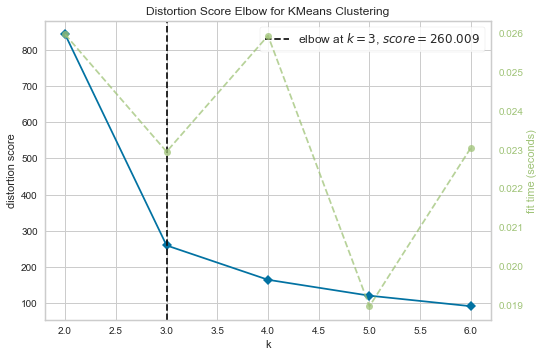

<Figure size 576x396 with 0 Axes>

In [67]:
kmax = 7
k_values = (2, kmax)

scaler = preprocessing.StandardScaler()

data = commercial_loop[dl.energy_cols]
norm_data = scaler.fit_transform(data)

km = KMeansCluster(norm_data)
km.cluster(k_values)

path = images_path / Path("ensayos/clustering_energia_por_comunidad_observando_patrones/comercial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("elbow.svg"))

Con k=3 tenemos una división óptima.

In [68]:
km_best = km.get_kmeans_of(3)
km_labels = km_best.labels_
km_centroids = scaler.inverse_transform(km_best.cluster_centers_)

km_labels

array([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 2, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0,
       1, 0, 0, 0, 0, 1, 1, 1, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

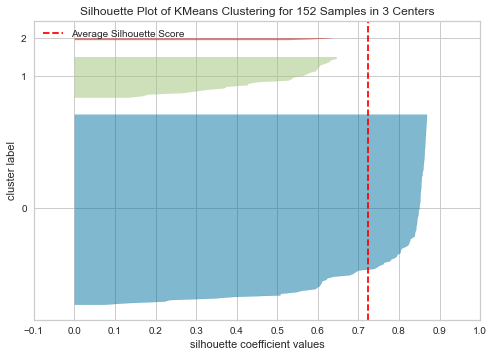

<Figure size 576x396 with 0 Axes>

In [69]:
_ = silhouette_visualizer(km_best, norm_data, colors='yellowbrick')

path = images_path / Path("ensayos/clustering_energia_por_comunidad_observando_patrones/comercial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("silhouette.svg"))

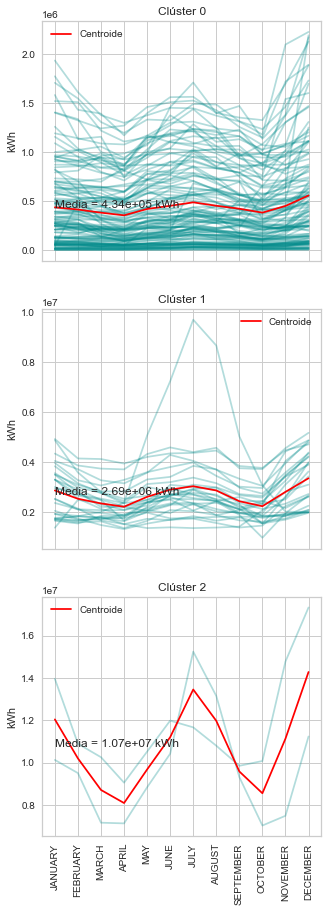

In [70]:
labels = pd.DataFrame(km_labels, columns=["label"])

k = km_centroids.shape[0]

f, axes = plt.subplots(k, 1, figsize=(5, 15), sharex=True)

for ki in range(k):
    cluster = commercial_loop.iloc[labels.query(f'label == {ki}').index][dl.energy_cols]
    palette={i:"darkcyan" for i in range(cluster.shape[0])}

    ax0 = sns.lineplot(data=cluster.values.T, ax=axes[ki], palette=palette, alpha=0.3)
    _ = [line.set_linestyle("-") for line in ax0.lines]
    
    ax0c = sns.lineplot(data=km_centroids[ki, :].T, ax=axes[ki], color="red")
    _ = [line.set_linestyle("-") for line in ax0c.lines]
    
    ax0c.legend(ax0c.lines[-1:], ["Centroide"]);
    
    ax0.set_title(f"Clúster {ki}")
    Media = km_centroids[ki, :].mean()
    ax0.text(0, Media, f"{Media = :0.2e} kWh")
    ax0.set(ylabel="kWh")
    
    ax0.set_xticks([e for e in range(0, 12)])
    ax0.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)

path = images_path / Path("ensayos/clustering_energia_por_comunidad_observando_patrones/comercial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_grafica.svg"))

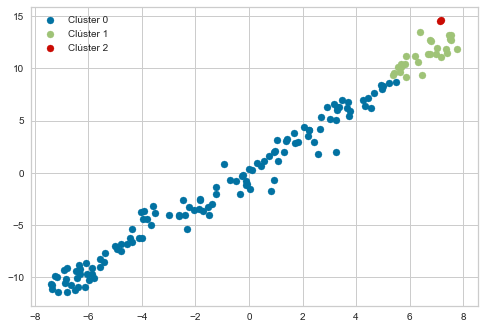

In [71]:
v = tsne(commercial_loop[dl.energy_cols], 2)
for label in range(k):
    plt.scatter(
            x=v[(labels['label']==label).values, 0],
            y=v[(labels['label']==label).values, 1]
    )
plt.legend([f"Clúster {i}" for i in range(k)])

path = images_path / Path("ensayos/clustering_energia_por_comunidad_observando_patrones/comercial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_scatter.svg"))

In [72]:
comunities_by_cluster = {}

for nlab in range(k):
    com_index = np.where(labels==nlab)[0]
    com_list = []
    for c in commercial_loop.values[com_index][:,(0,1,3)]:
        com_list.append(c)
    comunities_by_cluster[nlab] = com_list

for k in sorted(comunities_by_cluster, key=lambda k: len(comunities_by_cluster[k])):
    print(f"Al clúster {k} pertenecen las comunidades:")
    for e in comunities_by_cluster[k]:
        print("\t", e)


Al clúster 2 pertenecen las comunidades:
	 ['Loop' 170313201001005.0 'Commercial']
	 ['Loop' 170318391002006.0 'Commercial']
Al clúster 1 pertenecen las comunidades:
	 ['Loop' 170313201001016.0 'Commercial']
	 ['Loop' 170318391001083.0 'Commercial']
	 ['Loop' 170313201002030.0 'Municipal']
	 ['Loop' 170313201001017.0 'Commercial']
	 ['Loop' 170313201002016.0 'Commercial']
	 ['Loop' 170313201002030.0 'Commercial']
	 ['Loop' 170313201002032.0 'Commercial']
	 ['Loop' 170313201002034.0 'Commercial']
	 ['Loop' 170313201003008.0 'Commercial']
	 ['Loop' 170313201004020.0 'Multi 7+']
	 ['Loop' 170313204001011.0 'Commercial']
	 ['Loop' 170313204001012.0 'Commercial']
	 ['Loop' 170318391001018.0 'Commercial']
	 ['Loop' 170318391001020.0 'Commercial']
	 ['Loop' 170318391001035.0 'Commercial']
	 ['Loop' 170318391001036.0 'Commercial']
	 ['Loop' 170318391001050.0 'Commercial']
	 ['Loop' 170318391001058.0 'Commercial']
	 ['Loop' 170318391001070.0 'Commercial']
	 ['Loop' 170318391001072.0 'Commercial

#### Residencial

En las zonas residenciales, *Loop* también fue la que más consumió.

In [73]:
residential_loop = energy_df[(energy_df["COMMUNITY AREA NAME"] == "Loop") & (energy_df["BUILDING TYPE"] == "Residential")]
residential_loop

,COMMUNITY AREA NAME,CENSUS BLOCK,BUILDING TYPE,BUILDING_SUBTYPE,KWH JANUARY 2010,KWH FEBRUARY 2010,KWH MARCH 2010,KWH APRIL 2010,KWH MAY 2010,KWH JUNE 2010,KWH JULY 2010,KWH AUGUST 2010,KWH SEPTEMBER 2010,KWH OCTOBER 2010,KWH NOVEMBER 2010,KWH DECEMBER 2010
21904,Loop,1.703132e+14,Residential,Multi < 7,4576.0,5264.0,4321.0,3977.0,5025.0,7709.0,8728.0,8350.0,9765.0,6754.0,6048.0,6631.0
38489,Loop,1.703132e+14,Residential,Multi 7+,12625.0,12072.0,11304.0,10223.0,12654.0,13221.0,19326.0,15676.0,11690.0,9369.0,13157.0,14402.0
38491,Loop,1.703132e+14,Residential,Multi 7+,31735.0,31549.0,30020.0,27812.0,38957.0,43405.0,57833.0,54271.0,39998.0,35803.0,34729.0,44797.0
38501,Loop,1.703132e+14,Residential,Multi 7+,150389.0,156138.0,153203.0,162340.0,223682.0,240178.0,329181.0,309317.0,224617.0,194145.0,221436.0,269572.0
38513,Loop,1.703184e+14,Residential,Single Family,690.0,887.0,1248.0,881.0,1724.0,1910.0,2020.0,1439.0,620.0,371.0,2386.0,1112.0


C:\Users\Alberto\miniconda3\envs\cdi-musiani-env\lib\site-packages\yellowbrick\utils\kneed.py:140: YellowbrickWarning:

No 'knee' or 'elbow point' detected This could be due to bad clustering, no actual clusters being formed etc.

C:\Users\Alberto\miniconda3\envs\cdi-musiani-env\lib\site-packages\yellowbrick\cluster\elbow.py:343: YellowbrickWarning:

No 'knee' or 'elbow' point detected, pass `locate_elbow=False` to remove the warning



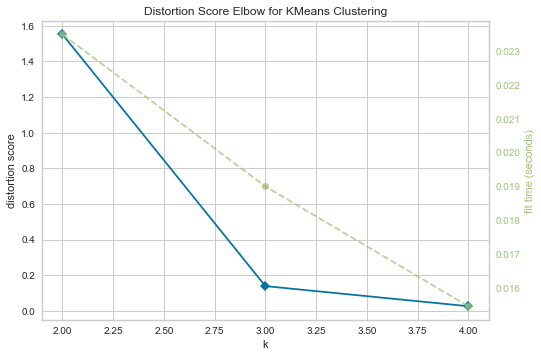

<Figure size 576x396 with 0 Axes>

In [74]:
kmax = 5
k_values = (2, kmax)

scaler = preprocessing.StandardScaler()
data = residential_loop[dl.energy_cols]
norm_data = scaler.fit_transform(data)

km = KMeansCluster(norm_data)
km.cluster(k_values)

path = images_path / Path("ensayos/clustering_energia_por_comunidad_observando_patrones/residencial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("elbow.svg"))

En este caso, el algoritmo no ha sido capaz de encontrar el punto codo. Aún así, seleccionaremos K=3.

In [75]:
km_best = km.get_kmeans_of(3)
km_labels = km_best.labels_
km_centroids = scaler.inverse_transform(km_best.cluster_centers_)

km_labels

array([1, 1, 2, 0, 1])

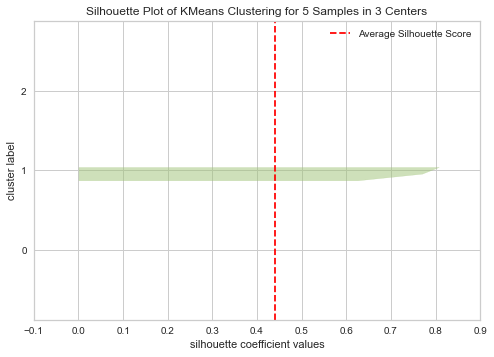

<Figure size 576x396 with 0 Axes>

In [76]:
_ = silhouette_visualizer(km_best, norm_data, colors='yellowbrick')

path = images_path / Path("ensayos/clustering_energia_por_comunidad_observando_patrones/residencial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("silhouette.svg"))

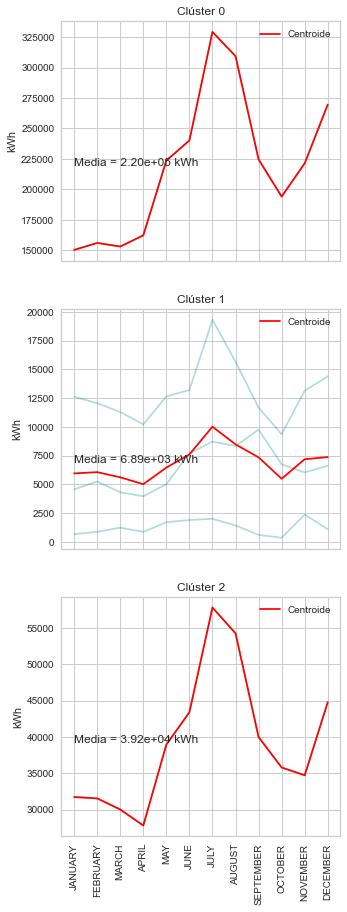

In [77]:
labels = pd.DataFrame(km_labels, columns=["label"])

k = km_centroids.shape[0]

f, axes = plt.subplots(k, 1, figsize=(5, 15), sharex=True)

for ki in range(k):
    cluster = residential_loop.iloc[labels.query(f'label == {ki}').index][dl.energy_cols]
    palette={i:"darkcyan" for i in range(cluster.shape[0])}

    ax0 = sns.lineplot(data=cluster.values.T, ax=axes[ki], palette=palette, alpha=0.3)
    _ = [line.set_linestyle("-") for line in ax0.lines]
    
    ax0c = sns.lineplot(data=km_centroids[ki, :].T, ax=axes[ki], color="red")
    _ = [line.set_linestyle("-") for line in ax0c.lines]
    
    ax0c.legend(ax0c.lines[-1:], ["Centroide"]);
    
    ax0.set_title(f"Clúster {ki}")
    Media = km_centroids[ki, :].mean()
    ax0.text(0, Media, f"{Media = :0.2e} kWh")
    ax0.set(ylabel="kWh")
    
    ax0.set_xticks([e for e in range(0, 12)])
    ax0.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)

path = images_path / Path("ensayos/clustering_energia_por_comunidad_observando_patrones/residencial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_grafica.svg"))

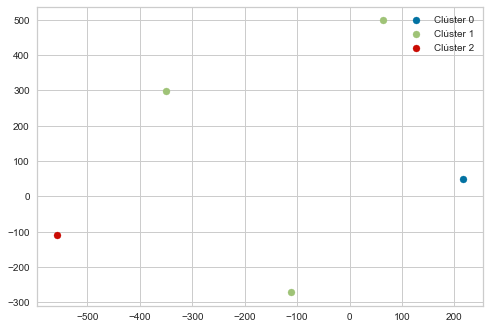

In [78]:
v = tsne(residential_loop[dl.energy_cols], 2)
for label in range(k):
    plt.scatter(
            x=v[(labels['label']==label).values, 0],
            y=v[(labels['label']==label).values, 1]
    )
plt.legend([f"Clúster {i}" for i in range(k)])

path = images_path / Path("ensayos/clustering_energia_por_comunidad_observando_patrones/residencial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_scatter.svg"))

In [79]:
v = tsne(residential_loop[dl.energy_cols], 3)

fig = go.Figure()
for label in range(k):
    fig.add_trace(
        go.Scatter3d(
            x=v[(labels['label']==label).values, 0],
            y=v[(labels['label']==label).values, 1],
            z=v[(labels['label']==label).values, 2]
        )
    )
fig.show()

path = images_path / Path("ensayos/clustering_energia_por_comunidad_observando_patrones/residencial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_scatter3d.svg"))

<Figure size 576x396 with 0 Axes>

In [80]:
comunities_by_cluster = {}

for nlab in range(k):
    com_index = np.where(labels==nlab)[0]
    com_list = []
    for c in residential_loop.values[com_index][:,(0,1,3)]:
        com_list.append(c)
    comunities_by_cluster[nlab] = com_list

for k in sorted(comunities_by_cluster, key=lambda k: len(comunities_by_cluster[k])):
    print(f"Al clúster {k} pertenecen las comunidades:")
    for e in comunities_by_cluster[k]:
        print("\t", e)


Al clúster 0 pertenecen las comunidades:
	 ['Loop' 170313206002013.0 'Multi 7+']
Al clúster 2 pertenecen las comunidades:
	 ['Loop' 170313206001009.0 'Multi 7+']
Al clúster 1 pertenecen las comunidades:
	 ['Loop' 170313201002015.0 'Multi < 7']
	 ['Loop' 170313206001008.0 'Multi 7+']
	 ['Loop' 170318390002003.0 'Single Family']


#### Industrial

En el caso de las zonas industriales, *Near West Side* fue una de las que más consumió electricidad.

In [81]:
industrial_loop = energy_df[(energy_df["COMMUNITY AREA NAME"] == "Near West Side") & (energy_df["BUILDING TYPE"] == "Industrial")]
industrial_loop

,COMMUNITY AREA NAME,CENSUS BLOCK,BUILDING TYPE,BUILDING_SUBTYPE,KWH JANUARY 2010,KWH FEBRUARY 2010,KWH MARCH 2010,KWH APRIL 2010,KWH MAY 2010,KWH JUNE 2010,KWH JULY 2010,KWH AUGUST 2010,KWH SEPTEMBER 2010,KWH OCTOBER 2010,KWH NOVEMBER 2010,KWH DECEMBER 2010
16299,Near West Side,1.703128e+14,Industrial,Industrial,21214017.0,21065500.0,16121105.0,17310058.0,15938553.0,20209197.0,17287870.0,18493853.0,19280342.0,17100282.0,18671279.0,25060008.0
42543,Near West Side,1.703183e+14,Industrial,Industrial,25445.0,22534.0,20547.0,30382.0,40722.0,48960.0,51211.0,53044.0,34103.0,27225.0,29469.0,32424.0
42571,Near West Side,1.703183e+14,Industrial,Industrial,5966.0,3779.0,2893.0,2219.0,3597.0,5018.0,8110.0,6890.0,3403.0,2693.0,4456.0,5290.0


Existen pocas muestras para aplicar clustering, por lo que mostramos cada una de las gráficas directamente.

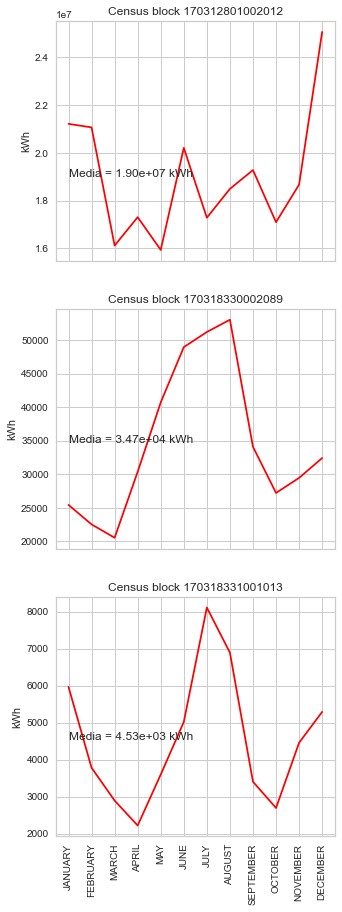

In [82]:
f, axes = plt.subplots(3, 1, figsize=(5, 15), sharex=True)

for i, (census_num, (index, row)) in enumerate(zip(industrial_loop['CENSUS BLOCK'], industrial_loop[dl.energy_cols].iterrows())):
    ax0 = sns.lineplot(data=row.T, ax=axes[i], color="red")
    
    ax0.set_xticks([e for e in range(0, 12)])
    ax0.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)
    
    ax0.set_title(f"Census block {int(census_num)}")
    Media = row.mean()
    ax0.text(0, Media, f"{Media = :0.2e} kWh")
    
    ax0.set(ylabel="kWh")

path = images_path / Path("ensayos/clustering_energia_por_comunidad_observando_patrones/industrial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_grafica.svg"))

### [Volver al inicio](#Consumo-de-energía-en-Chicago-en-2010)

---

### Clustering de gas para cada comunidad observando patrones en cada bloque

Igual que en el caso anterior, seleccionaremos la comunidad con más consumo para cada tipo encontrada, y estudiaremos los patrones de consumo entre todos los bloques de dicha comunidad para cada tipo de comunidad (industrial, comercial y residencial).

In [83]:
gas_df = dl[["COMMUNITY AREA NAME", "CENSUS BLOCK", "BUILDING TYPE", "BUILDING_SUBTYPE"] + dl.gas_cols]
gas_df

,COMMUNITY AREA NAME,CENSUS BLOCK,BUILDING TYPE,BUILDING_SUBTYPE,THERM JANUARY 2010,THERM FEBRUARY 2010,THERM MARCH 2010,THERM APRIL 2010,THERM MAY 2010,THERM JUNE 2010,THERM JULY 2010,THERM AUGUST 2010,THERM SEPTEMBER 2010,THERM OCTOBER 2010,THERM NOVEMBER 2010,THERM DECEMBER 2010
0,Archer Heights,1.703157e+14,Residential,Multi < 7,2326.0,2131.0,1400.0,620.0,502.0,224.0,222.0,187.0,197.0,252.0,744.0,2112.0
6,Austin,1.703125e+14,Commercial,Commercial,3041.0,2680.0,1151.0,373.0,124.0,26.0,29.0,25.0,49.0,177.0,670.0,3895.0
11,Austin,1.703125e+14,Commercial,Multi < 7,910.0,738.0,632.0,448.0,254.0,113.0,42.0,29.0,33.0,36.0,166.0,633.0
13,Avondale,1.703121e+14,Commercial,Multi < 7,535.0,458.0,481.0,307.0,194.0,145.0,119.0,102.0,88.0,109.0,141.0,249.0
19,Avondale,1.703121e+14,Residential,Multi < 7,285.0,285.0,244.0,129.0,73.0,46.0,39.0,27.0,39.0,29.0,50.0,144.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67046,Woodlawn,1.703184e+14,Residential,Single Family,2166.0,1681.0,1858.0,1172.0,708.0,360.0,72.0,67.0,77.0,185.0,623.0,1800.0
67047,Woodlawn,1.703184e+14,Commercial,Multi < 7,985.0,1152.0,1238.0,630.0,475.0,192.0,141.0,162.0,144.0,210.0,653.0,1744.0
67048,Woodlawn,1.703184e+14,Residential,Multi < 7,2202.0,1874.0,1647.0,906.0,645.0,346.0,84.0,150.0,150.0,260.0,694.0,1335.0
67049,Woodlawn,1.703184e+14,Residential,Single Family,95.0,11.0,47.0,9.0,45.0,18.0,22.0,9.0,17.0,11.0,18.0,13.0


#### Comercial

Entre las zonas comerciales, seleccionamos a *Loop*.

In [84]:
commercial_loop = gas_df[(gas_df["COMMUNITY AREA NAME"] == "Loop") & (gas_df["BUILDING TYPE"] == "Commercial")]
commercial_loop

,COMMUNITY AREA NAME,CENSUS BLOCK,BUILDING TYPE,BUILDING_SUBTYPE,THERM JANUARY 2010,THERM FEBRUARY 2010,THERM MARCH 2010,THERM APRIL 2010,THERM MAY 2010,THERM JUNE 2010,THERM JULY 2010,THERM AUGUST 2010,THERM SEPTEMBER 2010,THERM OCTOBER 2010,THERM NOVEMBER 2010,THERM DECEMBER 2010
38278,Loop,1.703132e+14,Commercial,Commercial,3442.0,2174.0,2078.0,555.0,519.0,523.0,481.0,543.0,515.0,473.0,768.0,1941.0
38421,Loop,1.703132e+14,Commercial,Municipal,547.0,4673.0,2140.0,1982.0,1712.0,1687.0,1977.0,1873.0,1779.0,2129.0,2126.0,2720.0
38441,Loop,1.703132e+14,Commercial,Commercial,26533.0,22582.0,19806.0,16489.0,10517.0,6900.0,16185.0,12766.0,12725.0,14340.0,16231.0,25151.0
38442,Loop,1.703132e+14,Commercial,Municipal,37793.0,33336.0,23741.0,7320.0,4528.0,1217.0,1173.0,1146.0,898.0,4245.0,18462.0,35026.0
38443,Loop,1.703132e+14,Commercial,Commercial,33314.0,22873.0,7441.0,3285.0,2171.0,396.0,474.0,311.0,576.0,3903.0,8656.0,28522.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38590,Loop,1.703184e+14,Commercial,Commercial,61037.0,64632.0,42911.0,21841.0,13181.0,6048.0,5479.0,6179.0,5863.0,8865.0,22988.0,60728.0
38591,Loop,1.703184e+14,Commercial,Commercial,30412.0,30380.0,23747.0,5349.0,152.0,258.0,108.0,93.0,287.0,603.0,3774.0,48667.0
38592,Loop,1.703184e+14,Commercial,Commercial,12883.0,11253.0,10453.0,4450.0,1684.0,103.0,124.0,140.0,101.0,1222.0,6670.0,11681.0
38593,Loop,1.703184e+14,Commercial,Commercial,25955.0,20581.0,13942.0,8535.0,6481.0,3076.0,2967.0,1428.0,4041.0,7933.0,13596.0,25341.0


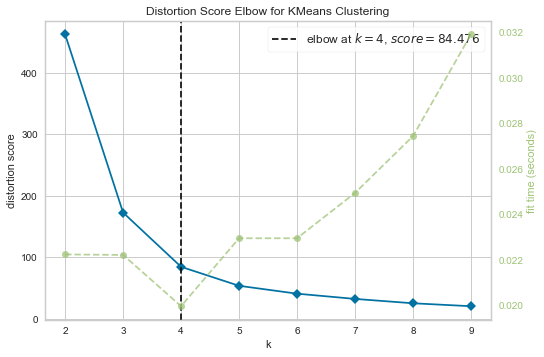

<Figure size 576x396 with 0 Axes>

In [85]:
kmax = 10
k_values = (2, kmax)

scaler = preprocessing.StandardScaler()
data = commercial_loop[dl.gas_cols]
norm_data = scaler.fit_transform(data)

km = KMeansCluster(norm_data)
km.cluster(k_values)

path = images_path / Path("ensayos/clustering_gas_por_comunidad_observando_patrones/comercial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("elbow.svg"))

In [86]:
km_best = km.get_kmeans_of(4)
km_labels = km_best.labels_
km_centroids = scaler.inverse_transform(km_best.cluster_centers_)

km_labels

array([3, 3, 3, 3, 3, 3, 0, 0, 2, 3, 2, 3, 3, 3, 3, 3, 3, 3, 0, 0, 0, 3,
       1, 0, 3, 2, 0, 2, 3, 0, 0, 2, 2, 0, 3, 3, 3, 0, 3, 3, 0, 0, 3, 0,
       3, 3, 3, 3, 0, 3, 3, 3, 0, 3, 3, 3, 0, 3, 3, 0, 3, 3, 0, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 0, 3, 3, 3, 3, 0, 3, 0, 3, 0, 3, 3, 3, 0,
       0, 3, 3, 0, 3, 3, 3, 0, 3, 0, 0, 0, 0, 3, 3, 3, 3, 3, 3, 3, 0, 0,
       3, 2, 3, 3, 3, 0, 3, 3, 3, 0, 3, 3, 3, 3, 3, 3, 3, 0, 3, 3, 3, 3])

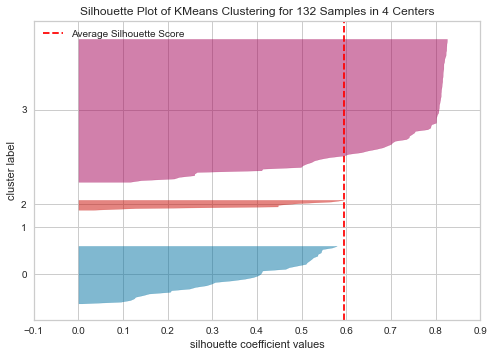

<Figure size 576x396 with 0 Axes>

In [87]:
_ = silhouette_visualizer(km_best, norm_data, colors='yellowbrick')

path = images_path / Path("ensayos/clustering_gas_por_comunidad_observando_patrones/comercial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("silhouette.svg"))

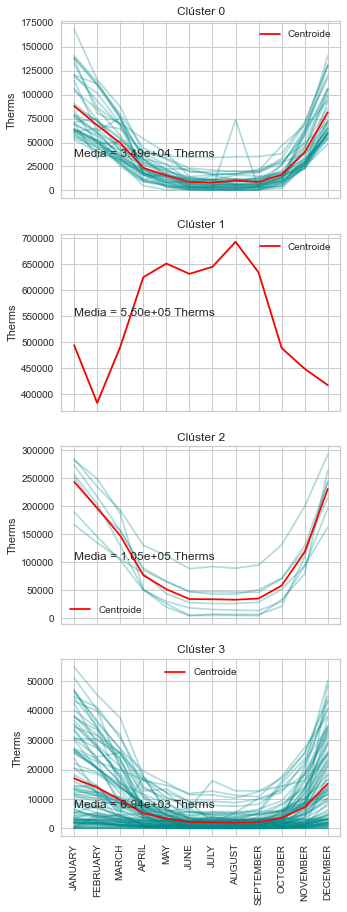

In [88]:
labels = pd.DataFrame(km_labels, columns=["label"])

k = km_centroids.shape[0]

f, axes = plt.subplots(k, 1, figsize=(5, 15), sharex=True)

for ki in range(k):
    cluster = commercial_loop.iloc[labels.query(f'label == {ki}').index][dl.gas_cols]
    palette={i:"darkcyan" for i in range(cluster.shape[0])}

    ax0 = sns.lineplot(data=cluster.values.T, ax=axes[ki], palette=palette, alpha=0.3)
    _ = [line.set_linestyle("-") for line in ax0.lines]
    
    ax0c = sns.lineplot(data=km_centroids[ki, :].T, ax=axes[ki], color="red")
    _ = [line.set_linestyle("-") for line in ax0c.lines]
    
    ax0c.legend(ax0c.lines[-1:], ["Centroide"]);
    
    ax0.set_title(f"Clúster {ki}")
    Media = km_centroids[ki, :].mean()
    ax0.text(0, Media, f"{Media = :0.2e} Therms")
    ax0.set(ylabel="Therms")
    
    ax0.set_xticks([e for e in range(0, 12)])
    ax0.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)

path = images_path / Path("ensayos/clustering_gas_por_comunidad_observando_patrones/comercial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_grafica.svg"))

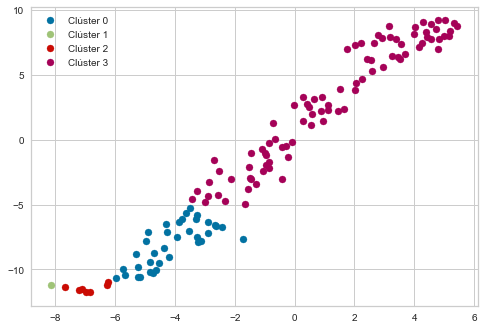

In [89]:
v = tsne(commercial_loop[dl.gas_cols], 2)
for label in range(k):
    plt.scatter(
            x=v[(labels['label']==label).values, 0],
            y=v[(labels['label']==label).values, 1]
    )
plt.legend([f"Clúster {i}" for i in range(k)])

path = images_path / Path("ensayos/clustering_gas_por_comunidad_observando_patrones/comercial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_scatter.svg"))

In [90]:
comunities_by_cluster = {}

for nlab in range(k):
    com_index = np.where(labels==nlab)[0]
    com_list = []
    for c in commercial_loop.values[com_index][:,(0,1,3)]:
        com_list.append(c)
    comunities_by_cluster[nlab] = com_list

for k in sorted(comunities_by_cluster, key=lambda k: len(comunities_by_cluster[k])):
    print(f"Al clúster {k} pertenecen las comunidades:")
    for e in comunities_by_cluster[k]:
        print("\t", e)


Al clúster 1 pertenecen las comunidades:
	 ['Loop' 170313201002034.0 'Commercial']
Al clúster 2 pertenecen las comunidades:
	 ['Loop' 170313201002014.0 'Commercial']
	 ['Loop' 170313201002016.0 'Commercial']
	 ['Loop' 170313201003008.0 'Commercial']
	 ['Loop' 170313201004020.0 'Multi 7+']
	 ['Loop' 170313204001010.0 'Commercial']
	 ['Loop' 170313204001011.0 'Commercial']
	 ['Loop' 170318391001091.0 'Municipal']
Al clúster 0 pertenecen las comunidades:
	 ['Loop' 170313201001020.0 'Commercial']
	 ['Loop' 170313201002012.0 'Commercial']
	 ['Loop' 170313201002029.0 'Commercial']
	 ['Loop' 170313201002030.0 'Commercial']
	 ['Loop' 170313201002032.0 'Commercial']
	 ['Loop' 170313201003003.0 'Commercial']
	 ['Loop' 170313201004007.0 'Commercial']
	 ['Loop' 170313204001009.0 'Commercial']
	 ['Loop' 170313204001043.0 'Commercial']
	 ['Loop' 170313204001013.0 'Commercial']
	 ['Loop' 170313204001017.0 'Commercial']
	 ['Loop' 170313204001032.0 'Commercial']
	 ['Loop' 170313204001036.0 'Commercial'

#### Industrial

En este caso, la zona industrial con mayor consumo de gas es *Ashburn*

In [91]:
industrial_loop = gas_df[(gas_df["COMMUNITY AREA NAME"] == "Ashburn") & (gas_df["BUILDING TYPE"] == "Industrial")]
industrial_loop

,COMMUNITY AREA NAME,CENSUS BLOCK,BUILDING TYPE,BUILDING_SUBTYPE,THERM JANUARY 2010,THERM FEBRUARY 2010,THERM MARCH 2010,THERM APRIL 2010,THERM MAY 2010,THERM JUNE 2010,THERM JULY 2010,THERM AUGUST 2010,THERM SEPTEMBER 2010,THERM OCTOBER 2010,THERM NOVEMBER 2010,THERM DECEMBER 2010
3589,Ashburn,1.703170e+14,Industrial,Industrial,930.0,940.0,978.0,368.0,246.0,104.0,11.0,18.0,11.0,18.0,126.0,380.0


Al ser una única muestra, graficamos el resultado directamente.

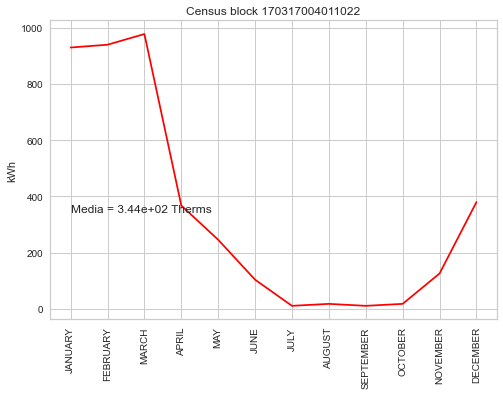

In [92]:
for i, (census_num, (index, row)) in enumerate(zip(industrial_loop['CENSUS BLOCK'], industrial_loop[dl.gas_cols].iterrows())):
    ax0 = sns.lineplot(data=row.T, color="red")
    
    ax0.set_xticks([e for e in range(0, 12)])
    ax0.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)
    
    ax0.set_title(f"Census block {int(census_num)}")
    Media = row.mean()
    ax0.text(0, Media, f"{Media = :0.2e} Therms")
    
    ax0.set(ylabel="kWh")

path = images_path / Path("ensayos/clustering_gas_por_comunidad_observando_patrones/industrial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_grafica.svg"))

#### Residencial

Entre las zonas residenciales elegimos a *Loop*.

In [93]:
residential_loop = gas_df[(gas_df["COMMUNITY AREA NAME"] == "Loop") & (gas_df["BUILDING TYPE"] == "Residential")]
residential_loop

,COMMUNITY AREA NAME,CENSUS BLOCK,BUILDING TYPE,BUILDING_SUBTYPE,THERM JANUARY 2010,THERM FEBRUARY 2010,THERM MARCH 2010,THERM APRIL 2010,THERM MAY 2010,THERM JUNE 2010,THERM JULY 2010,THERM AUGUST 2010,THERM SEPTEMBER 2010,THERM OCTOBER 2010,THERM NOVEMBER 2010,THERM DECEMBER 2010
21904,Loop,1.703132e+14,Residential,Multi < 7,993.0,977.0,606.0,263.0,160.0,66.0,45.0,13.0,11.0,50.0,168.0,589.0
38489,Loop,1.703132e+14,Residential,Multi 7+,3432.0,3072.0,2020.0,710.0,346.0,228.0,176.0,181.0,153.0,204.0,533.0,2834.0
38491,Loop,1.703132e+14,Residential,Multi 7+,4936.0,4440.0,2865.0,1475.0,1427.0,655.0,657.0,729.0,627.0,759.0,1276.0,4458.0
38501,Loop,1.703132e+14,Residential,Multi 7+,42155.0,48132.0,34820.0,24927.0,18791.0,12621.0,6711.0,7289.0,7924.0,13642.0,22279.0,43853.0
38513,Loop,1.703184e+14,Residential,Single Family,510.0,444.0,305.0,126.0,48.0,35.0,28.0,24.0,21.0,33.0,126.0,522.0


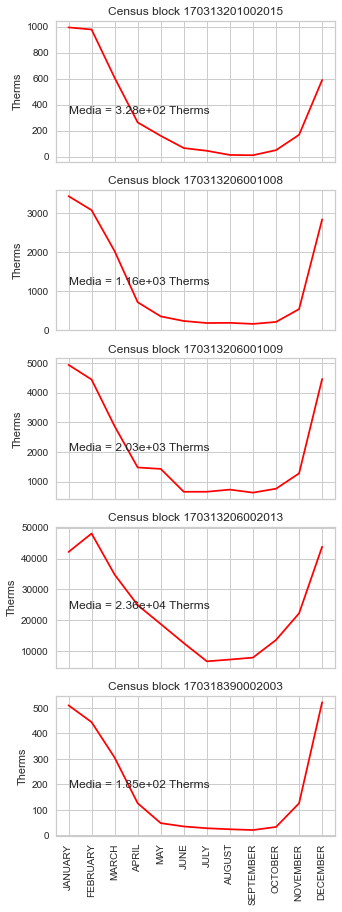

In [94]:
f, axes = plt.subplots(5, 1, figsize=(5, 15), sharex=True)

for i, (census_num, (index, row)) in enumerate(zip(residential_loop['CENSUS BLOCK'], residential_loop[dl.gas_cols].iterrows())):
    ax0 = sns.lineplot(data=row.T, ax=axes[i], color="red")
    
    ax0.set_xticks([e for e in range(0, 12)])
    ax0.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)
    
    ax0.set_title(f"Census block {int(census_num)}")
    Media = row.mean()
    ax0.text(0, Media, f"{Media = :0.2e} Therms")
    
    ax0.set(ylabel="Therms")

path = images_path / Path("ensayos/clustering_gas_por_comunidad_observando_patrones/residencial")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_grafica.svg"))

### [Volver al inicio](#Consumo-de-energía-en-Chicago-en-2010)

---

### Clustering de energia por media consumida en cada contador por comunidad

En este caso vamos a calcular el promedio consumido por cada contador en cada comunidad, dividiendo el consumo por la columna **ELECTRICITY ACCOUNTS**.

In [95]:
total_energy_by_com = dl[["COMMUNITY AREA NAME"] + dl.energy_cols + ["ELECTRICITY ACCOUNTS"]]
total_energy_by_com

,COMMUNITY AREA NAME,KWH JANUARY 2010,KWH FEBRUARY 2010,KWH MARCH 2010,KWH APRIL 2010,KWH MAY 2010,KWH JUNE 2010,KWH JULY 2010,KWH AUGUST 2010,KWH SEPTEMBER 2010,KWH OCTOBER 2010,KWH NOVEMBER 2010,KWH DECEMBER 2010,ELECTRICITY ACCOUNTS
1,Ashburn,7334.0,7741.0,4214.0,4284.0,2518.0,4273.0,4566.0,2787.0,3357.0,5540.0,15774.0,19676.0,8.0
5,Austin,0.0,0.0,0.0,0.0,0.0,0.0,0.0,819.0,619.0,416.0,138.0,2.0,3.0
7,Austin,1470.0,1325.0,294.0,391.0,366.0,2204.0,2345.0,2032.0,920.0,586.0,705.0,785.0,3.0
8,Austin,2461.0,4888.0,2893.0,2737.0,2350.0,3037.0,3874.0,4861.0,5180.0,2984.0,2635.0,3597.0,6.0
9,Austin,0.0,0.0,0.0,0.0,0.0,511.0,904.0,1818.0,1968.0,738.0,450.0,2207.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67046,Woodlawn,2705.0,1318.0,1582.0,1465.0,1494.0,2990.0,2449.0,2351.0,1213.0,2174.0,2888.0,5025.0,6.0
67047,Woodlawn,1005.0,1760.0,1521.0,1832.0,2272.0,2361.0,3018.0,3030.0,2886.0,3833.0,6290.0,12169.0,9.0
67048,Woodlawn,3567.0,3031.0,2582.0,2295.0,7902.0,4987.0,5773.0,3996.0,3050.0,3103.0,3880.0,4684.0,7.0
67049,Woodlawn,1208.0,1055.0,1008.0,1109.0,1591.0,1367.0,1569.0,1551.0,1376.0,1236.0,2108.0,2529.0,7.0


Dividimos el consumo mensual de energía por el número de contadores.

In [96]:
total_energy_by_com[dl.energy_cols] = total_energy_by_com[dl.energy_cols].div(total_energy_by_com["ELECTRICITY ACCOUNTS"], axis=0)
del total_energy_by_com["ELECTRICITY ACCOUNTS"]
total_energy_by_com

,COMMUNITY AREA NAME,KWH JANUARY 2010,KWH FEBRUARY 2010,KWH MARCH 2010,KWH APRIL 2010,KWH MAY 2010,KWH JUNE 2010,KWH JULY 2010,KWH AUGUST 2010,KWH SEPTEMBER 2010,KWH OCTOBER 2010,KWH NOVEMBER 2010,KWH DECEMBER 2010
1,Ashburn,916.750000,967.625000,526.750000,535.500000,314.750000,534.125000,570.750000,348.375000,419.625000,692.500000,1971.750000,2459.500000
5,Austin,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,273.000000,206.333333,138.666667,46.000000,0.666667
7,Austin,490.000000,441.666667,98.000000,130.333333,122.000000,734.666667,781.666667,677.333333,306.666667,195.333333,235.000000,261.666667
8,Austin,410.166667,814.666667,482.166667,456.166667,391.666667,506.166667,645.666667,810.166667,863.333333,497.333333,439.166667,599.500000
9,Austin,0.000000,0.000000,0.000000,0.000000,0.000000,170.333333,301.333333,606.000000,656.000000,246.000000,150.000000,735.666667
...,...,...,...,...,...,...,...,...,...,...,...,...,...
67046,Woodlawn,450.833333,219.666667,263.666667,244.166667,249.000000,498.333333,408.166667,391.833333,202.166667,362.333333,481.333333,837.500000
67047,Woodlawn,111.666667,195.555556,169.000000,203.555556,252.444444,262.333333,335.333333,336.666667,320.666667,425.888889,698.888889,1352.111111
67048,Woodlawn,509.571429,433.000000,368.857143,327.857143,1128.857143,712.428571,824.714286,570.857143,435.714286,443.285714,554.285714,669.142857
67049,Woodlawn,172.571429,150.714286,144.000000,158.428571,227.285714,195.285714,224.142857,221.571429,196.571429,176.571429,301.142857,361.285714


Y posteriormente calculamos la media para cada comunidad.

In [97]:
mean_energy = total_energy_by_com.groupby('COMMUNITY AREA NAME', as_index=False).mean()
mean_energy

,COMMUNITY AREA NAME,KWH JANUARY 2010,KWH FEBRUARY 2010,KWH MARCH 2010,KWH APRIL 2010,KWH MAY 2010,KWH JUNE 2010,KWH JULY 2010,KWH AUGUST 2010,KWH SEPTEMBER 2010,KWH OCTOBER 2010,KWH NOVEMBER 2010,KWH DECEMBER 2010
0,Albany Park,588.960230,620.076751,599.319381,608.100158,787.060110,1062.593329,1124.960334,902.121725,681.448159,682.711545,910.421071,975.996995
1,Archer Heights,4060.960537,4162.342241,3963.701645,3882.010044,4056.491226,4694.134467,4813.099926,4811.352907,4152.028865,3892.331308,4081.929164,4534.551003
2,Armour Square,1742.539516,1624.745099,1512.367518,1574.774637,1571.659308,1762.314045,2198.402000,2139.742148,1774.726173,1223.895629,1602.952279,2310.849074
3,Ashburn,780.696213,745.711491,704.729112,717.169818,960.698133,1346.862270,1441.881978,1121.033684,808.984312,775.900670,1065.874121,1191.412444
4,Auburn Gresham,586.611070,590.521216,581.013643,573.039983,706.920065,921.194964,971.684396,820.333114,636.278627,667.405742,888.332942,1013.297035
...,...,...,...,...,...,...,...,...,...,...,...,...,...
72,West Lawn,1599.801869,1761.060292,1676.913074,1675.510384,2034.169928,2506.009592,2512.312836,2422.593366,1906.256466,1680.336738,1806.449746,2138.588987
73,West Pullman,336.840340,505.430414,494.363589,517.450046,575.883072,692.737455,884.599784,846.449675,645.562179,586.981731,700.753697,921.851030
74,West Ridge,631.225589,633.842594,606.552057,679.627136,901.395931,1193.336081,1153.017542,936.103499,684.780656,712.970023,945.586482,948.583799
75,West Town,554.456614,601.668226,571.151123,570.600857,693.789572,896.494764,1049.318744,1041.675432,811.528727,688.255666,781.993540,956.159867


Aplicamos clustering con KMeans

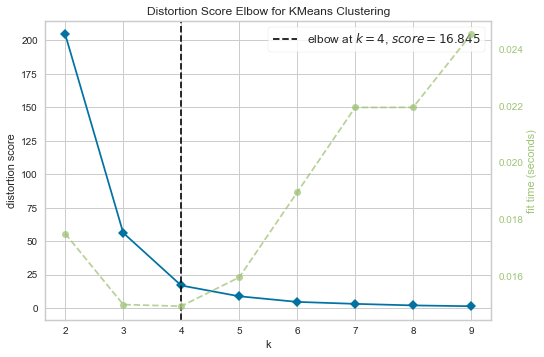

<Figure size 576x396 with 0 Axes>

In [98]:
kmax = 10
k_values = (2, kmax)

scaler = preprocessing.StandardScaler()
data = mean_energy[dl.energy_cols]
norm_data = scaler.fit_transform(data)

km = KMeansCluster(norm_data)
km.cluster(k_values)

path = images_path / Path("ensayos/clustering_energia_media_en_contador/total")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("elbow.svg"))

Con k=4 tenemos la división óptima.

In [99]:
km_best = km.get_kmeans_of(4)
km_labels = km_best.labels_
km_centroids = scaler.inverse_transform(km_best.cluster_centers_)

km_labels

array([0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 3, 3, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3])

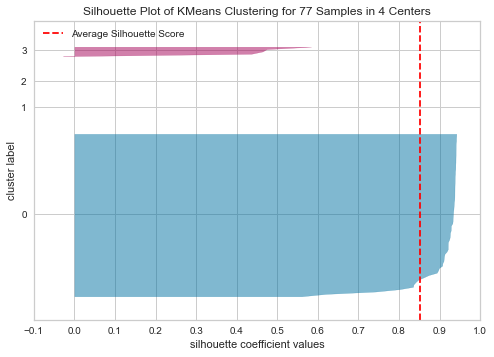

<Figure size 576x396 with 0 Axes>

In [100]:
_ = silhouette_visualizer(km_best, norm_data, colors='yellowbrick')

path = images_path / Path("ensayos/clustering_energia_media_en_contador/total")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("silhouette.svg"))

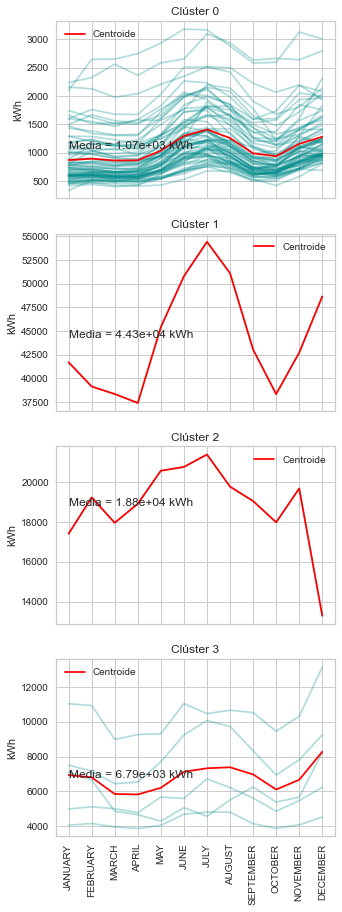

In [101]:
labels = pd.DataFrame(km_labels, columns=["label"])

k = km_centroids.shape[0]

f, axes = plt.subplots(k, 1, figsize=(5, 15), sharex=True)

for ki in range(k):
    cluster = mean_energy.iloc[labels.query(f'label == {ki}').index][dl.energy_cols]
    palette={i:"darkcyan" for i in range(cluster.shape[0])}

    ax0 = sns.lineplot(data=cluster.values.T, ax=axes[ki], palette=palette, alpha=0.3)
    _ = [line.set_linestyle("-") for line in ax0.lines]
    
    ax0c = sns.lineplot(data=km_centroids[ki, :].T, ax=axes[ki], color="red")
    _ = [line.set_linestyle("-") for line in ax0c.lines]
    
    ax0c.legend(ax0c.lines[-1:], ["Centroide"]);
    
    ax0.set_title(f"Clúster {ki}")
    Media = km_centroids[ki, :].mean()
    ax0.text(0, Media, f"{Media = :0.2e} kWh")
    ax0.set(ylabel="kWh")
    
    ax0.set_xticks([e for e in range(0, 12)])
    ax0.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)

path = images_path / Path("ensayos/clustering_energia_media_en_contador/total")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("grafica.svg"))

¿Qué comunidad hay en cada clúster?

In [102]:
comunities_by_cluster = {}

for nlab in range(k):
    com_index = np.where(labels==nlab)[0]
    com_list = []
    for c in mean_energy.values[com_index][:,0]:
        com_list.append(c)
    comunities_by_cluster[nlab] = com_list

for k in sorted(comunities_by_cluster, key=lambda k: len(comunities_by_cluster[k])):
    print(f"Al clúster {k} pertenecen las comunidades:")
    for e in comunities_by_cluster[k]:
        print("\t", e)


Al clúster 1 pertenecen las comunidades:
	 Loop
Al clúster 2 pertenecen las comunidades:
	 Riverdale
Al clúster 3 pertenecen las comunidades:
	 Archer Heights
	 Near North Side
	 Near South Side
	 Near West Side
	 Woodlawn
Al clúster 0 pertenecen las comunidades:
	 Albany Park
	 Armour Square
	 Ashburn
	 Auburn Gresham
	 Austin
	 Avalon Park
	 Avondale
	 Belmont Cragin
	 Beverly
	 Bridgeport
	 Brighton Park
	 Burnside
	 Calumet Heights
	 Chatham
	 Chicago Lawn
	 Clearing
	 Douglas
	 Dunning
	 East Garfield Park
	 East Side
	 Edgewater
	 Edison Park
	 Englewood
	 Forest Glen
	 Fuller Park
	 Gage Park
	 Garfield Ridge
	 Grand Boulevard
	 Greater Grand Crossing
	 Hegewisch
	 Hermosa
	 Humboldt Park
	 Hyde Park
	 Irving Park
	 Jefferson Park
	 Kenwood
	 Lakeview
	 Lincoln Park
	 Lincoln Square
	 Logan Square
	 Lower West Side
	 McKinley Park
	 Montclare
	 Morgan Park
	 Mount Greenwood
	 New City
	 North Center
	 North Lawndale
	 North Park
	 Norwood Park
	 O'Hare
	 Oakland
	 Portage Park
	

#### Separación por cuartiles

Vamos a separar las muestras muy alejadas del valor medio mediante la eliminación de outliers. Dividiremos en 3 porciones: los que están muy por abajo de la media, en ***mean_q1***; los que están muy por encima de la media, en ***mean_q4***; y los que se encuentran sobre la media, en ***mean_qm***. Con este tratamiento previo trataremos de encontrar de mejor modo patrones dentro de cada grupo.

In [103]:
zmin_score = 0.26

z_mean_energy = zscore(mean_energy[dl.energy_cols])
mean_energy_qm = mean_energy[np.logical_and(-zmin_score <= z_mean_energy, z_mean_energy <= zmin_score).all(axis=1)]
mean_energy_q1 = mean_energy[(-zmin_score > z_mean_energy).all(axis=1)]
mean_energy_q4 = mean_energy[(zmin_score < z_mean_energy).all(axis=1)]

mean_energy_qm

,COMMUNITY AREA NAME,KWH JANUARY 2010,KWH FEBRUARY 2010,KWH MARCH 2010,KWH APRIL 2010,KWH MAY 2010,KWH JUNE 2010,KWH JULY 2010,KWH AUGUST 2010,KWH SEPTEMBER 2010,KWH OCTOBER 2010,KWH NOVEMBER 2010,KWH DECEMBER 2010
2,Armour Square,1742.539516,1624.745099,1512.367518,1574.774637,1571.659308,1762.314045,2198.402000,2139.742148,1774.726173,1223.895629,1602.952279,2310.849074
3,Ashburn,780.696213,745.711491,704.729112,717.169818,960.698133,1346.862270,1441.881978,1121.033684,808.984312,775.900670,1065.874121,1191.412444
5,Austin,881.393662,1143.496215,1142.900845,1061.795445,1256.132520,1484.143676,1639.071569,1672.210766,1369.155481,1197.265957,1405.209377,1630.487812
7,Avondale,825.904543,831.643551,816.281594,789.980707,950.883245,1282.302588,1387.953706,1167.133834,916.402788,865.263593,1107.338454,1239.955574
8,Belmont Cragin,1185.054781,1236.872753,1123.117644,1101.673213,1304.915316,1531.453974,1669.345291,1593.902853,1244.509159,1140.136696,1415.916247,1619.806319
9,Beverly,819.153565,843.576326,780.968340,847.318220,1133.758536,1584.180429,1546.303610,1147.048840,919.139609,861.511896,1283.501531,1187.529238
11,Brighton Park,962.527296,975.527314,893.291030,889.663229,1002.113841,1197.505350,1419.792567,1421.544570,1102.163523,948.540256,1092.090235,1247.987735
12,Burnside,1659.831583,1511.910669,1522.988559,1500.095776,1773.631201,2003.929350,2109.256792,1780.390617,1527.236072,1577.450641,1935.369574,1969.445154
16,Clearing,1006.018576,971.486217,908.137255,881.398771,1136.920999,1462.454409,1656.843804,1493.196089,1065.599291,960.189565,1175.699334,1349.713413
17,Douglas,804.330181,1028.136170,1072.324103,965.833775,1068.902056,1234.492284,1899.938112,1635.922526,1441.719261,1134.206334,1304.732489,1830.144795


In [104]:
mean_energy_q1

,COMMUNITY AREA NAME,KWH JANUARY 2010,KWH FEBRUARY 2010,KWH MARCH 2010,KWH APRIL 2010,KWH MAY 2010,KWH JUNE 2010,KWH JULY 2010,KWH AUGUST 2010,KWH SEPTEMBER 2010,KWH OCTOBER 2010,KWH NOVEMBER 2010,KWH DECEMBER 2010
14,Chatham,548.736974,563.949036,546.049245,538.207488,668.152943,878.640122,938.656570,761.947701,605.753641,633.530900,836.728679,922.702208
19,East Garfield Park,450.959905,518.789042,528.272949,529.217821,573.993923,679.083028,825.308169,823.947782,735.957543,613.447287,729.301227,905.244509
20,East Side,418.123974,438.244319,401.374926,423.017437,617.825313,897.358812,937.610734,685.952468,495.418421,505.783496,712.306064,686.252539
23,Englewood,504.576513,525.370981,499.136593,480.369505,547.117476,675.751533,757.998640,730.072981,565.111700,590.747475,785.415277,941.913156
25,Fuller Park,485.376146,507.384843,517.840736,497.809375,550.832397,628.657527,769.049517,776.020786,585.774026,542.345548,686.766241,819.261537
28,Grand Boulevard,612.172127,602.778075,509.061568,493.853598,547.317564,662.937125,795.866038,809.540480,638.899086,582.338788,723.965683,981.641705
29,Greater Grand Crossing,540.691549,563.919851,538.917779,543.887588,634.444308,820.860347,869.311150,814.108248,634.695363,645.272314,827.015719,982.295835
56,Oakland,462.199800,473.069618,423.576991,413.032848,426.406716,530.717199,676.657687,671.607153,533.147311,420.315195,576.774318,801.655847
62,South Chicago,447.606205,466.036084,462.377413,444.617988,530.067131,693.512976,748.631958,649.540879,510.929136,546.391435,724.367365,856.924134
65,South Shore,486.540287,498.248891,488.881648,486.547177,542.520038,726.045306,796.639112,713.272992,561.745431,573.613358,729.811821,876.291037


In [105]:
mean_energy_q4

,COMMUNITY AREA NAME,KWH JANUARY 2010,KWH FEBRUARY 2010,KWH MARCH 2010,KWH APRIL 2010,KWH MAY 2010,KWH JUNE 2010,KWH JULY 2010,KWH AUGUST 2010,KWH SEPTEMBER 2010,KWH OCTOBER 2010,KWH NOVEMBER 2010,KWH DECEMBER 2010
1,Archer Heights,4060.960537,4162.342241,3963.701645,3882.010044,4056.491226,4694.134467,4813.099926,4811.352907,4152.028865,3892.331308,4081.929164,4534.551003
41,Loop,41703.327760,39149.935395,38359.267550,37418.408781,45420.173772,50777.961084,54413.264670,51098.644304,43053.542073,38350.661591,42724.906583,48648.280433
47,Near North Side,7508.711888,7166.403554,6443.371826,6542.160299,7701.709251,9235.782100,10067.107065,9733.517137,8336.834124,6941.555301,7812.584585,9245.165316
48,Near South Side,4995.516429,5119.402869,5011.130793,4784.420322,5674.484652,5597.203584,6722.953663,6220.897687,5621.622801,4868.820165,5472.779093,6241.668529
49,Near West Side,11028.762534,10930.151571,8987.540767,9264.634207,9310.610341,11041.463763,10466.831510,10660.692877,10525.429915,9457.175345,10307.927959,13126.378343
59,Riverdale,17407.626092,19220.115392,17953.735688,18906.783214,20560.624665,20747.169334,21371.818762,19762.272862,19041.743449,17976.516134,19671.468081,13303.468699
76,Woodlawn,7110.092941,6651.934074,4857.665927,4664.439473,4299.869910,5068.639403,4576.080946,5510.521041,6255.137064,5391.800905,5675.902200,8230.214213


Aplicamos clustering a los valores en ***mean_qm***.

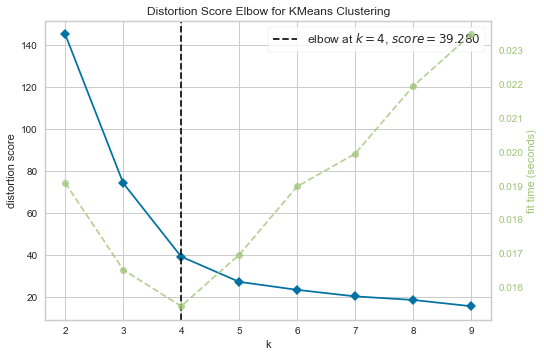

<Figure size 576x396 with 0 Axes>

In [106]:
kmax = 10
k_values = (2, kmax)

scaler = preprocessing.StandardScaler()
data = mean_energy_qm[dl.energy_cols]
norm_data = scaler.fit_transform(data)

km = KMeansCluster(norm_data)
km.cluster(k_values)

path = images_path / Path("ensayos/clustering_energia_media_en_contador/mean_qm")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("elbow.svg"))

In [107]:
km_best = km.get_kmeans_of(4)
km_labels = km_best.labels_
km_centroids = scaler.inverse_transform(km_best.cluster_centers_)

km_labels

array([1, 3, 0, 3, 0, 3, 3, 1, 0, 0, 3, 0, 0, 3, 3, 3, 3, 0, 1, 0, 2, 0,
       0, 1, 3, 1, 1, 3, 2, 1, 0, 3, 0, 1])

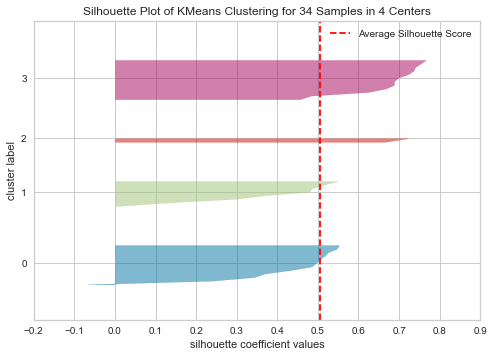

<Figure size 576x396 with 0 Axes>

In [108]:
_ = silhouette_visualizer(km_best, norm_data, colors='yellowbrick')

path = images_path / Path("ensayos/clustering_energia_media_en_contador/mean_qm")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("silhouette.svg"))

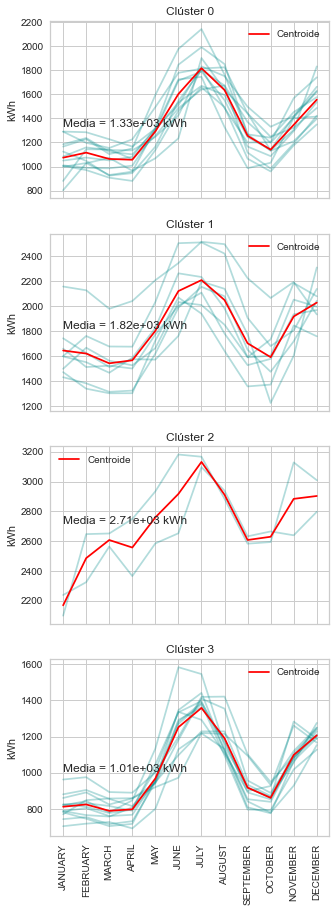

In [109]:
labels = pd.DataFrame(km_labels, columns=["label"])

k = km_centroids.shape[0]

f, axes = plt.subplots(k, 1, figsize=(5, 15), sharex=True)

for ki in range(k):
    cluster = mean_energy_qm.iloc[labels.query(f'label == {ki}').index][dl.energy_cols]
    palette={i:"darkcyan" for i in range(cluster.shape[0])}

    ax0 = sns.lineplot(data=cluster.values.T, ax=axes[ki], palette=palette, alpha=0.3)
    _ = [line.set_linestyle("-") for line in ax0.lines]
    
    ax0c = sns.lineplot(data=km_centroids[ki, :].T, ax=axes[ki], color="red")
    _ = [line.set_linestyle("-") for line in ax0c.lines]
    
    ax0c.legend(ax0c.lines[-1:], ["Centroide"]);
    
    ax0.set_title(f"Clúster {ki}")
    Media = km_centroids[ki, :].mean()
    ax0.text(0, Media, f"{Media = :0.2e} kWh")
    ax0.set(ylabel="kWh")
    
    ax0.set_xticks([e for e in range(0, 12)])
    ax0.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)

path = images_path / Path("ensayos/clustering_energia_media_en_contador/mean_qm")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_grafica.svg"))

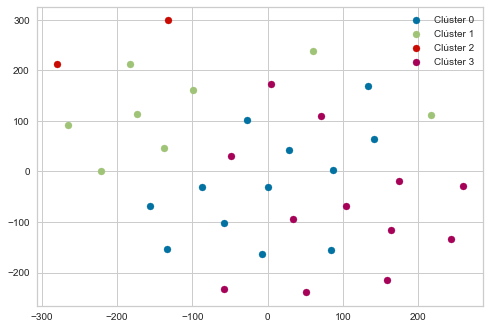

In [110]:
v = tsne(mean_energy_qm[dl.energy_cols], 2)
for label in range(k):
    plt.scatter(
            x=v[(labels['label']==label).values, 0],
            y=v[(labels['label']==label).values, 1]
    )
plt.legend([f"Clúster {i}" for i in range(k)])

path = images_path / Path("ensayos/clustering_energia_media_en_contador/mean_qm")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("scatter.svg"))

In [111]:
comunities_by_cluster = {}

for nlab in range(k):
    com_index = np.where(labels==nlab)[0]
    com_list = []
    for c in mean_energy_qm.values[com_index][:,0]:
        com_list.append(c)
    comunities_by_cluster[nlab] = com_list

for k in sorted(comunities_by_cluster, key=lambda k: len(comunities_by_cluster[k])):
    print(f"Al clúster {k} pertenecen las comunidades:")
    for e in comunities_by_cluster[k]:
        print("\t", e)

Al clúster 2 pertenecen las comunidades:
	 Lower West Side
	 Pullman
Al clúster 1 pertenecen las comunidades:
	 Armour Square
	 Burnside
	 Lincoln Park
	 New City
	 North Park
	 O'Hare
	 South Deering
	 West Lawn
Al clúster 0 pertenecen las comunidades:
	 Austin
	 Belmont Cragin
	 Clearing
	 Douglas
	 Forest Glen
	 Garfield Ridge
	 Lakeview
	 Lincoln Square
	 McKinley Park
	 Mount Greenwood
	 South Lawndale
	 West Elsdon
Al clúster 3 pertenecen las comunidades:
	 Ashburn
	 Avondale
	 Beverly
	 Brighton Park
	 Edgewater
	 Hermosa
	 Humboldt Park
	 Hyde Park
	 Irving Park
	 North Lawndale
	 Portage Park
	 Uptown


Aplicamos clustering a los valores en ***mean_q1***.

C:\Users\Alberto\miniconda3\envs\cdi-musiani-env\lib\site-packages\yellowbrick\utils\kneed.py:140: YellowbrickWarning:

No 'knee' or 'elbow point' detected This could be due to bad clustering, no actual clusters being formed etc.

C:\Users\Alberto\miniconda3\envs\cdi-musiani-env\lib\site-packages\yellowbrick\cluster\elbow.py:343: YellowbrickWarning:

No 'knee' or 'elbow' point detected, pass `locate_elbow=False` to remove the warning



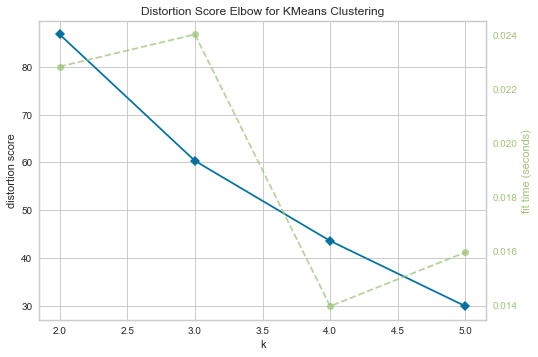

<Figure size 576x396 with 0 Axes>

In [112]:
kmax = 6
k_values = (2, kmax)

scaler = preprocessing.StandardScaler()
data = mean_energy_q1[dl.energy_cols]
norm_data = scaler.fit_transform(data)

km = KMeansCluster(norm_data)
km.cluster(k_values)

path = images_path / Path("ensayos/clustering_energia_media_en_contador/mean_q1")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("elbow.svg"))

In [113]:
km_best = km.get_kmeans_of(3)
km_labels = km_best.labels_
km_centroids = scaler.inverse_transform(km_best.cluster_centers_)

km_labels

array([1, 2, 2, 2, 2, 1, 1, 0, 2, 2, 1, 1, 2])

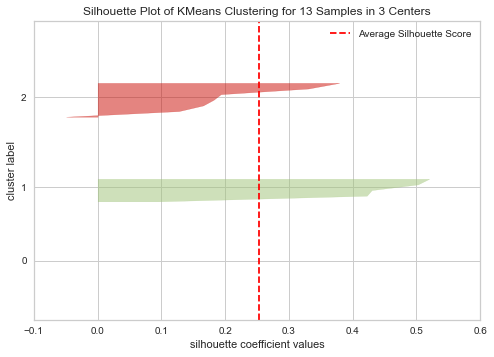

<Figure size 576x396 with 0 Axes>

In [114]:
_ = silhouette_visualizer(km_best, norm_data, colors='yellowbrick')

path = images_path / Path("ensayos/clustering_energia_media_en_contador/mean_q1")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("silhouette.svg"))

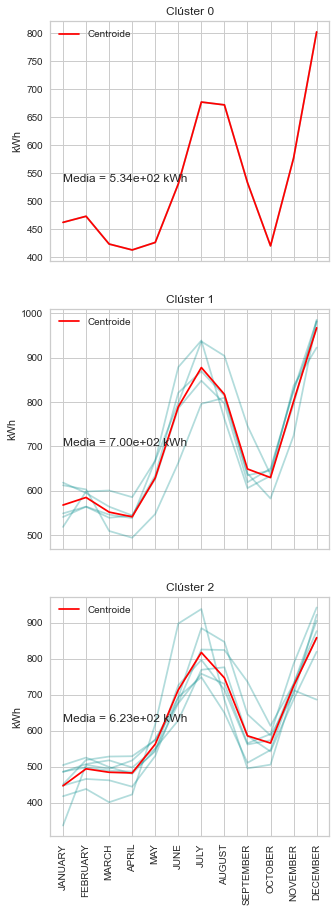

In [115]:
labels = pd.DataFrame(km_labels, columns=["label"])

k = km_centroids.shape[0]

f, axes = plt.subplots(k, 1, figsize=(5, 15), sharex=True)

for ki in range(k):
    cluster = mean_energy_q1.iloc[labels.query(f'label == {ki}').index][dl.energy_cols]
    palette={i:"darkcyan" for i in range(cluster.shape[0])}

    ax0 = sns.lineplot(data=cluster.values.T, ax=axes[ki], palette=palette, alpha=0.3)
    _ = [line.set_linestyle("-") for line in ax0.lines]
    
    ax0c = sns.lineplot(data=km_centroids[ki, :].T, ax=axes[ki], color="red")
    _ = [line.set_linestyle("-") for line in ax0c.lines]
    
    ax0c.legend(ax0c.lines[-1:], ["Centroide"]);
    
    ax0.set_title(f"Clúster {ki}")
    Media = km_centroids[ki, :].mean()
    ax0.text(0, Media, f"{Media = :0.2e} kWh")
    ax0.set(ylabel="kWh")
    
    ax0.set_xticks([e for e in range(0, 12)])
    ax0.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)
    
path = images_path / Path("ensayos/clustering_energia_media_en_contador/mean_q1")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("cluster_grafica.svg"))

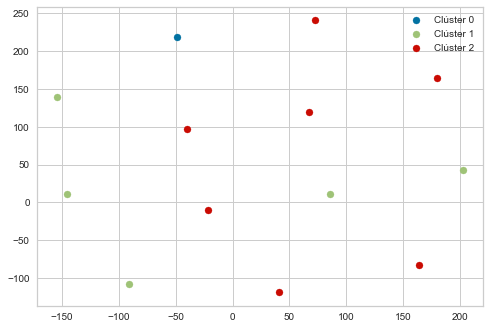

In [116]:
v = tsne(mean_energy_q1[dl.energy_cols], 2)
for label in range(k):
    plt.scatter(
            x=v[(labels['label']==label).values, 0],
            y=v[(labels['label']==label).values, 1]
    )
plt.legend([f"Clúster {i}" for i in range(k)])

path = images_path / Path("ensayos/clustering_energia_media_en_contador/mean_q1")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("scatter.svg"))

In [117]:
v = tsne(mean_energy_q1[dl.energy_cols], 3)
fig = go.Figure()
for label in range(k):
    fig.add_trace(
        go.Scatter3d(
            x=v[(labels['label']==label).values, 0],
            y=v[(labels['label']==label).values, 1],
            z=v[(labels['label']==label).values, 2]
        )
    )
fig.show()

path = images_path / Path("ensayos/clustering_energia_media_en_contador/mean_q1")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("scatter3d.svg"))

<Figure size 576x396 with 0 Axes>

In [118]:
comunities_by_cluster = {}

for nlab in range(k):
    com_index = np.where(labels==nlab)[0]
    com_list = []
    for c in mean_energy_q1.values[com_index][:,0]:
        com_list.append(c)
    comunities_by_cluster[nlab] = com_list

for k in sorted(comunities_by_cluster, key=lambda k: len(comunities_by_cluster[k])):
    print(f"Al clúster {k} pertenecen las comunidades:")
    for e in comunities_by_cluster[k]:
        print("\t", e)


Al clúster 0 pertenecen las comunidades:
	 Oakland
Al clúster 1 pertenecen las comunidades:
	 Chatham
	 Grand Boulevard
	 Greater Grand Crossing
	 West Englewood
	 West Garfield Park
Al clúster 2 pertenecen las comunidades:
	 East Garfield Park
	 East Side
	 Englewood
	 Fuller Park
	 South Chicago
	 South Shore
	 West Pullman


Aplicamos clustering a los valores en ***mean_q4***.

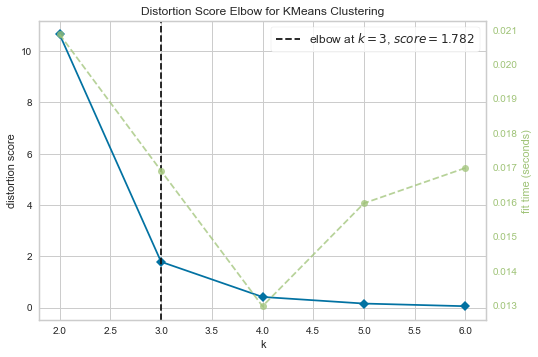

<Figure size 576x396 with 0 Axes>

In [119]:
kmax = 7
k_values = (2, kmax)

scaler = preprocessing.StandardScaler()
data = mean_energy_q4[dl.energy_cols]
norm_data = scaler.fit_transform(data)

km = KMeansCluster(norm_data)
km.cluster(k_values)

path = images_path / Path("ensayos/clustering_energia_media_en_contador/mean_q4")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("elbow.svg"))

In [120]:
km_best = km.get_kmeans_of(3)
km_labels = km_best.labels_
km_centroids = scaler.inverse_transform(km_best.cluster_centers_)

km_labels

array([0, 1, 0, 0, 0, 2, 0])

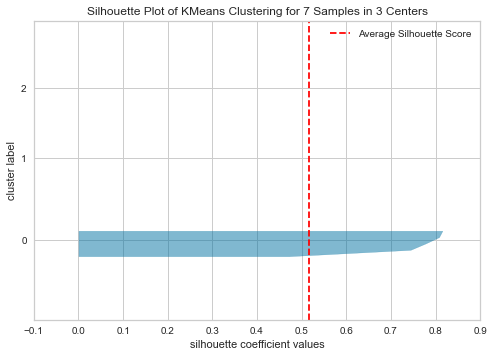

<Figure size 576x396 with 0 Axes>

In [121]:
_ = silhouette_visualizer(km_best, norm_data, colors='yellowbrick')

path = images_path / Path("ensayos/clustering_energia_media_en_contador/mean_q4")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("silhouette.svg"))

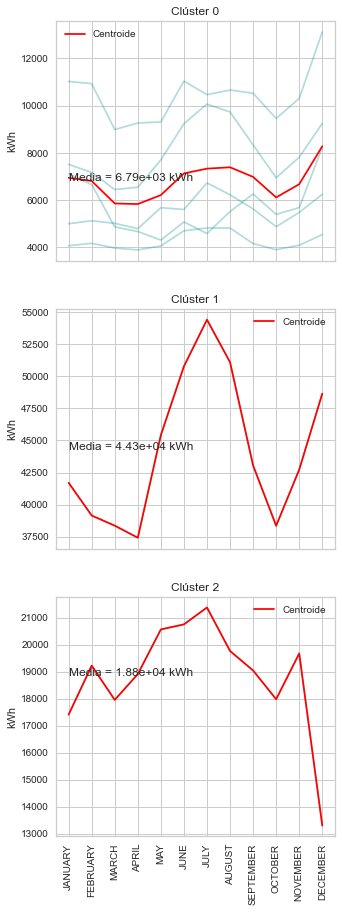

In [122]:
labels = pd.DataFrame(km_labels, columns=["label"])

k = km_centroids.shape[0]

f, axes = plt.subplots(k, 1, figsize=(5, 15), sharex=True)

for ki in range(k):
    cluster = mean_energy_q4.iloc[labels.query(f'label == {ki}').index][dl.energy_cols]
    palette={i:"darkcyan" for i in range(cluster.shape[0])}

    ax0 = sns.lineplot(data=cluster.values.T, ax=axes[ki], palette=palette, alpha=0.3)
    _ = [line.set_linestyle("-") for line in ax0.lines]
    
    ax0c = sns.lineplot(data=km_centroids[ki, :].T, ax=axes[ki], color="red")
    _ = [line.set_linestyle("-") for line in ax0c.lines]
    
    ax0c.legend(ax0c.lines[-1:], ["Centroide"]);
    
    ax0.set_title(f"Clúster {ki}")
    Media = km_centroids[ki, :].mean()
    ax0.text(0, Media, f"{Media = :0.2e} kWh")
    ax0.set(ylabel="kWh")
    
    ax0.set_xticks([e for e in range(0, 12)])
    ax0.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)

path = images_path / Path("ensayos/clustering_energia_media_en_contador/mean_q4")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("graficas.svg"))

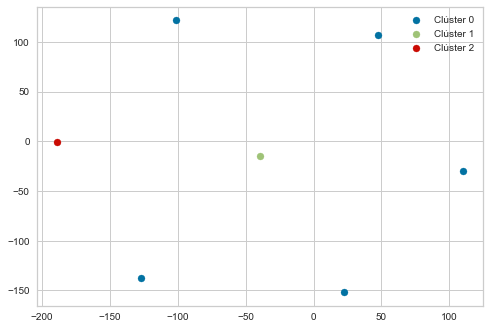

In [123]:
v = tsne(mean_energy_q4[dl.energy_cols], 2)
for label in range(k):
    plt.scatter(
            x=v[(labels['label']==label).values, 0],
            y=v[(labels['label']==label).values, 1]
    )
plt.legend([f"Clúster {i}" for i in range(k)])

path = images_path / Path("ensayos/clustering_energia_media_en_contador/mean_q4")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("scatter.svg"))

In [124]:
comunities_by_cluster = {}

for nlab in range(k):
    com_index = np.where(labels==nlab)[0]
    com_list = []
    for c in mean_energy_q4.values[com_index][:,0]:
        com_list.append(c)
    comunities_by_cluster[nlab] = com_list

for k in sorted(comunities_by_cluster, key=lambda k: len(comunities_by_cluster[k])):
    print(f"Al clúster {k} pertenecen las comunidades:")
    for e in comunities_by_cluster[k]:
        print("\t", e)


Al clúster 1 pertenecen las comunidades:
	 Loop
Al clúster 2 pertenecen las comunidades:
	 Riverdale
Al clúster 0 pertenecen las comunidades:
	 Archer Heights
	 Near North Side
	 Near South Side
	 Near West Side
	 Woodlawn


### [Volver al inicio](#Consumo-de-energía-en-Chicago-en-2010)

---

### Clustering de gas por media consumida en cada contador por comunidad

En este caso vamos a calcular el promedio consumido por cada contador en cada comunidad, dividiendo el consumo por la columna **GAS ACCOUNTS**.

In [125]:
total_gas_by_com = dl[["COMMUNITY AREA NAME"] + dl.gas_cols + ["GAS ACCOUNTS"]]
total_gas_by_com

,COMMUNITY AREA NAME,THERM JANUARY 2010,THERM FEBRUARY 2010,THERM MARCH 2010,THERM APRIL 2010,THERM MAY 2010,THERM JUNE 2010,THERM JULY 2010,THERM AUGUST 2010,THERM SEPTEMBER 2010,THERM OCTOBER 2010,THERM NOVEMBER 2010,THERM DECEMBER 2010,GAS ACCOUNTS
0,Archer Heights,2326.0,2131.0,1400.0,620.0,502.0,224.0,222.0,187.0,197.0,252.0,744.0,2112.0,11.0
6,Austin,3041.0,2680.0,1151.0,373.0,124.0,26.0,29.0,25.0,49.0,177.0,670.0,3895.0,3.0
11,Austin,910.0,738.0,632.0,448.0,254.0,113.0,42.0,29.0,33.0,36.0,166.0,633.0,3.0
13,Avondale,535.0,458.0,481.0,307.0,194.0,145.0,119.0,102.0,88.0,109.0,141.0,249.0,4.0
19,Avondale,285.0,285.0,244.0,129.0,73.0,46.0,39.0,27.0,39.0,29.0,50.0,144.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67046,Woodlawn,2166.0,1681.0,1858.0,1172.0,708.0,360.0,72.0,67.0,77.0,185.0,623.0,1800.0,9.0
67047,Woodlawn,985.0,1152.0,1238.0,630.0,475.0,192.0,141.0,162.0,144.0,210.0,653.0,1744.0,8.0
67048,Woodlawn,2202.0,1874.0,1647.0,906.0,645.0,346.0,84.0,150.0,150.0,260.0,694.0,1335.0,5.0
67049,Woodlawn,95.0,11.0,47.0,9.0,45.0,18.0,22.0,9.0,17.0,11.0,18.0,13.0,5.0


Dividimos el consumo de gas por el número de contadores.

In [126]:
total_gas_by_com[dl.gas_cols] = total_gas_by_com[dl.gas_cols].div(total_gas_by_com["GAS ACCOUNTS"], axis=0)
del total_gas_by_com["GAS ACCOUNTS"]
total_gas_by_com

,COMMUNITY AREA NAME,THERM JANUARY 2010,THERM FEBRUARY 2010,THERM MARCH 2010,THERM APRIL 2010,THERM MAY 2010,THERM JUNE 2010,THERM JULY 2010,THERM AUGUST 2010,THERM SEPTEMBER 2010,THERM OCTOBER 2010,THERM NOVEMBER 2010,THERM DECEMBER 2010
0,Archer Heights,211.454545,193.727273,127.272727,56.363636,45.636364,20.363636,20.181818,17.000000,17.909091,22.909091,67.636364,192.000000
6,Austin,1013.666667,893.333333,383.666667,124.333333,41.333333,8.666667,9.666667,8.333333,16.333333,59.000000,223.333333,1298.333333
11,Austin,303.333333,246.000000,210.666667,149.333333,84.666667,37.666667,14.000000,9.666667,11.000000,12.000000,55.333333,211.000000
13,Avondale,133.750000,114.500000,120.250000,76.750000,48.500000,36.250000,29.750000,25.500000,22.000000,27.250000,35.250000,62.250000
19,Avondale,95.000000,95.000000,81.333333,43.000000,24.333333,15.333333,13.000000,9.000000,13.000000,9.666667,16.666667,48.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
67046,Woodlawn,240.666667,186.777778,206.444444,130.222222,78.666667,40.000000,8.000000,7.444444,8.555556,20.555556,69.222222,200.000000
67047,Woodlawn,123.125000,144.000000,154.750000,78.750000,59.375000,24.000000,17.625000,20.250000,18.000000,26.250000,81.625000,218.000000
67048,Woodlawn,440.400000,374.800000,329.400000,181.200000,129.000000,69.200000,16.800000,30.000000,30.000000,52.000000,138.800000,267.000000
67049,Woodlawn,19.000000,2.200000,9.400000,1.800000,9.000000,3.600000,4.400000,1.800000,3.400000,2.200000,3.600000,2.600000


Y posteriormente calculamos el promedio para cada comunidad.

In [127]:
mean_gas = total_gas_by_com.groupby('COMMUNITY AREA NAME', as_index=False).mean()
mean_gas

,COMMUNITY AREA NAME,THERM JANUARY 2010,THERM FEBRUARY 2010,THERM MARCH 2010,THERM APRIL 2010,THERM MAY 2010,THERM JUNE 2010,THERM JULY 2010,THERM AUGUST 2010,THERM SEPTEMBER 2010,THERM OCTOBER 2010,THERM NOVEMBER 2010,THERM DECEMBER 2010
0,Albany Park,284.552873,245.087784,200.396134,108.203023,70.542487,42.627449,34.757723,30.944222,32.728462,39.958613,78.510739,194.184422
1,Archer Heights,521.052922,401.826920,315.615721,168.591343,108.174522,76.405301,73.128319,66.208327,66.431437,85.968940,163.912070,411.780009
2,Armour Square,583.664740,451.322075,487.174976,267.113941,193.111138,123.958385,110.153765,108.135963,111.420355,190.671587,321.742738,590.266422
3,Ashburn,287.763035,247.270869,235.673138,127.214171,65.933325,46.456245,28.085409,28.700234,26.699497,34.093083,63.663270,157.917898
4,Auburn Gresham,323.149316,298.781050,232.171357,126.028303,77.288771,42.824096,30.284555,29.387503,31.015608,50.249806,111.352088,274.396757
...,...,...,...,...,...,...,...,...,...,...,...,...,...
72,West Lawn,304.764895,266.360117,189.982854,107.564402,69.055657,45.487462,41.903536,41.695916,40.238220,49.723047,96.189277,247.669317
73,West Pullman,269.176338,251.701739,182.500750,97.649137,63.180883,28.492159,23.252768,22.823583,22.590791,38.725627,91.067161,228.711587
74,West Ridge,340.371726,278.831150,224.815387,133.599109,92.930962,64.734452,57.671696,51.438850,45.241085,51.940878,107.929262,247.420668
75,West Town,214.904567,183.123474,159.826261,78.785008,46.839160,30.773432,23.777846,21.285254,22.968842,28.651958,53.462065,148.915897


Aplicamos clustering con KMeans.

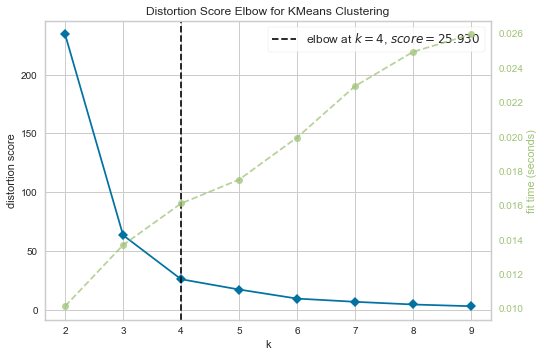

<Figure size 576x396 with 0 Axes>

In [128]:
kmax = 10
k_values = (2, kmax)

scaler = preprocessing.StandardScaler()
data = mean_gas[dl.gas_cols]
norm_data = scaler.fit_transform(data)

km = KMeansCluster(norm_data)
km.cluster(k_values)

path = images_path / Path("ensayos/clustering_gas_media_en_contador/total")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("elbow.svg"))

Con k=4 tenemos la división óptima.

In [129]:
km_best = km.get_kmeans_of(4)
km_labels = km_best.labels_
km_centroids = scaler.inverse_transform(km_best.cluster_centers_)

km_labels

array([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 0, 3, 3, 3, 3, 0, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 0, 3, 3, 0, 3, 3, 3, 3, 1, 3, 3,
       3, 3, 3, 2, 0, 3, 3, 3, 3, 3, 3, 0, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3])

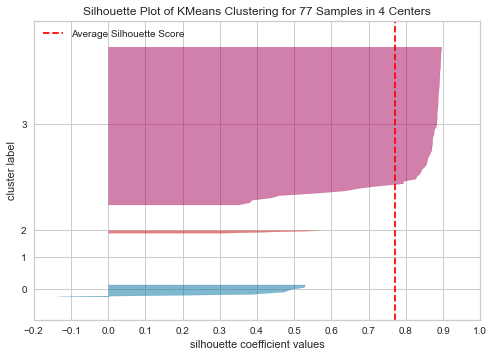

<Figure size 576x396 with 0 Axes>

In [130]:
_ = silhouette_visualizer(km_best, norm_data, colors='yellowbrick')

path = images_path / Path("ensayos/clustering_gas_media_en_contador/total")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("silhouette.svg"))

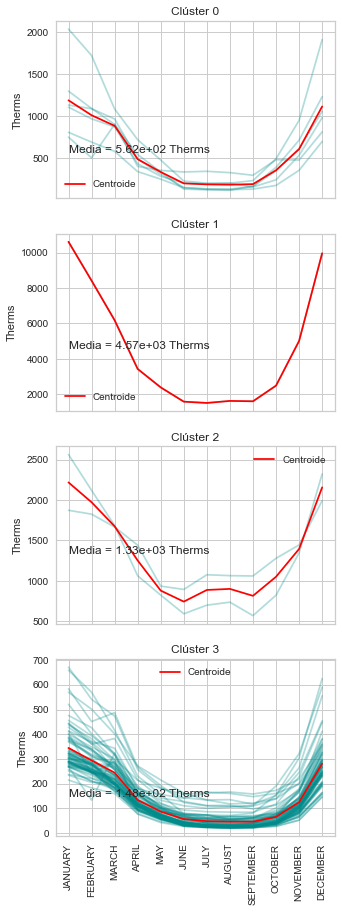

In [131]:
labels = pd.DataFrame(km_labels, columns=["label"])

k = km_centroids.shape[0]

f, axes = plt.subplots(k, 1, figsize=(5, 15), sharex=True)

for ki in range(k):
    cluster = mean_gas.iloc[labels.query(f'label == {ki}').index][dl.gas_cols]
    palette={i:"darkcyan" for i in range(cluster.shape[0])}

    ax0 = sns.lineplot(data=cluster.values.T, ax=axes[ki], palette=palette, alpha=0.3)
    _ = [line.set_linestyle("-") for line in ax0.lines]
    
    ax0c = sns.lineplot(data=km_centroids[ki, :].T, ax=axes[ki], color="red")
    _ = [line.set_linestyle("-") for line in ax0c.lines]
    
    ax0c.legend(ax0c.lines[-1:], ["Centroide"]);
    
    ax0.set_title(f"Clúster {ki}")
    Media = km_centroids[ki, :].mean()
    ax0.text(0, Media, f"{Media = :0.2e} Therms")
    ax0.set(ylabel="Therms")
    
    ax0.set_xticks([e for e in range(0, 12)])
    ax0.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)

path = images_path / Path("ensayos/clustering_gas_media_en_contador/total")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("graficas.svg"))

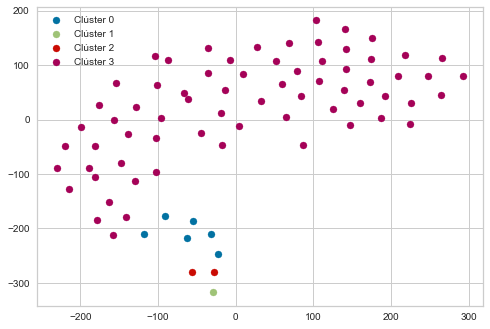

In [133]:
v = tsne(mean_gas[dl.gas_cols], 2)
for label in range(k):
    plt.scatter(
            x=v[(labels['label']==label).values, 0],
            y=v[(labels['label']==label).values, 1]
    )
plt.legend([f"Clúster {i}" for i in range(k)])

path = images_path / Path("ensayos/clustering_gas_media_en_contador/total")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("scatter.svg"))

¿Qué comunidades hay en cada clúster?

In [134]:
comunities_by_cluster = {}

for nlab in range(k):
    com_index = np.where(labels==nlab)[0]
    com_list = []
    for c in mean_gas.values[com_index][:,0]:
        com_list.append(c)
    comunities_by_cluster[nlab] = com_list

for k in sorted(comunities_by_cluster, key=lambda k: len(comunities_by_cluster[k])):
    print(f"Al clúster {k} pertenecen las comunidades:")
    for e in comunities_by_cluster[k]:
        print("\t", e)


Al clúster 1 pertenecen las comunidades:
	 Loop
Al clúster 2 pertenecen las comunidades:
	 Near North Side
	 Riverdale
Al clúster 0 pertenecen las comunidades:
	 Burnside
	 Douglas
	 Hyde Park
	 Kenwood
	 Near South Side
	 O'Hare
Al clúster 3 pertenecen las comunidades:
	 Albany Park
	 Archer Heights
	 Armour Square
	 Ashburn
	 Auburn Gresham
	 Austin
	 Avalon Park
	 Avondale
	 Belmont Cragin
	 Beverly
	 Bridgeport
	 Brighton Park
	 Calumet Heights
	 Chatham
	 Chicago Lawn
	 Clearing
	 Dunning
	 East Garfield Park
	 East Side
	 Edgewater
	 Edison Park
	 Englewood
	 Forest Glen
	 Fuller Park
	 Gage Park
	 Garfield Ridge
	 Grand Boulevard
	 Greater Grand Crossing
	 Hegewisch
	 Hermosa
	 Humboldt Park
	 Irving Park
	 Jefferson Park
	 Lakeview
	 Lincoln Park
	 Lincoln Square
	 Logan Square
	 Lower West Side
	 McKinley Park
	 Montclare
	 Morgan Park
	 Mount Greenwood
	 Near West Side
	 New City
	 North Center
	 North Lawndale
	 North Park
	 Norwood Park
	 Oakland
	 Portage Park
	 Pullman
	 

#### Separación por cuartiles

Vamos a separar las muestras muy alejadas del valor medio mediante la eliminación de outliers. Dividiremos en 3 porciones: los que están muy por abajo de la media, en *mean_q1*; los que están muy por encima de la media, en *mean_q4*; y los que se encuentran sobre la media, en *mean_qm*. Con este tratamiento previo trataremos de encontrar de mejor modo patrones dentro de cada grupo.

In [135]:
zmin_score = 0.26

z_mean_gas = zscore(mean_gas[dl.gas_cols])
mean_gas_qm = mean_gas[np.logical_and(-zmin_score <= z_mean_gas, z_mean_gas <= zmin_score).all(axis=1)]
mean_gas_q1 = mean_gas[(-zmin_score > z_mean_gas).all(axis=1)]
mean_gas_q4 = mean_gas[(zmin_score < z_mean_gas).all(axis=1)]

mean_gas_qm

,COMMUNITY AREA NAME,THERM JANUARY 2010,THERM FEBRUARY 2010,THERM MARCH 2010,THERM APRIL 2010,THERM MAY 2010,THERM JUNE 2010,THERM JULY 2010,THERM AUGUST 2010,THERM SEPTEMBER 2010,THERM OCTOBER 2010,THERM NOVEMBER 2010,THERM DECEMBER 2010
1,Archer Heights,521.052922,401.826920,315.615721,168.591343,108.174522,76.405301,73.128319,66.208327,66.431437,85.968940,163.912070,411.780009
2,Armour Square,583.664740,451.322075,487.174976,267.113941,193.111138,123.958385,110.153765,108.135963,111.420355,190.671587,321.742738,590.266422
5,Austin,375.527418,340.070165,256.766228,147.349960,101.834839,64.277464,59.122924,56.433242,54.945450,69.581625,143.622471,315.235657
11,Brighton Park,329.036687,270.078502,239.283083,132.245368,91.166026,68.551441,51.058345,52.244289,62.327791,64.676049,104.926773,232.598242
21,Edgewater,658.917630,570.229261,416.664880,231.148473,156.636148,79.454516,73.251229,71.783102,81.109346,154.394763,303.713912,625.323361
31,Hermosa,413.722371,368.280032,286.225292,183.922083,133.238923,110.972275,100.823497,105.861043,109.505919,138.939544,202.431431,382.412413
37,Lakeview,437.751977,382.584217,295.267978,166.219545,109.859130,67.378199,57.978375,56.030234,60.159221,92.558238,169.443953,352.299955
42,Lower West Side,443.226312,359.981507,382.984658,216.159551,142.063576,128.130953,111.958657,112.407813,98.313283,113.654632,172.630533,325.808930
43,McKinley Park,323.566614,280.694309,276.185830,140.544196,101.248356,80.469367,73.856148,57.956081,62.759469,75.724301,112.027159,234.817817
49,Near West Side,671.089125,541.241674,473.597290,257.104121,183.030549,143.469029,134.390934,135.583177,117.382970,152.604912,264.358699,555.532796


In [136]:
mean_gas_q1

,COMMUNITY AREA NAME,THERM JANUARY 2010,THERM FEBRUARY 2010,THERM MARCH 2010,THERM APRIL 2010,THERM MAY 2010,THERM JUNE 2010,THERM JULY 2010,THERM AUGUST 2010,THERM SEPTEMBER 2010,THERM OCTOBER 2010,THERM NOVEMBER 2010,THERM DECEMBER 2010
20,East Side,234.096488,205.636718,200.159872,104.559541,60.048371,40.656037,24.424548,21.883132,22.843186,27.464492,52.064187,144.921484
30,Hegewisch,256.971420,209.963993,185.351310,99.199959,57.086837,33.176131,25.057912,21.692122,23.137106,31.599408,69.430850,158.439756
35,Jefferson Park,267.822697,239.742414,186.320303,110.622652,58.567879,37.180809,27.102508,24.842575,25.624770,36.801825,82.166749,190.918519
40,Logan Square,237.602956,220.901166,200.925168,95.981718,62.083632,42.810736,34.941626,32.565628,33.249863,46.279649,87.237568,204.288151
51,North Center,251.140221,211.428602,175.547574,92.889053,56.446202,32.115566,25.250018,20.648477,20.614367,32.650028,67.422616,164.334048
75,West Town,214.904567,183.123474,159.826261,78.785008,46.839160,30.773432,23.777846,21.285254,22.968842,28.651958,53.462065,148.915897


In [137]:
mean_gas_q4

,COMMUNITY AREA NAME,THERM JANUARY 2010,THERM FEBRUARY 2010,THERM MARCH 2010,THERM APRIL 2010,THERM MAY 2010,THERM JUNE 2010,THERM JULY 2010,THERM AUGUST 2010,THERM SEPTEMBER 2010,THERM OCTOBER 2010,THERM NOVEMBER 2010,THERM DECEMBER 2010
41,Loop,10605.645853,8416.081631,6183.463934,3435.484118,2396.747512,1592.728842,1520.397669,1634.239188,1613.739611,2495.810977,5013.781157,9956.751008
47,Near North Side,2561.680909,2119.106513,1683.767077,1062.919003,824.563958,593.747481,700.338868,737.632438,570.851880,823.457823,1344.985954,2320.957193
48,Near South Side,2039.334959,1723.952502,1085.831066,719.351076,476.540802,226.049091,200.692879,200.828904,231.522441,491.562926,950.021815,1913.890225
59,Riverdale,1872.426728,1824.674491,1665.893264,1441.338703,935.926139,894.621183,1076.188708,1065.118085,1060.908624,1279.218855,1444.840866,1990.056394


Aplicamos clustering a los valores en ***mean_qm***.

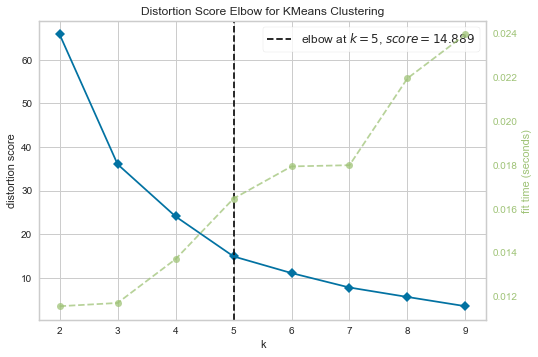

<Figure size 576x396 with 0 Axes>

In [138]:
kmax = 10
k_values = (2, kmax)

scaler = preprocessing.StandardScaler()
data = mean_gas_qm[dl.gas_cols]
norm_data = scaler.fit_transform(data)

km = KMeansCluster(norm_data)
km.cluster(k_values)

path = images_path / Path("ensayos/clustering_gas_media_en_contador/mean_qm")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("elbow.svg"))

In [139]:
km_best = km.get_kmeans_of(5)
km_labels = km_best.labels_
km_centroids = scaler.inverse_transform(km_best.cluster_centers_)

km_labels

array([4, 0, 1, 1, 3, 2, 4, 2, 1, 0, 4, 1, 1, 4])

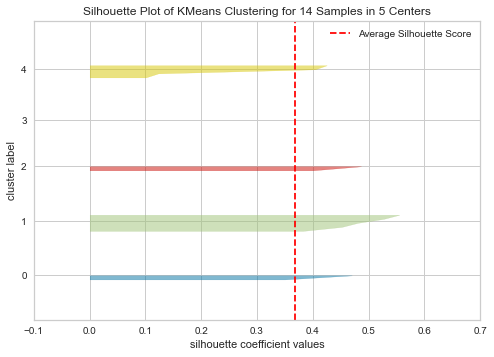

<Figure size 576x396 with 0 Axes>

In [140]:
_ = silhouette_visualizer(km_best, norm_data, colors='yellowbrick')

path = images_path / Path("ensayos/clustering_gas_media_en_contador/mean_qm")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("silhouette.svg"))

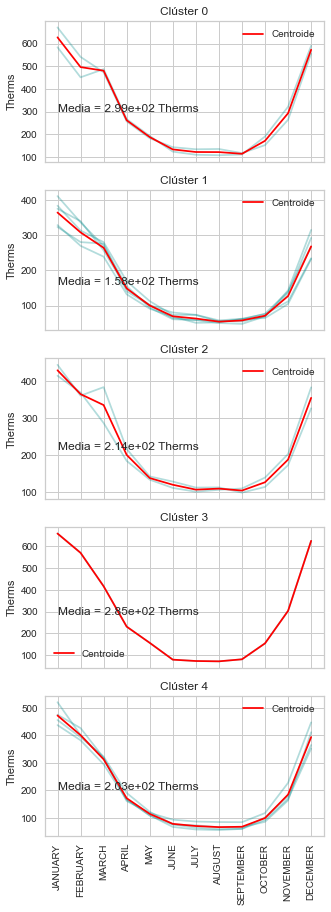

In [141]:
labels = pd.DataFrame(km_labels, columns=["label"])

k = km_centroids.shape[0]

f, axes = plt.subplots(k, 1, figsize=(5, 15), sharex=True)

for ki in range(k):
    cluster = mean_gas_qm.iloc[labels.query(f'label == {ki}').index][dl.gas_cols]
    palette={i:"darkcyan" for i in range(cluster.shape[0])}

    ax0 = sns.lineplot(data=cluster.values.T, ax=axes[ki], palette=palette, alpha=0.3)
    _ = [line.set_linestyle("-") for line in ax0.lines]
    
    ax0c = sns.lineplot(data=km_centroids[ki, :].T, ax=axes[ki], color="red")
    _ = [line.set_linestyle("-") for line in ax0c.lines]
    
    ax0c.legend(ax0c.lines[-1:], ["Centroide"]);
    
    ax0.set_title(f"Clúster {ki}")
    Media = km_centroids[ki, :].mean()
    ax0.text(0, Media, f"{Media = :0.2e} Therms")
    ax0.set(ylabel="Therms")
    
    ax0.set_xticks([e for e in range(0, 12)])
    ax0.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)

path = images_path / Path("ensayos/clustering_gas_media_en_contador/mean_qm")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("grafica.svg"))

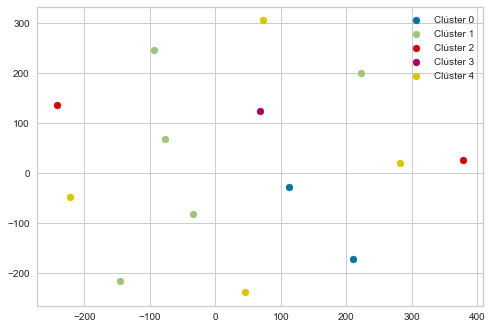

In [142]:
v = tsne(mean_gas_qm[dl.gas_cols], 2)
for label in range(k):
    plt.scatter(
            x=v[(labels['label']==label).values, 0],
            y=v[(labels['label']==label).values, 1]
    )
plt.legend([f"Clúster {i}" for i in range(k)])

path = images_path / Path("ensayos/clustering_gas_media_en_contador/mean_qm")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("scatter.svg"))

In [143]:
comunities_by_cluster = {}

for nlab in range(k):
    com_index = np.where(labels==nlab)[0]
    com_list = []
    for c in mean_gas_qm.values[com_index][:,0]:
        com_list.append(c)
    comunities_by_cluster[nlab] = com_list

for k in sorted(comunities_by_cluster, key=lambda k: len(comunities_by_cluster[k])):
    print(f"Al clúster {k} pertenecen las comunidades:")
    for e in comunities_by_cluster[k]:
        print("\t", e)

Al clúster 3 pertenecen las comunidades:
	 Edgewater
Al clúster 0 pertenecen las comunidades:
	 Armour Square
	 Near West Side
Al clúster 2 pertenecen las comunidades:
	 Hermosa
	 Lower West Side
Al clúster 4 pertenecen las comunidades:
	 Archer Heights
	 Lakeview
	 New City
	 Uptown
Al clúster 1 pertenecen las comunidades:
	 Austin
	 Brighton Park
	 McKinley Park
	 North Park
	 South Shore


Visualizamos ***mean_q1***.

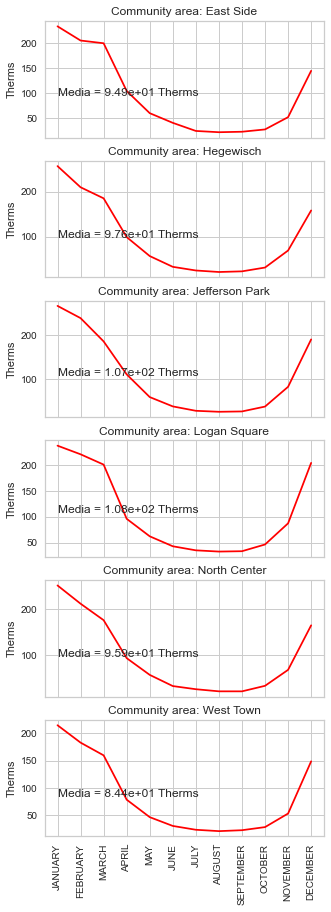

In [144]:
f, axes = plt.subplots(6, 1, figsize=(5, 15), sharex=True)

for i, (com_name, (index, row)) in enumerate(zip(mean_gas_q1['COMMUNITY AREA NAME'], mean_gas_q1[dl.gas_cols].iterrows())):
    ax0 = sns.lineplot(data=row.T, ax=axes[i], color="red")
    
    ax0.set_xticks([e for e in range(0, 12)])
    ax0.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)
    
    ax0.set_title(f"Community area: {com_name}")
    Media = row.mean()
    ax0.text(0, Media, f"{Media = :0.2e} Therms")
    
    ax0.set(ylabel="Therms")

path = images_path / Path("ensayos/clustering_gas_media_en_contador/mean_q1")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("grafica.svg"))

Visualizamos ***mean_q4***.

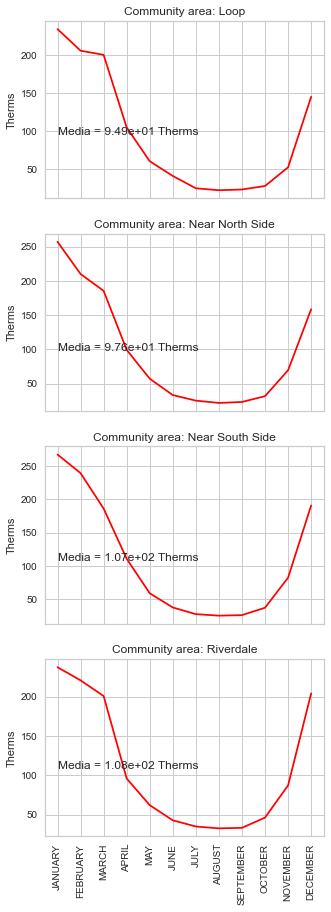

In [145]:
f, axes = plt.subplots(4, 1, figsize=(5, 15), sharex=True)

for i, (com_name, (index, row)) in enumerate(zip(mean_gas_q4['COMMUNITY AREA NAME'], mean_gas_q1[dl.gas_cols].iterrows())):
    ax0 = sns.lineplot(data=row.T, ax=axes[i], color="red")
    
    ax0.set_xticks([e for e in range(0, 12)])
    ax0.set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)
    
    ax0.set_title(f"Community area: {com_name}")
    Media = row.mean()
    ax0.text(0, Media, f"{Media = :0.2e} Therms")
    
    ax0.set(ylabel="Therms")

path = images_path / Path("ensayos/clustering_gas_media_en_contador/mean_q4")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("grafica.svg"))

### [Volver al inicio](#Consumo-de-energía-en-Chicago-en-2010)

---

### Clustering por edad del edificio

En este caso vamos a buscar patrones según la edad promedio de los edificios de cada comunidad.

In [146]:
building_age = dl[['AVERAGE BUILDING AGE']]
building_age

,AVERAGE BUILDING AGE
0,71.33
1,41.00
2,86.00
3,84.00
4,85.00
...,...
67046,0.00
67047,104.50
67048,100.67
67049,0.00


El rango de edad promedio es:

In [147]:
f"La edad media de los edificios oscila entre {building_age.min().item()} y {building_age.max().item()} años (incluyendo filas nulas)"

'La edad media de los edificios oscila entre 0.0 y 158.0 años (incluyendo filas nulas)'

In [148]:
energy_building_age = dl[['AVERAGE BUILDING AGE', 'COMMUNITY AREA NAME', 'CENSUS BLOCK', 'BUILDING TYPE', 'BUILDING_SUBTYPE'] + dl.energy_cols]
gas_building_age = dl[['AVERAGE BUILDING AGE', 'COMMUNITY AREA NAME', 'CENSUS BLOCK', 'BUILDING TYPE', 'BUILDING_SUBTYPE'] + dl.gas_cols]

In [149]:
f"Para las filas no nulas de energía, la edad oscila entre {energy_building_age[['AVERAGE BUILDING AGE']].min().item()} y {energy_building_age[['AVERAGE BUILDING AGE']].max().item()}"

'Para las filas no nulas de energía, la edad oscila entre 0.0 y 158.0'

In [150]:
f"Para las filas no nulas de energía, la edad oscila entre {gas_building_age[['AVERAGE BUILDING AGE']].min().item()} y {gas_building_age[['AVERAGE BUILDING AGE']].max().item()}"

'Para las filas no nulas de energía, la edad oscila entre 0.0 y 153.5'

#### Energía

Aplicamos clustering a las muestras de consumo de electricidad.

In [151]:
energy_building_age

,AVERAGE BUILDING AGE,COMMUNITY AREA NAME,CENSUS BLOCK,BUILDING TYPE,BUILDING_SUBTYPE,KWH JANUARY 2010,KWH FEBRUARY 2010,KWH MARCH 2010,KWH APRIL 2010,KWH MAY 2010,KWH JUNE 2010,KWH JULY 2010,KWH AUGUST 2010,KWH SEPTEMBER 2010,KWH OCTOBER 2010,KWH NOVEMBER 2010,KWH DECEMBER 2010
1,41.00,Ashburn,1.703170e+14,Residential,Multi 7+,7334.0,7741.0,4214.0,4284.0,2518.0,4273.0,4566.0,2787.0,3357.0,5540.0,15774.0,19676.0
5,131.00,Austin,1.703125e+14,Commercial,Commercial,0.0,0.0,0.0,0.0,0.0,0.0,0.0,819.0,619.0,416.0,138.0,2.0
7,131.00,Austin,1.703125e+14,Commercial,Multi < 7,1470.0,1325.0,294.0,391.0,366.0,2204.0,2345.0,2032.0,920.0,586.0,705.0,785.0
8,99.00,Austin,1.703125e+14,Residential,Multi 7+,2461.0,4888.0,2893.0,2737.0,2350.0,3037.0,3874.0,4861.0,5180.0,2984.0,2635.0,3597.0
9,99.00,Austin,1.703125e+14,Residential,Multi 7+,0.0,0.0,0.0,0.0,0.0,511.0,904.0,1818.0,1968.0,738.0,450.0,2207.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67046,0.00,Woodlawn,1.703184e+14,Residential,Single Family,2705.0,1318.0,1582.0,1465.0,1494.0,2990.0,2449.0,2351.0,1213.0,2174.0,2888.0,5025.0
67047,104.50,Woodlawn,1.703184e+14,Commercial,Multi < 7,1005.0,1760.0,1521.0,1832.0,2272.0,2361.0,3018.0,3030.0,2886.0,3833.0,6290.0,12169.0
67048,100.67,Woodlawn,1.703184e+14,Residential,Multi < 7,3567.0,3031.0,2582.0,2295.0,7902.0,4987.0,5773.0,3996.0,3050.0,3103.0,3880.0,4684.0
67049,0.00,Woodlawn,1.703184e+14,Residential,Single Family,1208.0,1055.0,1008.0,1109.0,1591.0,1367.0,1569.0,1551.0,1376.0,1236.0,2108.0,2529.0


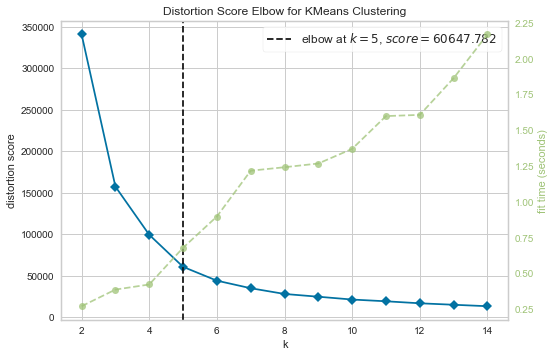

<Figure size 576x396 with 0 Axes>

In [152]:
kmax = 15
k_values = (2, kmax)

scaler = preprocessing.StandardScaler()
norm_data = scaler.fit_transform(energy_building_age[dl.energy_cols])

km = KMeansCluster(norm_data)
km.cluster(k_values)

path = images_path / Path("ensayos/clustering_por_edad_edificio/energia")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("elbow.svg"))

In [153]:
km_best = km.get_kmeans_of(5)
km_labels = km_best.labels_
km_centroids = scaler.inverse_transform(km_best.cluster_centers_)

np.unique(km_labels, return_counts=True)

(array([0, 1, 2, 3, 4]),
 array([65812,     2,    53,     6,   230], dtype=int64))

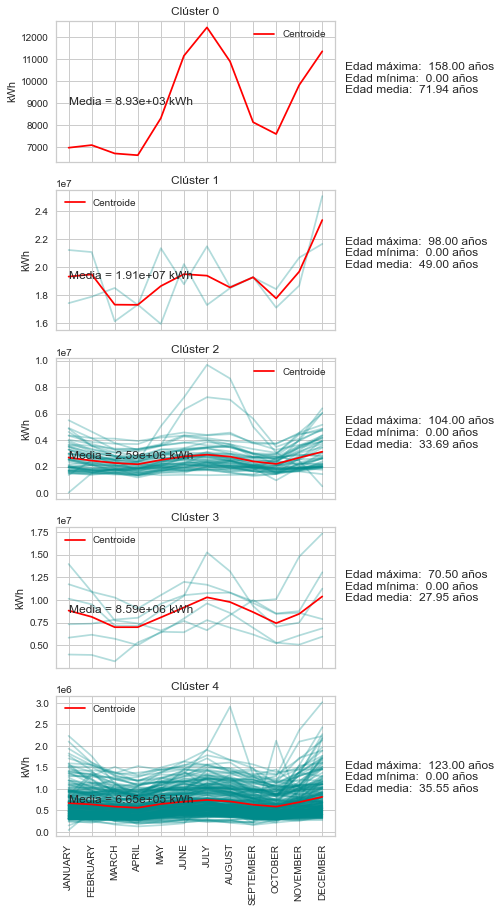

In [154]:
labels = pd.DataFrame(km_labels, columns=["label"])

k = km_centroids.shape[0]

f, axes = plt.subplots(k, 1, figsize=(5, 15), sharex=True)

for ki in range(k):
    cluster = energy_building_age.iloc[labels.query(f'label == {ki}').index][dl.energy_cols]
    
    palette={i:"darkcyan" for i in range(cluster.shape[0])}
    
    if len(cluster) < 10000: #para reducir el tiempo de computo no mostramos para un máximo de muestras
        ax0 = sns.lineplot(data=cluster.values.T, ax=axes[ki], palette=palette, alpha=0.3)
        _ = [line.set_linestyle("-") for line in ax0.lines]
    
    ax0c = sns.lineplot(data=km_centroids[ki, :].T, ax=axes[ki], color="red")
    _ = [line.set_linestyle("-") for line in ax0c.lines]
    
    ax0c.legend(ax0c.lines[-1:], ["Centroide"]);
    
    axes[ki].set_title(f"Clúster {ki}")
    Media = km_centroids[ki, :].mean()
    axes[ki].text(0, Media, f"{Media = :0.2e} kWh")
    
    axes[ki].set_xticks([e for e in range(0, 12)])
    axes[ki].set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)
    axes[ki].set(ylabel="kWh")
    #print(f"Gráfica {ki} realizada")
    
    cluster_age = energy_building_age.iloc[labels.query(f'label == {ki}').index]["AVERAGE BUILDING AGE"]
    
    txt = f"Edad máxima: {cluster_age.max(): 0.2f} años\n" + \
          f"Edad mínima: {cluster_age.min(): 0.2f} años\n" + \
          f"Edad media: {cluster_age.mean(): 0.2f} años\n"
    axes[ki].text(12, Media, txt)

    
path = images_path / Path("ensayos/clustering_por_edad_edificio/energia")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("grafica.svg"))

In [155]:
comunities_by_cluster = {}

for nlab in range(k):
    com_index = np.where(labels==nlab)[0]
    com_list = []
    for c in energy_building_age.values[com_index][:,1:5]:
        com_list.append(c)
    comunities_by_cluster[nlab] = com_list

for k in sorted(comunities_by_cluster, key=lambda k: len(comunities_by_cluster[k])):
    print(f"Al clúster {k} pertenecen las comunidades:")
    for e in comunities_by_cluster[k]:
        print("\t", e)

Al clúster 1 pertenecen las comunidades:
	 ['Near West Side' 170312801002012.0 'Industrial' 'Industrial']
	 ['Near South Side' 170313301004040.0 'Commercial' 'Commercial']
Al clúster 3 pertenecen las comunidades:
	 ['Forest Glen' 170319801001006.0 'Commercial' 'Municipal']
	 ['Loop' 170313201001005.0 'Commercial' 'Commercial']
	 ['Loop' 170318391002006.0 'Commercial' 'Commercial']
	 ['Near North Side' 170310814011004.0 'Commercial' 'Commercial']
	 ['Near North Side' 170310814012003.0 'Commercial' 'Commercial']
	 ['Woodlawn' 170314204001009.0 'Commercial' 'Commercial']
Al clúster 2 pertenecen las comunidades:
	 ['Loop' 170313201001016.0 'Commercial' 'Commercial']
	 ['Austin' 170318314002013.0 'Commercial' 'Municipal']
	 ['Loop' 170318391001083.0 'Commercial' 'Commercial']
	 ['Archer Heights' 170315702001002.0 'Commercial' 'Commercial']
	 ['Archer Heights' 170315702001009.0 'Commercial' 'Commercial']
	 ['Belmont Cragin' 170311913012018.0 'Commercial' 'Commercial']
	 ['Lincoln Park' 17031

	 ['Near North Side' 170318422001062.0 'Commercial' 'Commercial']
	 ['Near South Side' 170313302002040.0 'Residential' 'Single Family']
	 ['West Garfield Park' 170312607001006.0 'Residential' 'Multi 7+']
	 ['West Garfield Park' 170312607001010.0 'Commercial' 'Multi < 7']
	 ['West Ridge' 170310201001009.0 'Commercial' 'Multi 7+']
	 ['West Ridge' 170310203021003.0 'Commercial' 'Commercial']
	 ['West Ridge' 170310203023010.0 'Commercial' 'Multi < 7']
	 ['West Ridge' 170310205001008.0 'Commercial' 'Commercial']
	 ['West Town' 170312421003026.0 'Commercial' 'Commercial']
	 ['West Town' 170312411002005.0 'Commercial' 'Commercial']
	 ['West Town' 170312415001010.0 'Commercial' 'Commercial']
	 ['Albany Park' 170311408002012.0 'Commercial' 'Multi < 7']
	 ['Armour Square' 170313404001021.0 'Commercial' 'Multi < 7']
	 ['West Town' 170312423001003.0 'Commercial' 'Multi 7+']
	 ['Armour Square' 170313405001019.0 'Residential' 'Multi < 7']
	 ['West Town' 170312434001000.0 'Commercial' 'Multi 7+']
	 [

	 ['Archer Heights' 170315701001027.0 'Residential' 'Single Family']
	 ['Archer Heights' 170315701001028.0 'Commercial' 'Commercial']
	 ['Archer Heights' 170315701001028.0 'Residential' 'Multi < 7']
	 ['Archer Heights' 170315701001029.0 'Commercial' 'Commercial']
	 ['Archer Heights' 170315701001029.0 'Residential' 'Multi < 7']
	 ['Archer Heights' 170315703004021.0 'Commercial' 'Commercial']
	 ['Archer Heights' 170315701001029.0 'Residential' 'Single Family']
	 ['Archer Heights' 170315701001034.0 'Commercial' 'Commercial']
	 ['Archer Heights' 170315701001035.0 'Residential' 'Multi < 7']
	 ['Archer Heights' 170315701001035.0 'Residential' 'Single Family']
	 ['Archer Heights' 170315702001023.0 'Residential' 'Multi < 7']
	 ['Archer Heights' 170315702001003.0 'Commercial' 'Commercial']
	 ['Archer Heights' 170315702001005.0 'Commercial' 'Commercial']
	 ['Archer Heights' 170315702001010.0 'Commercial' 'Commercial']
	 ['Archer Heights' 170315702001014.0 'Commercial' 'Commercial']
	 ['Archer He

	 ['Ashburn' 170317004023009.0 'Residential' 'Single Family']
	 ['Ashburn' 170317004023010.0 'Residential' 'Single Family']
	 ['Ashburn' 170317004023011.0 'Residential' 'Single Family']
	 ['Ashburn' 170317004023012.0 'Residential' 'Single Family']
	 ['Ashburn' 170317004023013.0 'Residential' 'Single Family']
	 ['Ashburn' 170317004023014.0 'Residential' 'Single Family']
	 ['Ashburn' 170317004023015.0 'Residential' 'Single Family']
	 ['Ashburn' 170317004023016.0 'Residential' 'Single Family']
	 ['Ashburn' 170317004023018.0 'Commercial' 'Commercial']
	 ['Ashburn' 170317004023019.0 'Residential' 'Single Family']
	 ['Ashburn' 170317004023020.0 'Residential' 'Single Family']
	 ['Ashburn' 170317004023021.0 'Residential' 'Single Family']
	 ['Ashburn' 170317004023022.0 'Residential' 'Single Family']
	 ['Ashburn' 170317004023023.0 'Residential' 'Single Family']
	 ['Ashburn' 170317004023024.0 'Residential' 'Single Family']
	 ['Ashburn' 170317004023025.0 'Residential' 'Single Family']
	 ['Ashburn'

	 ['Auburn Gresham' 170317111001004.0 'Residential' 'Multi < 7']
	 ['Auburn Gresham' 170317111001004.0 'Residential' 'Single Family']
	 ['Auburn Gresham' 170317111001005.0 'Residential' 'Single Family']
	 ['Auburn Gresham' 170317111001006.0 'Residential' 'Multi < 7']
	 ['Auburn Gresham' 170317111001006.0 'Residential' 'Single Family']
	 ['Auburn Gresham' 170317111001007.0 'Residential' 'Single Family']
	 ['Auburn Gresham' 170317111001008.0 'Residential' 'Multi < 7']
	 ['Auburn Gresham' 170317111001008.0 'Residential' 'Single Family']
	 ['Auburn Gresham' 170317111002006.0 'Residential' 'Multi < 7']
	 ['Auburn Gresham' 170317111001009.0 'Residential' 'Multi < 7']
	 ['Auburn Gresham' 170317111001009.0 'Residential' 'Single Family']
	 ['Auburn Gresham' 170317111001010.0 'Residential' 'Multi < 7']
	 ['Auburn Gresham' 170317111001010.0 'Residential' 'Single Family']
	 ['Auburn Gresham' 170317111001012.0 'Commercial' 'Commercial']
	 ['Auburn Gresham' 170317111001012.0 'Residential' 'Multi < 7

	 ['Austin' 170312508002004.0 'Residential' 'Single Family']
	 ['Austin' 170312508002005.0 'Residential' 'Multi 7+']
	 ['Austin' 170312508002005.0 'Residential' 'Multi < 7']
	 ['Austin' 170312508002005.0 'Residential' 'Single Family']
	 ['Austin' 170312508002006.0 'Residential' 'Single Family']
	 ['Austin' 170312508002007.0 'Residential' 'Single Family']
	 ['Austin' 170312508002008.0 'Residential' 'Multi < 7']
	 ['Austin' 170312508002008.0 'Residential' 'Single Family']
	 ['Austin' 170312508002009.0 'Residential' 'Multi < 7']
	 ['Austin' 170312508002010.0 'Residential' 'Single Family']
	 ['Austin' 170312508002011.0 'Commercial' 'Commercial']
	 ['Austin' 170312508002011.0 'Residential' 'Multi < 7']
	 ['Austin' 170312508002011.0 'Residential' 'Single Family']
	 ['Austin' 170312508002012.0 'Residential' 'Single Family']
	 ['Austin' 170312508002013.0 'Commercial' 'Multi < 7']
	 ['Austin' 170312508002013.0 'Residential' 'Multi < 7']
	 ['Austin' 170312508002013.0 'Residential' 'Single Family

	 ['Austin' 170312521021014.0 'Commercial' 'Multi < 7']
	 ['Grand Boulevard' 170313802001001.0 'Commercial' 'Commercial']
	 ['Austin' 170312521021014.0 'Residential' 'Multi 7+']
	 ['Austin' 170312521021014.0 'Residential' 'Multi < 7']
	 ['Austin' 170312521022001.0 'Residential' 'Multi < 7']
	 ['Austin' 170312521022001.0 'Residential' 'Single Family']
	 ['Austin' 170312521022002.0 'Residential' 'Multi < 7']
	 ['Austin' 170312521022002.0 'Residential' 'Single Family']
	 ['Austin' 170312521022003.0 'Commercial' 'Multi < 7']
	 ['Austin' 170312521022003.0 'Residential' 'Multi < 7']
	 ['Austin' 170312521022003.0 'Residential' 'Single Family']
	 ['Austin' 170312521022004.0 'Commercial' 'Multi 7+']
	 ['Austin' 170312521022004.0 'Commercial' 'Multi < 7']
	 ['Austin' 170312521022004.0 'Residential' 'Multi < 7']
	 ['Austin' 170312521022005.0 'Commercial' 'Commercial']
	 ['Austin' 170312521022005.0 'Commercial' 'Multi < 7']
	 ['Austin' 170312521022005.0 'Residential' 'Multi < 7']
	 ['Austin' 17031

	 ['Avondale' 170312107001001.0 'Residential' 'Single Family']
	 ['Avondale' 170312107001002.0 'Residential' 'Multi < 7']
	 ['Avondale' 170312107001003.0 'Residential' 'Multi < 7']
	 ['Avondale' 170312107001003.0 'Residential' 'Single Family']
	 ['Avondale' 170312107001004.0 'Commercial' 'Multi 7+']
	 ['Avondale' 170312107001004.0 'Residential' 'Multi 7+']
	 ['Avondale' 170312107001004.0 'Residential' 'Multi < 7']
	 ['Avondale' 170312107001004.0 'Residential' 'Single Family']
	 ['Avondale' 170312107001005.0 'Residential' 'Multi < 7']
	 ['Avondale' 170312107001005.0 'Residential' 'Single Family']
	 ['Avondale' 170312107001006.0 'Residential' 'Multi < 7']
	 ['Avondale' 170312107001006.0 'Residential' 'Single Family']
	 ['Avondale' 170312107001011.0 'Residential' 'Multi < 7']
	 ['Avondale' 170312107002001.0 'Residential' 'Single Family']
	 ['Avondale' 170312107001011.0 'Residential' 'Single Family']
	 ['Avondale' 170312107001012.0 'Residential' 'Multi < 7']
	 ['Avondale' 170312107001012.0

	 ['Belmont Cragin' 170311906023010.0 'Residential' 'Single Family']
	 ['Belmont Cragin' 170311906023011.0 'Residential' 'Multi < 7']
	 ['Belmont Cragin' 170311906023011.0 'Residential' 'Single Family']
	 ['Belmont Cragin' 170311906023012.0 'Residential' 'Multi < 7']
	 ['Chatham' 170314409001010.0 'Residential' 'Single Family']
	 ['Belmont Cragin' 170311906023012.0 'Residential' 'Single Family']
	 ['Belmont Cragin' 170311906023013.0 'Residential' 'Multi < 7']
	 ['Belmont Cragin' 170311906023013.0 'Residential' 'Single Family']
	 ['Belmont Cragin' 170311906023014.0 'Residential' 'Multi < 7']
	 ['Belmont Cragin' 170311906023014.0 'Residential' 'Single Family']
	 ['Belmont Cragin' 170311906023015.0 'Residential' 'Multi < 7']
	 ['Belmont Cragin' 170311906023015.0 'Residential' 'Single Family']
	 ['Belmont Cragin' 170311906023016.0 'Residential' 'Multi < 7']
	 ['Belmont Cragin' 170311906023016.0 'Residential' 'Single Family']
	 ['Belmont Cragin' 170311906023017.0 'Residential' 'Multi < 7']


	 ['Beverly' 170317203002021.0 'Residential' 'Single Family']
	 ['Bridgeport' 170318399003012.0 'Residential' 'Multi < 7']
	 ['Beverly' 170317203002022.0 'Residential' 'Single Family']
	 ['Beverly' 170317203002023.0 'Residential' 'Single Family']
	 ['Beverly' 170317203002024.0 'Residential' 'Single Family']
	 ['Beverly' 170317203002025.0 'Residential' 'Single Family']
	 ['Beverly' 170317203002026.0 'Residential' 'Single Family']
	 ['Beverly' 170317203002027.0 'Residential' 'Single Family']
	 ['Beverly' 170317203002028.0 'Commercial' 'Commercial']
	 ['Beverly' 170317203003000.0 'Residential' 'Single Family']
	 ['Beverly' 170317203003001.0 'Residential' 'Single Family']
	 ['Beverly' 170317203003002.0 'Residential' 'Single Family']
	 ['Beverly' 170317203003003.0 'Residential' 'Multi < 7']
	 ['Beverly' 170317203003028.0 'Residential' 'Single Family']
	 ['Beverly' 170317203003003.0 'Residential' 'Single Family']
	 ['Beverly' 170317203003004.0 'Residential' 'Single Family']
	 ['Beverly' 1703

	 ['Brighton Park' 170315802002002.0 'Residential' 'Multi < 7']
	 ['Brighton Park' 170315801001020.0 'Residential' 'Single Family']
	 ['Brighton Park' 170315801001021.0 'Residential' 'Multi < 7']
	 ['Brighton Park' 170315801001021.0 'Residential' 'Single Family']
	 ['Brighton Park' 170315801001026.0 'Residential' 'Multi < 7']
	 ['Brighton Park' 170315801001026.0 'Residential' 'Single Family']
	 ['Brighton Park' 170315801001027.0 'Residential' 'Multi < 7']
	 ['Brighton Park' 170315801001027.0 'Residential' 'Single Family']
	 ['Brighton Park' 170315801001028.0 'Residential' 'Multi < 7']
	 ['Brighton Park' 170315801001028.0 'Residential' 'Single Family']
	 ['Brighton Park' 170315801001029.0 'Residential' 'Multi < 7']
	 ['Brighton Park' 170315801001029.0 'Residential' 'Single Family']
	 ['Brighton Park' 170315801001030.0 'Residential' 'Single Family']
	 ['Brighton Park' 170315801001031.0 'Residential' 'Single Family']
	 ['Brighton Park' 170315801001032.0 'Residential' 'Single Family']
	 ['

	 ['Calumet Heights' 170314803001008.0 'Residential' 'Single Family']
	 ['Calumet Heights' 170314803001009.0 'Residential' 'Single Family']
	 ['Calumet Heights' 170314803001010.0 'Residential' 'Single Family']
	 ['Calumet Heights' 170314803001011.0 'Residential' 'Single Family']
	 ['Calumet Heights' 170314803001012.0 'Residential' 'Single Family']
	 ['Calumet Heights' 170314803001013.0 'Residential' 'Single Family']
	 ['Calumet Heights' 170314803001014.0 'Residential' 'Single Family']
	 ['Calumet Heights' 170314803001015.0 'Commercial' 'Multi < 7']
	 ['Calumet Heights' 170314803001015.0 'Residential' 'Multi < 7']
	 ['Calumet Heights' 170314803001015.0 'Residential' 'Single Family']
	 ['Calumet Heights' 170314803001016.0 'Residential' 'Single Family']
	 ['Calumet Heights' 170314803001017.0 'Residential' 'Multi < 7']
	 ['Calumet Heights' 170314803001017.0 'Residential' 'Single Family']
	 ['Calumet Heights' 170314803001018.0 'Residential' 'Single Family']
	 ['Calumet Heights' 170314803001

	 ['Chicago Lawn' 170316603011009.0 'Residential' 'Single Family']
	 ['Chicago Lawn' 170316603011010.0 'Commercial' 'Multi < 7']
	 ['Chicago Lawn' 170316603011010.0 'Residential' 'Multi < 7']
	 ['Chicago Lawn' 170316603011010.0 'Residential' 'Single Family']
	 ['Chicago Lawn' 170316603011011.0 'Residential' 'Multi < 7']
	 ['Chicago Lawn' 170316603011011.0 'Residential' 'Single Family']
	 ['Chicago Lawn' 170316603011012.0 'Commercial' 'Multi < 7']
	 ['Chicago Lawn' 170316603011012.0 'Residential' 'Multi < 7']
	 ['Chicago Lawn' 170316603011012.0 'Residential' 'Single Family']
	 ['Chicago Lawn' 170316606005003.0 'Commercial' 'Multi < 7']
	 ['Chicago Lawn' 170316603011013.0 'Residential' 'Multi < 7']
	 ['Chicago Lawn' 170316603011013.0 'Residential' 'Single Family']
	 ['Chicago Lawn' 170316603011014.0 'Commercial' 'Multi 7+']
	 ['Chicago Lawn' 170316603011014.0 'Residential' 'Multi 7+']
	 ['Chicago Lawn' 170316603011014.0 'Residential' 'Multi < 7']
	 ['Chicago Lawn' 170316603011014.0 'Resi

	 ['Chicago Lawn' 170318350004004.0 'Residential' 'Single Family']
	 ['Chicago Lawn' 170318350004005.0 'Commercial' 'Multi < 7']
	 ['Chicago Lawn' 170318350004005.0 'Residential' 'Multi < 7']
	 ['Chicago Lawn' 170318350004005.0 'Residential' 'Single Family']
	 ['Chicago Lawn' 170318350004006.0 'Residential' 'Multi < 7']
	 ['Chicago Lawn' 170318350004007.0 'Residential' 'Multi < 7']
	 ['Chicago Lawn' 170318350004007.0 'Residential' 'Single Family']
	 ['Chicago Lawn' 170318350004008.0 'Residential' 'Multi < 7']
	 ['Chicago Lawn' 170318350004008.0 'Residential' 'Single Family']
	 ['Chicago Lawn' 170318350004009.0 'Residential' 'Multi < 7']
	 ['Chicago Lawn' 170318350004010.0 'Residential' 'Multi < 7']
	 ['Chicago Lawn' 170318350004010.0 'Residential' 'Single Family']
	 ['Chicago Lawn' 170318350004011.0 'Residential' 'Multi < 7']
	 ['Chicago Lawn' 170318350004011.0 'Residential' 'Single Family']
	 ['Chicago Lawn' 170318350004012.0 'Residential' 'Single Family']
	 ['Chicago Lawn' 1703183500

	 ['Dunning' 170311705001007.0 'Commercial' 'Commercial']
	 ['Dunning' 170311705001007.0 'Residential' 'Multi < 7']
	 ['Dunning' 170311705001007.0 'Residential' 'Single Family']
	 ['Dunning' 170311705001009.0 'Commercial' 'Multi < 7']
	 ['Dunning' 170311705001009.0 'Residential' 'Multi < 7']
	 ['Dunning' 170311705001009.0 'Residential' 'Single Family']
	 ['Dunning' 170311705001011.0 'Residential' 'Multi < 7']
	 ['Dunning' 170311705001012.0 'Residential' 'Multi < 7']
	 ['Dunning' 170311705001012.0 'Residential' 'Single Family']
	 ['Dunning' 170311705001013.0 'Residential' 'Single Family']
	 ['Dunning' 170311705001014.0 'Residential' 'Single Family']
	 ['Dunning' 170311705001015.0 'Residential' 'Single Family']
	 ['Dunning' 170311705001016.0 'Residential' 'Single Family']
	 ['Dunning' 170311705001017.0 'Residential' 'Multi < 7']
	 ['Dunning' 170311705001017.0 'Residential' 'Single Family']
	 ['Dunning' 170311705001018.0 'Residential' 'Single Family']
	 ['Dunning' 170311705001019.0 'Resid

	 ['East Garfield Park' 170318374002000.0 'Commercial' 'Municipal']
	 ['East Garfield Park' 170318374002001.0 'Commercial' 'Multi < 7']
	 ['East Garfield Park' 170318374002001.0 'Residential' 'Multi < 7']
	 ['East Garfield Park' 170318374002002.0 'Residential' 'Multi < 7']
	 ['East Garfield Park' 170318374002002.0 'Residential' 'Single Family']
	 ['East Garfield Park' 170318374002003.0 'Commercial' 'Multi < 7']
	 ['East Garfield Park' 170318374002003.0 'Residential' 'Multi < 7']
	 ['East Garfield Park' 170318374002003.0 'Residential' 'Single Family']
	 ['East Garfield Park' 170318374002005.0 'Commercial' 'Multi 7+']
	 ['East Garfield Park' 170318374002005.0 'Residential' 'Multi < 7']
	 ['East Garfield Park' 170318374002007.0 'Residential' 'Multi < 7']
	 ['East Garfield Park' 170318374002008.0 'Residential' 'Multi < 7']
	 ['East Garfield Park' 170318374002009.0 'Residential' 'Multi < 7']
	 ['East Garfield Park' 170318374002009.0 'Residential' 'Single Family']
	 ['East Garfield Park' 170

	 ['Edgewater' 170310305004001.0 'Residential' 'Multi < 7']
	 ['Edgewater' 170310305004001.0 'Residential' 'Single Family']
	 ['Edgewater' 170310305004002.0 'Commercial' 'Multi 7+']
	 ['Edgewater' 170310305004002.0 'Commercial' 'Multi < 7']
	 ['Edgewater' 170310305004002.0 'Residential' 'Multi < 7']
	 ['Edgewater' 170310305004003.0 'Commercial' 'Commercial']
	 ['Edgewater' 170310305004003.0 'Commercial' 'Multi 7+']
	 ['Edgewater' 170310305004003.0 'Residential' 'Multi 7+']
	 ['Edgewater' 170310305004003.0 'Residential' 'Multi < 7']
	 ['Edgewater' 170310305004004.0 'Commercial' 'Multi < 7']
	 ['Edgewater' 170310305004004.0 'Residential' 'Multi < 7']
	 ['Edgewater' 170310305004004.0 'Residential' 'Single Family']
	 ['Edgewater' 170310305004005.0 'Residential' 'Multi < 7']
	 ['Edgewater' 170310305004007.0 'Residential' 'Multi 7+']
	 ['Edgewater' 170310305004007.0 'Residential' 'Multi < 7']
	 ['Edgewater' 170310305004007.0 'Residential' 'Single Family']
	 ['Edgewater' 170310305004008.0 'Re

	 ['Englewood' 170316813001011.0 'Residential' 'Multi < 7']
	 ['Englewood' 170316813001011.0 'Residential' 'Single Family']
	 ['Englewood' 170316813001014.0 'Residential' 'Single Family']
	 ['Englewood' 170316813001015.0 'Residential' 'Multi < 7']
	 ['Englewood' 170316813001016.0 'Residential' 'Multi < 7']
	 ['Englewood' 170316813001017.0 'Commercial' 'Multi < 7']
	 ['Englewood' 170316813001017.0 'Residential' 'Multi < 7']
	 ['Englewood' 170316813001017.0 'Residential' 'Single Family']
	 ['Englewood' 170316813001018.0 'Residential' 'Single Family']
	 ['Englewood' 170316813001019.0 'Residential' 'Multi < 7']
	 ['Englewood' 170316813001020.0 'Residential' 'Multi < 7']
	 ['Englewood' 170316813002011.0 'Residential' 'Multi < 7']
	 ['Englewood' 170316813001020.0 'Residential' 'Single Family']
	 ['Englewood' 170316813002000.0 'Commercial' 'Commercial']
	 ['Englewood' 170316813002001.0 'Residential' 'Multi < 7']
	 ['Englewood' 170316813002002.0 'Residential' 'Multi < 7']
	 ['Near West Side' 1

	 ['Gage Park' 170316303002010.0 'Residential' 'Single Family']
	 ['Gage Park' 170316303002033.0 'Residential' 'Single Family']
	 ['Gage Park' 170316303002011.0 'Residential' 'Single Family']
	 ['Gage Park' 170316303002012.0 'Residential' 'Multi < 7']
	 ['New City' 170316113003005.0 'Commercial' 'Commercial']
	 ['Gage Park' 170316303002012.0 'Residential' 'Single Family']
	 ['Gage Park' 170316303002013.0 'Residential' 'Multi < 7']
	 ['Gage Park' 170316303002013.0 'Residential' 'Single Family']
	 ['Gage Park' 170316303002014.0 'Residential' 'Multi < 7']
	 ['Gage Park' 170316303002014.0 'Residential' 'Single Family']
	 ['Gage Park' 170316303002015.0 'Residential' 'Multi < 7']
	 ['Gage Park' 170316303002015.0 'Residential' 'Single Family']
	 ['Gage Park' 170316303002016.0 'Residential' 'Multi < 7']
	 ['Gage Park' 170316303002016.0 'Residential' 'Single Family']
	 ['Gage Park' 170316303002017.0 'Commercial' 'Commercial']
	 ['Gage Park' 170316303002017.0 'Commercial' 'Multi 7+']
	 ['Gage Pa

	 ['Garfield Ridge' 170315610001011.0 'Residential' 'Single Family']
	 ['Garfield Ridge' 170315610001012.0 'Residential' 'Single Family']
	 ['Garfield Ridge' 170315610001013.0 'Residential' 'Single Family']
	 ['Garfield Ridge' 170315610001014.0 'Residential' 'Single Family']
	 ['Garfield Ridge' 170315610001015.0 'Residential' 'Single Family']
	 ['Garfield Ridge' 170315610001016.0 'Residential' 'Single Family']
	 ['Garfield Ridge' 170315610001017.0 'Residential' 'Single Family']
	 ['Garfield Ridge' 170315610001018.0 'Residential' 'Single Family']
	 ['Garfield Ridge' 170315610001019.0 'Residential' 'Single Family']
	 ['Garfield Ridge' 170315610001020.0 'Residential' 'Single Family']
	 ['Garfield Ridge' 170315610001022.0 'Residential' 'Single Family']
	 ['Garfield Ridge' 170315610001023.0 'Residential' 'Single Family']
	 ['Garfield Ridge' 170315610002000.0 'Commercial' 'Commercial']
	 ['Irving Park' 170311607003015.0 'Commercial' 'Multi < 7']
	 ['Garfield Ridge' 170315610002000.0 'Residen

	 ['Greater Grand Crossing' 170316909004004.0 'Commercial' 'Commercial']
	 ['Greater Grand Crossing' 170316909004004.0 'Residential' 'Multi 7+']
	 ['Greater Grand Crossing' 170316909004004.0 'Residential' 'Multi < 7']
	 ['Greater Grand Crossing' 170316909004004.0 'Residential' 'Single Family']
	 ['Greater Grand Crossing' 170316909004005.0 'Commercial' 'Multi < 7']
	 ['Greater Grand Crossing' 170316909004005.0 'Residential' 'Multi < 7']
	 ['Greater Grand Crossing' 170316909004005.0 'Residential' 'Single Family']
	 ['Greater Grand Crossing' 170316909004006.0 'Residential' 'Multi < 7']
	 ['Greater Grand Crossing' 170316909004006.0 'Residential' 'Single Family']
	 ['Greater Grand Crossing' 170316909004007.0 'Residential' 'Multi < 7']
	 ['Greater Grand Crossing' 170316909004007.0 'Residential' 'Single Family']
	 ['Greater Grand Crossing' 170316909004008.0 'Residential' 'Multi < 7']
	 ['Greater Grand Crossing' 170316909004008.0 'Residential' 'Single Family']
	 ['Greater Grand Crossing' 17031

	 ['Hermosa' 170312002002013.0 'Residential' 'Single Family']
	 ['Hermosa' 170312002002014.0 'Residential' 'Multi < 7']
	 ['Hermosa' 170312002002014.0 'Residential' 'Single Family']
	 ['Hermosa' 170312002002015.0 'Commercial' 'Multi 7+']
	 ['Hermosa' 170312002002015.0 'Residential' 'Multi < 7']
	 ['Hermosa' 170312002002015.0 'Residential' 'Single Family']
	 ['Hermosa' 170312002002016.0 'Commercial' 'Multi < 7']
	 ['Hermosa' 170312002002016.0 'Residential' 'Multi < 7']
	 ['Hermosa' 170312002002016.0 'Residential' 'Single Family']
	 ['Hermosa' 170312002002017.0 'Residential' 'Multi 7+']
	 ['Hermosa' 170312002002017.0 'Residential' 'Multi < 7']
	 ['Hermosa' 170312002002018.0 'Residential' 'Multi < 7']
	 ['Hermosa' 170312002002019.0 'Commercial' 'Multi < 7']
	 ['Hermosa' 170312002002020.0 'Residential' 'Single Family']
	 ['Hermosa' 170312002002021.0 'Commercial' 'Commercial']
	 ['Hermosa' 170312002002021.0 'Residential' 'Multi < 7']
	 ['Hermosa' 170312002002021.0 'Residential' 'Single Fami

	 ['Humboldt Park' 170312312003002.0 'Residential' 'Multi < 7']
	 ['Humboldt Park' 170312312003003.0 'Residential' 'Multi < 7']
	 ['Humboldt Park' 170312312003003.0 'Residential' 'Single Family']
	 ['Humboldt Park' 170312312003004.0 'Residential' 'Multi < 7']
	 ['Humboldt Park' 170312312003004.0 'Residential' 'Single Family']
	 ['Humboldt Park' 170312312003005.0 'Residential' 'Multi < 7']
	 ['Humboldt Park' 170312312003005.0 'Residential' 'Single Family']
	 ['Humboldt Park' 170312312003006.0 'Residential' 'Multi < 7']
	 ['Humboldt Park' 170312312003006.0 'Residential' 'Single Family']
	 ['Humboldt Park' 170312312003007.0 'Residential' 'Multi < 7']
	 ['Humboldt Park' 170312312003008.0 'Residential' 'Multi < 7']
	 ['Humboldt Park' 170312312003009.0 'Residential' 'Multi < 7']
	 ['Humboldt Park' 170312312003010.0 'Commercial' 'Multi < 7']
	 ['Humboldt Park' 170312312003010.0 'Residential' 'Multi < 7']
	 ['Humboldt Park' 170312312003010.0 'Residential' 'Single Family']
	 ['Humboldt Park' 17

	 ['Irving Park' 170311602004023.0 'Residential' 'Multi < 7']
	 ['Irving Park' 170311602004023.0 'Residential' 'Single Family']
	 ['Irving Park' 170311602004024.0 'Commercial' 'Multi 7+']
	 ['Irving Park' 170311602004024.0 'Commercial' 'Multi < 7']
	 ['Irving Park' 170311602004027.0 'Residential' 'Multi < 7']
	 ['Irving Park' 170311602004028.0 'Commercial' 'Commercial']
	 ['Irving Park' 170311603001000.0 'Commercial' 'Commercial']
	 ['Irving Park' 170311603002006.0 'Residential' 'Multi 7+']
	 ['Irving Park' 170311603001000.0 'Residential' 'Single Family']
	 ['Irving Park' 170311603001001.0 'Commercial' 'Multi < 7']
	 ['Irving Park' 170311603001002.0 'Commercial' 'Multi 7+']
	 ['Irving Park' 170311603001002.0 'Commercial' 'Multi < 7']
	 ['Irving Park' 170311603001002.0 'Residential' 'Multi 7+']
	 ['Irving Park' 170311603001002.0 'Residential' 'Multi < 7']
	 ['Irving Park' 170311603001003.0 'Commercial' 'Commercial']
	 ['Irving Park' 170311603001004.0 'Residential' 'Multi < 7']
	 ['Irvin

	 ['Irving Park' 170311613001002.0 'Residential' 'Multi < 7']
	 ['Irving Park' 170311613001002.0 'Residential' 'Single Family']
	 ['Irving Park' 170311613001003.0 'Residential' 'Single Family']
	 ['Irving Park' 170311613001004.0 'Residential' 'Multi < 7']
	 ['Irving Park' 170311613001004.0 'Residential' 'Single Family']
	 ['Irving Park' 170311613001005.0 'Residential' 'Multi < 7']
	 ['Irving Park' 170311613001005.0 'Residential' 'Single Family']
	 ['Irving Park' 170311613001006.0 'Residential' 'Single Family']
	 ['Irving Park' 170311613001007.0 'Residential' 'Multi < 7']
	 ['Irving Park' 170311613001007.0 'Residential' 'Single Family']
	 ['Irving Park' 170311613001008.0 'Residential' 'Multi < 7']
	 ['Irving Park' 170311613001008.0 'Residential' 'Single Family']
	 ['Irving Park' 170311613002001.0 'Residential' 'Multi < 7']
	 ['Irving Park' 170311613001009.0 'Commercial' 'Commercial']
	 ['Irving Park' 170311613001009.0 'Commercial' 'Multi < 7']
	 ['Irving Park' 170311613001009.0 'Residen

	 ['Lakeview' 170310602001001.0 'Commercial' 'Multi < 7']
	 ['Lakeview' 170310602001001.0 'Residential' 'Multi 7+']
	 ['Lakeview' 170310602001001.0 'Residential' 'Multi < 7']
	 ['Lakeview' 170310602001001.0 'Residential' 'Single Family']
	 ['Lakeview' 170310602001002.0 'Residential' 'Multi < 7']
	 ['Lakeview' 170310602001003.0 'Commercial' 'Multi 7+']
	 ['Lakeview' 170310602001003.0 'Residential' 'Multi < 7']
	 ['Lakeview' 170310602001003.0 'Residential' 'Single Family']
	 ['Lakeview' 170310602001004.0 'Commercial' 'Commercial']
	 ['Lakeview' 170310602001004.0 'Commercial' 'Multi 7+']
	 ['Lakeview' 170310602001004.0 'Residential' 'Multi < 7']
	 ['Lakeview' 170310602001004.0 'Residential' 'Single Family']
	 ['Lakeview' 170310602001005.0 'Commercial' 'Commercial']
	 ['Lakeview' 170310602002008.0 'Commercial' 'Multi < 7']
	 ['Lakeview' 170310602001005.0 'Residential' 'Multi < 7']
	 ['Lakeview' 170310602001006.0 'Commercial' 'Commercial']
	 ['Lakeview' 170310602001006.0 'Residential' 'Sing

	 ['Lakeview' 170310628003010.0 'Commercial' 'Multi < 7']
	 ['Lakeview' 170310628003010.0 'Residential' 'Multi < 7']
	 ['Lakeview' 170310628003010.0 'Residential' 'Single Family']
	 ['Lakeview' 170310628003011.0 'Residential' 'Multi 7+']
	 ['Lakeview' 170310628003011.0 'Residential' 'Multi < 7']
	 ['Lakeview' 170310628003011.0 'Residential' 'Single Family']
	 ['Lakeview' 170310628003012.0 'Commercial' 'Commercial']
	 ['Lakeview' 170310628003012.0 'Residential' 'Multi < 7']
	 ['Lakeview' 170310628003012.0 'Residential' 'Single Family']
	 ['Lakeview' 170310628003013.0 'Commercial' 'Commercial']
	 ['Lakeview' 170310628003013.0 'Commercial' 'Multi 7+']
	 ['Lakeview' 170310628003013.0 'Commercial' 'Multi < 7']
	 ['Lakeview' 170310628003013.0 'Residential' 'Multi < 7']
	 ['Lakeview' 170310628003013.0 'Residential' 'Single Family']
	 ['Lakeview' 170310628003014.0 'Commercial' 'Multi < 7']
	 ['Lakeview' 170310629001004.0 'Commercial' 'Multi 7+']
	 ['Lakeview' 170310628003014.0 'Residential' 'M

	 ['Lincoln Park' 170310707002005.0 'Residential' 'Multi < 7']
	 ['Lincoln Park' 170310707002007.0 'Commercial' 'Commercial']
	 ['Lincoln Park' 170310707002007.0 'Residential' 'Multi < 7']
	 ['Lincoln Park' 170310707002007.0 'Residential' 'Single Family']
	 ['Lincoln Park' 170310707002009.0 'Commercial' 'Commercial']
	 ['Lincoln Park' 170310707002009.0 'Commercial' 'Multi < 7']
	 ['Lincoln Park' 170310707002009.0 'Residential' 'Multi < 7']
	 ['Lincoln Park' 170310707002009.0 'Residential' 'Single Family']
	 ['Lincoln Park' 170310707002010.0 'Residential' 'Multi < 7']
	 ['Lincoln Park' 170310707002010.0 'Residential' 'Single Family']
	 ['Lincoln Park' 170310707002011.0 'Residential' 'Multi < 7']
	 ['Lincoln Park' 170310707002012.0 'Commercial' 'Commercial']
	 ['Lincoln Park' 170310707002012.0 'Residential' 'Multi < 7']
	 ['Lincoln Park' 170310707002013.0 'Commercial' 'Commercial']
	 ['Lincoln Park' 170310707002013.0 'Commercial' 'Multi 7+']
	 ['Lincoln Park' 170310707002013.0 'Residenti

	 ['Lincoln Square' 170310402024004.0 'Commercial' 'Commercial']
	 ['Lincoln Square' 170310402024004.0 'Commercial' 'Multi 7+']
	 ['Lincoln Square' 170310402024004.0 'Commercial' 'Multi < 7']
	 ['Lincoln Square' 170310402024004.0 'Residential' 'Multi < 7']
	 ['Lincoln Square' 170310402024005.0 'Commercial' 'Multi 7+']
	 ['Lincoln Square' 170310402024005.0 'Commercial' 'Multi < 7']
	 ['Lincoln Square' 170310402024005.0 'Residential' 'Multi 7+']
	 ['Lincoln Square' 170310402024005.0 'Residential' 'Multi < 7']
	 ['Lincoln Square' 170310402024006.0 'Commercial' 'Multi < 7']
	 ['Lincoln Square' 170310402024006.0 'Residential' 'Multi 7+']
	 ['Lincoln Square' 170310402024006.0 'Residential' 'Multi < 7']
	 ['Lincoln Square' 170310402024007.0 'Commercial' 'Commercial']
	 ['Lincoln Square' 170310402024007.0 'Commercial' 'Multi < 7']
	 ['Lincoln Square' 170310402024007.0 'Residential' 'Multi < 7']
	 ['Lincoln Square' 170310402024013.0 'Commercial' 'Multi 7+']
	 ['Lincoln Square' 170310402024010.0

	 ['Logan Square' 170312206024009.0 'Residential' 'Single Family']
	 ['Logan Square' 170312215001028.0 'Residential' 'Multi < 7']
	 ['Logan Square' 170312206024010.0 'Commercial' 'Multi < 7']
	 ['Logan Square' 170312206024010.0 'Residential' 'Multi < 7']
	 ['Logan Square' 170312206024010.0 'Residential' 'Single Family']
	 ['Logan Square' 170312206024011.0 'Residential' 'Multi < 7']
	 ['Logan Square' 170312206024019.0 'Residential' 'Multi < 7']
	 ['Logan Square' 170312206024011.0 'Residential' 'Single Family']
	 ['Logan Square' 170312206024012.0 'Residential' 'Multi < 7']
	 ['Logan Square' 170312206024012.0 'Residential' 'Single Family']
	 ['Logan Square' 170312206024013.0 'Commercial' 'Multi < 7']
	 ['Logan Square' 170312206024013.0 'Residential' 'Multi < 7']
	 ['Logan Square' 170312206024013.0 'Residential' 'Single Family']
	 ['Logan Square' 170312206024014.0 'Residential' 'Multi < 7']
	 ['Logan Square' 170312206024015.0 'Residential' 'Multi 7+']
	 ['Logan Square' 170312206024015.0 'R

	 ['Logan Square' 170312226001011.0 'Residential' 'Single Family']
	 ['Logan Square' 170312226001012.0 'Residential' 'Multi 7+']
	 ['Logan Square' 170312226001012.0 'Residential' 'Multi < 7']
	 ['Logan Square' 170312226001019.0 'Residential' 'Multi < 7']
	 ['Logan Square' 170312226001012.0 'Residential' 'Single Family']
	 ['Logan Square' 170312226001013.0 'Commercial' 'Multi 7+']
	 ['Logan Square' 170312226001013.0 'Commercial' 'Multi < 7']
	 ['Logan Square' 170312226001013.0 'Residential' 'Multi < 7']
	 ['Logan Square' 170312226001015.0 'Commercial' 'Multi < 7']
	 ['Logan Square' 170312226001015.0 'Residential' 'Multi < 7']
	 ['Lower West Side' 170313102001001.0 'Commercial' 'Commercial']
	 ['Logan Square' 170312226001015.0 'Residential' 'Single Family']
	 ['Logan Square' 170312226001016.0 'Residential' 'Multi < 7']
	 ['Logan Square' 170312226001016.0 'Residential' 'Single Family']
	 ['Logan Square' 170312226001017.0 'Residential' 'Single Family']
	 ['Logan Square' 170312226001028.0 '

	 ['Lower West Side' 170313109002007.0 'Residential' 'Multi < 7']
	 ['Lower West Side' 170313109002007.0 'Residential' 'Single Family']
	 ['Lower West Side' 170313109002008.0 'Commercial' 'Commercial']
	 ['Lower West Side' 170313109002008.0 'Commercial' 'Multi < 7']
	 ['Lower West Side' 170313109002008.0 'Residential' 'Multi < 7']
	 ['Lower West Side' 170313109002008.0 'Residential' 'Single Family']
	 ['Lower West Side' 170318413003010.0 'Commercial' 'Multi < 7']
	 ['Lower West Side' 170313109002009.0 'Residential' 'Multi < 7']
	 ['Lower West Side' 170313109002009.0 'Residential' 'Single Family']
	 ['Lower West Side' 170313109003002.0 'Commercial' 'Multi < 7']
	 ['Lower West Side' 170313109003002.0 'Residential' 'Multi < 7']
	 ['Lower West Side' 170313109003003.0 'Commercial' 'Commercial']
	 ['Lower West Side' 170313109003003.0 'Commercial' 'Multi < 7']
	 ['Lower West Side' 170313109003003.0 'Residential' 'Multi < 7']
	 ['Lower West Side' 170313109003003.0 'Residential' 'Single Family'

	 ['Morgan Park' 170317503001018.0 'Residential' 'Single Family']
	 ['Morgan Park' 170317503001019.0 'Residential' 'Single Family']
	 ['Morgan Park' 170317503001020.0 'Residential' 'Single Family']
	 ['Morgan Park' 170317503001022.0 'Residential' 'Single Family']
	 ['Morgan Park' 170317503001024.0 'Residential' 'Single Family']
	 ['Morgan Park' 170317503002000.0 'Commercial' 'Commercial']
	 ['Morgan Park' 170317503002000.0 'Residential' 'Multi < 7']
	 ['Morgan Park' 170317503002001.0 'Residential' 'Multi < 7']
	 ['Morgan Park' 170317503002001.0 'Residential' 'Single Family']
	 ['Morgan Park' 170317503002002.0 'Residential' 'Multi < 7']
	 ['Morgan Park' 170317503002002.0 'Residential' 'Single Family']
	 ['Morgan Park' 170317503002003.0 'Residential' 'Single Family']
	 ['Morgan Park' 170317503002004.0 'Residential' 'Single Family']
	 ['Morgan Park' 170317503002006.0 'Residential' 'Single Family']
	 ['Morgan Park' 170317503002007.0 'Commercial' 'Commercial']
	 ['Morgan Park' 1703175030020

	 ['Near North Side' 170310818001007.0 'Commercial' 'Commercial']
	 ['Near North Side' 170310818001009.0 'Commercial' 'Commercial']
	 ['Near North Side' 170310818001011.0 'Commercial' 'Commercial']
	 ['Near North Side' 170310818001012.0 'Commercial' 'Commercial']
	 ['Near North Side' 170310818001013.0 'Commercial' 'Commercial']
	 ['Near North Side' 170310818001014.0 'Residential' 'Single Family']
	 ['Near North Side' 170310818001017.0 'Residential' 'Multi 7+']
	 ['Near North Side' 170310818001020.0 'Commercial' 'Commercial']
	 ['Near North Side' 170310818002001.0 'Residential' 'Multi < 7']
	 ['Near West Side' 170312801001022.0 'Commercial' 'Commercial']
	 ['Near North Side' 170310818002004.0 'Commercial' 'Multi < 7']
	 ['Near North Side' 170310818002005.0 'Commercial' 'Commercial']
	 ['Near North Side' 170310818002010.0 'Commercial' 'Commercial']
	 ['Near North Side' 170310818002010.0 'Residential' 'Multi < 7']
	 ['Near North Side' 170310818002011.0 'Commercial' 'Commercial']
	 ['Near 

	 ['New City' 170316108001015.0 'Residential' 'Single Family']
	 ['New City' 170316108001016.0 'Residential' 'Multi < 7']
	 ['New City' 170316108001016.0 'Residential' 'Single Family']
	 ['New City' 170316108001017.0 'Residential' 'Multi < 7']
	 ['New City' 170316108001017.0 'Residential' 'Single Family']
	 ['New City' 170316108001019.0 'Residential' 'Multi < 7']
	 ['New City' 170316108001019.0 'Residential' 'Single Family']
	 ['New City' 170316108001020.0 'Residential' 'Multi < 7']
	 ['New City' 170316108001020.0 'Residential' 'Single Family']
	 ['New City' 170316108001021.0 'Residential' 'Multi < 7']
	 ['New City' 170316108001021.0 'Residential' 'Single Family']
	 ['New City' 170316108001022.0 'Residential' 'Multi < 7']
	 ['New City' 170316108001022.0 'Residential' 'Single Family']
	 ['New City' 170316108001023.0 'Residential' 'Multi < 7']
	 ['New City' 170316108001023.0 'Residential' 'Single Family']
	 ['New City' 170316108001024.0 'Residential' 'Multi < 7']
	 ['New City' 1703161080

	 ['West Ridge' 170310205002009.0 'Commercial' 'Multi 7+']
	 ['North Center' 170310502002028.0 'Residential' 'Multi < 7']
	 ['North Center' 170310502002029.0 'Residential' 'Multi < 7']
	 ['North Center' 170310503001003.0 'Commercial' 'Multi < 7']
	 ['North Center' 170310502002029.0 'Residential' 'Single Family']
	 ['North Center' 170310502002030.0 'Commercial' 'Commercial']
	 ['North Center' 170310502002030.0 'Commercial' 'Multi 7+']
	 ['North Center' 170310502002030.0 'Residential' 'Multi < 7']
	 ['North Center' 170310502002031.0 'Commercial' 'Commercial']
	 ['North Center' 170310502002031.0 'Residential' 'Multi < 7']
	 ['North Center' 170310502002031.0 'Residential' 'Single Family']
	 ['North Center' 170310502002032.0 'Commercial' 'Multi < 7']
	 ['North Center' 170310502002032.0 'Residential' 'Multi < 7']
	 ['North Center' 170310502002032.0 'Residential' 'Single Family']
	 ['North Center' 170310502002034.0 'Commercial' 'Commercial']
	 ['North Center' 170310502002034.0 'Commercial' 'M

	 ['North Lawndale' 170312922003000.0 'Residential' 'Single Family']
	 ['North Lawndale' 170318430002019.0 'Commercial' 'Commercial']
	 ['North Lawndale' 170312922003001.0 'Residential' 'Multi < 7']
	 ['North Lawndale' 170312922003001.0 'Residential' 'Single Family']
	 ['North Lawndale' 170312922003002.0 'Commercial' 'Multi < 7']
	 ['North Lawndale' 170312922003002.0 'Residential' 'Multi < 7']
	 ['North Lawndale' 170312922003002.0 'Residential' 'Single Family']
	 ['North Lawndale' 170312922003003.0 'Residential' 'Multi < 7']
	 ['North Lawndale' 170312922003004.0 'Residential' 'Multi < 7']
	 ['North Lawndale' 170312922003005.0 'Residential' 'Multi < 7']
	 ['North Lawndale' 170312922003005.0 'Residential' 'Single Family']
	 ['North Lawndale' 170312922003006.0 'Residential' 'Multi < 7']
	 ['North Lawndale' 170312922003006.0 'Residential' 'Single Family']
	 ['North Lawndale' 170312922003007.0 'Commercial' 'Multi < 7']
	 ['North Lawndale' 170312922003007.0 'Residential' 'Multi < 7']
	 ['Nor

	 ['Norwood Park' 170311001002025.0 'Residential' 'Single Family']
	 ['Norwood Park' 170311001002026.0 'Residential' 'Single Family']
	 ['Norwood Park' 170311001002027.0 'Commercial' 'Commercial']
	 ['Norwood Park' 170311001002027.0 'Residential' 'Single Family']
	 ['Norwood Park' 170311001002028.0 'Residential' 'Single Family']
	 ['Norwood Park' 170311001002031.0 'Commercial' 'Commercial']
	 ['West Pullman' 170315302004023.0 'Residential' 'Multi < 7']
	 ['Norwood Park' 170311001002031.0 'Commercial' 'Multi < 7']
	 ['Norwood Park' 170311001002031.0 'Residential' 'Single Family']
	 ['Norwood Park' 170311001002033.0 'Commercial' 'Commercial']
	 ['Norwood Park' 170311001002045.0 'Residential' 'Multi < 7']
	 ['Norwood Park' 170311001002034.0 'Residential' 'Single Family']
	 ['Norwood Park' 170311001002035.0 'Residential' 'Single Family']
	 ['Norwood Park' 170311001002036.0 'Residential' 'Single Family']
	 ['Norwood Park' 170311001002037.0 'Commercial' 'Commercial']
	 ['Norwood Park' 170311

	 ['Portage Park' 170311502002003.0 'Commercial' 'Municipal']
	 ['Portage Park' 170311502002003.0 'Residential' 'Single Family']
	 ['Portage Park' 170311502002005.0 'Commercial' 'Commercial']
	 ['Portage Park' 170311502002005.0 'Residential' 'Multi < 7']
	 ['Portage Park' 170311502002005.0 'Residential' 'Single Family']
	 ['Portage Park' 170311502002008.0 'Commercial' 'Commercial']
	 ['Portage Park' 170311502002008.0 'Residential' 'Multi < 7']
	 ['Portage Park' 170311503001008.0 'Residential' 'Multi 7+']
	 ['Portage Park' 170311502002009.0 'Residential' 'Single Family']
	 ['Portage Park' 170311502002010.0 'Residential' 'Single Family']
	 ['Portage Park' 170311502002011.0 'Residential' 'Multi < 7']
	 ['Portage Park' 170311502002011.0 'Residential' 'Single Family']
	 ['Portage Park' 170311502002016.0 'Residential' 'Multi < 7']
	 ['Portage Park' 170311502002016.0 'Residential' 'Single Family']
	 ['Portage Park' 170311502002017.0 'Residential' 'Single Family']
	 ['Portage Park' 17031150200

	 ['Portage Park' 170311510011003.0 'Residential' 'Single Family']
	 ['Portage Park' 170311510011004.0 'Commercial' 'Commercial']
	 ['Portage Park' 170311510011004.0 'Residential' 'Multi < 7']
	 ['Portage Park' 170311510011004.0 'Residential' 'Single Family']
	 ['Portage Park' 170311510011005.0 'Residential' 'Multi < 7']
	 ['Portage Park' 170311510011006.0 'Residential' 'Multi < 7']
	 ['Portage Park' 170311510011006.0 'Residential' 'Single Family']
	 ['Portage Park' 170311510011007.0 'Commercial' 'Commercial']
	 ['Portage Park' 170311510011007.0 'Residential' 'Multi < 7']
	 ['Portage Park' 170311510011008.0 'Residential' 'Multi < 7']
	 ['Portage Park' 170311510011008.0 'Residential' 'Single Family']
	 ['Portage Park' 170311510012000.0 'Residential' 'Multi < 7']
	 ['Portage Park' 170311510012000.0 'Residential' 'Single Family']
	 ['Portage Park' 170311510012001.0 'Residential' 'Multi < 7']
	 ['Portage Park' 170311510012001.0 'Residential' 'Single Family']
	 ['Portage Park' 1703115100120

	 ['Rogers Park' 170310105021008.0 'Residential' 'Single Family']
	 ['Rogers Park' 170310105021009.0 'Commercial' 'Multi < 7']
	 ['Rogers Park' 170310105031005.0 'Residential' 'Multi < 7']
	 ['Rogers Park' 170310105021009.0 'Residential' 'Multi 7+']
	 ['Rogers Park' 170310105021009.0 'Residential' 'Multi < 7']
	 ['Rogers Park' 170310105021009.0 'Residential' 'Single Family']
	 ['Rogers Park' 170310105021011.0 'Commercial' 'Commercial']
	 ['Rogers Park' 170310105021011.0 'Commercial' 'Multi 7+']
	 ['Rogers Park' 170310105021012.0 'Commercial' 'Multi 7+']
	 ['Rogers Park' 170310105021012.0 'Residential' 'Multi 7+']
	 ['Rogers Park' 170310105021012.0 'Residential' 'Multi < 7']
	 ['Rogers Park' 170310105021012.0 'Residential' 'Single Family']
	 ['Rogers Park' 170310105022000.0 'Commercial' 'Commercial']
	 ['Rogers Park' 170310105022000.0 'Residential' 'Multi 7+']
	 ['Rogers Park' 170310105022001.0 'Commercial' 'Multi 7+']
	 ['Rogers Park' 170310105022001.0 'Residential' 'Multi 7+']
	 ['Rog

	 ['Roseland' 170314910001000.0 'Commercial' 'Commercial']
	 ['Roseland' 170314910001000.0 'Residential' 'Multi < 7']
	 ['Roseland' 170314910001000.0 'Residential' 'Single Family']
	 ['Roseland' 170314910001001.0 'Residential' 'Multi < 7']
	 ['Roseland' 170314910001001.0 'Residential' 'Single Family']
	 ['Roseland' 170314910001002.0 'Residential' 'Single Family']
	 ['Roseland' 170314910001003.0 'Residential' 'Single Family']
	 ['Roseland' 170314910001004.0 'Residential' 'Multi < 7']
	 ['Roseland' 170314910001004.0 'Residential' 'Single Family']
	 ['Roseland' 170314910001005.0 'Residential' 'Single Family']
	 ['Roseland' 170314910001007.0 'Residential' 'Multi < 7']
	 ['Roseland' 170314910001007.0 'Residential' 'Single Family']
	 ['Roseland' 170314910001008.0 'Commercial' 'Commercial']
	 ['Roseland' 170314910001009.0 'Residential' 'Single Family']
	 ['Roseland' 170314910001010.0 'Commercial' 'Multi < 7']
	 ['Roseland' 170314910001010.0 'Residential' 'Single Family']
	 ['Roseland' 1703149

	 ['South Chicago' 170314605003017.0 'Residential' 'Single Family']
	 ['South Chicago' 170318339001014.0 'Commercial' 'Multi < 7']
	 ['South Chicago' 170314605003018.0 'Residential' 'Multi < 7']
	 ['South Chicago' 170314605003018.0 'Residential' 'Single Family']
	 ['South Chicago' 170314605003019.0 'Residential' 'Multi < 7']
	 ['South Chicago' 170314605003019.0 'Residential' 'Single Family']
	 ['South Chicago' 170314605003020.0 'Residential' 'Multi < 7']
	 ['South Chicago' 170314605003021.0 'Residential' 'Single Family']
	 ['South Chicago' 170314605003022.0 'Residential' 'Multi < 7']
	 ['South Chicago' 170314605003022.0 'Residential' 'Single Family']
	 ['South Chicago' 170314605003023.0 'Residential' 'Multi < 7']
	 ['South Chicago' 170314605003023.0 'Residential' 'Single Family']
	 ['South Chicago' 170314605003024.0 'Commercial' 'Commercial']
	 ['South Chicago' 170314605003024.0 'Residential' 'Multi < 7']
	 ['South Chicago' 170314605003024.0 'Residential' 'Single Family']
	 ['South Chi

	 ['South Lawndale' 170313012003012.0 'Residential' 'Multi < 7']
	 ['South Lawndale' 170313012003012.0 'Residential' 'Single Family']
	 ['South Lawndale' 170313012003014.0 'Commercial' 'Multi < 7']
	 ['South Lawndale' 170313012003014.0 'Residential' 'Multi < 7']
	 ['South Lawndale' 170313012003015.0 'Residential' 'Multi < 7']
	 ['South Lawndale' 170313012003015.0 'Residential' 'Single Family']
	 ['South Lawndale' 170313012003016.0 'Residential' 'Multi < 7']
	 ['South Lawndale' 170313012003016.0 'Residential' 'Single Family']
	 ['South Lawndale' 170313012003017.0 'Residential' 'Multi < 7']
	 ['South Lawndale' 170313012003017.0 'Residential' 'Single Family']
	 ['South Lawndale' 170313016001000.0 'Commercial' 'Commercial']
	 ['South Lawndale' 170313016001000.0 'Commercial' 'Multi < 7']
	 ['South Lawndale' 170313016001000.0 'Residential' 'Multi < 7']
	 ['South Lawndale' 170313016001000.0 'Residential' 'Single Family']
	 ['South Lawndale' 170313016001001.0 'Residential' 'Multi < 7']
	 ['Sou

	 ['South Shore' 170314306001012.0 'Residential' 'Single Family']
	 ['South Shore' 170314306002000.0 'Commercial' 'Multi < 7']
	 ['South Shore' 170314306002000.0 'Residential' 'Multi < 7']
	 ['South Shore' 170314306002000.0 'Residential' 'Single Family']
	 ['South Shore' 170314306002001.0 'Residential' 'Multi 7+']
	 ['South Shore' 170314306002001.0 'Residential' 'Multi < 7']
	 ['South Shore' 170314306002001.0 'Residential' 'Single Family']
	 ['South Shore' 170314306002002.0 'Residential' 'Multi < 7']
	 ['South Shore' 170314306002002.0 'Residential' 'Single Family']
	 ['South Shore' 170314306002003.0 'Residential' 'Multi < 7']
	 ['South Shore' 170314306002003.0 'Residential' 'Single Family']
	 ['South Shore' 170314306002004.0 'Residential' 'Single Family']
	 ['South Shore' 170314306002005.0 'Residential' 'Multi < 7']
	 ['South Shore' 170314306002005.0 'Residential' 'Single Family']
	 ['South Shore' 170314306002006.0 'Residential' 'Multi < 7']
	 ['South Shore' 170314306002006.0 'Resident

	 ['Uptown' 170310318001006.0 'Commercial' 'Multi 7+']
	 ['Uptown' 170310318001006.0 'Residential' 'Multi 7+']
	 ['Uptown' 170310318001006.0 'Residential' 'Multi < 7']
	 ['Uptown' 170310318001006.0 'Residential' 'Single Family']
	 ['Uptown' 170310318001007.0 'Commercial' 'Commercial']
	 ['Uptown' 170310318001007.0 'Commercial' 'Multi 7+']
	 ['Uptown' 170310318001007.0 'Residential' 'Multi < 7']
	 ['Uptown' 170310318001007.0 'Residential' 'Single Family']
	 ['Uptown' 170310318001008.0 'Commercial' 'Commercial']
	 ['Uptown' 170310318001009.0 'Commercial' 'Commercial']
	 ['Uptown' 170310318001010.0 'Commercial' 'Multi 7+']
	 ['Uptown' 170310318001010.0 'Residential' 'Multi < 7']
	 ['Uptown' 170310318001010.0 'Residential' 'Single Family']
	 ['Uptown' 170310318001011.0 'Commercial' 'Multi 7+']
	 ['Uptown' 170310318001011.0 'Commercial' 'Multi < 7']
	 ['Uptown' 170310318001011.0 'Residential' 'Multi < 7']
	 ['Uptown' 170310318001011.0 'Residential' 'Single Family']
	 ['Uptown' 1703103180010

	 ['Washington Park' 170318345001024.0 'Residential' 'Multi < 7']
	 ['Washington Park' 170318345001025.0 'Commercial' 'Multi < 7']
	 ['Washington Park' 170318345001025.0 'Residential' 'Multi 7+']
	 ['Washington Park' 170318345001025.0 'Residential' 'Multi < 7']
	 ['Washington Park' 170318345001026.0 'Residential' 'Multi < 7']
	 ['Washington Park' 170318345001026.0 'Residential' 'Single Family']
	 ['Washington Park' 170318345001027.0 'Residential' 'Multi < 7']
	 ['Washington Park' 170318345001028.0 'Commercial' 'Multi < 7']
	 ['Washington Park' 170318345001028.0 'Residential' 'Multi < 7']
	 ['Washington Park' 170318345001028.0 'Residential' 'Single Family']
	 ['Washington Park' 170318345001031.0 'Residential' 'Multi < 7']
	 ['Washington Park' 170318345001033.0 'Commercial' 'Multi 7+']
	 ['Washington Park' 170318345001034.0 'Commercial' 'Multi < 7']
	 ['Washington Park' 170318345001034.0 'Residential' 'Multi < 7']
	 ['Washington Park' 170318361001000.0 'Residential' 'Multi < 7']
	 ['Wash

	 ['West Englewood' 170316715001006.0 'Residential' 'Single Family']
	 ['West Englewood' 170316715001007.0 'Residential' 'Multi < 7']
	 ['West Englewood' 170316715001007.0 'Residential' 'Single Family']
	 ['West Englewood' 170316715001008.0 'Residential' 'Single Family']
	 ['West Englewood' 170316715001010.0 'Commercial' 'Multi < 7']
	 ['West Englewood' 170316715001010.0 'Residential' 'Multi < 7']
	 ['West Englewood' 170316715001011.0 'Residential' 'Multi < 7']
	 ['West Englewood' 170316715001012.0 'Commercial' 'Commercial']
	 ['West Englewood' 170316715001012.0 'Commercial' 'Multi < 7']
	 ['West Englewood' 170316715001013.0 'Residential' 'Multi < 7']
	 ['West Englewood' 170316715001013.0 'Residential' 'Single Family']
	 ['West Englewood' 170316715001014.0 'Commercial' 'Commercial']
	 ['West Englewood' 170316715001014.0 'Residential' 'Multi < 7']
	 ['West Englewood' 170316715001014.0 'Residential' 'Single Family']
	 ['West Englewood' 170316715001015.0 'Residential' 'Multi < 7']
	 ['Wes

	 ['West Lawn' 170316503014001.0 'Residential' 'Single Family']
	 ['West Lawn' 170316503014002.0 'Residential' 'Single Family']
	 ['West Lawn' 170316503014003.0 'Residential' 'Single Family']
	 ['West Lawn' 170316503014004.0 'Residential' 'Single Family']
	 ['West Lawn' 170316503014005.0 'Residential' 'Single Family']
	 ['West Lawn' 170316503014006.0 'Residential' 'Single Family']
	 ['West Lawn' 170316503014009.0 'Residential' 'Single Family']
	 ['West Lawn' 170316503014010.0 'Residential' 'Single Family']
	 ['West Lawn' 170316503014011.0 'Residential' 'Single Family']
	 ['West Lawn' 170316503014012.0 'Residential' 'Single Family']
	 ['West Lawn' 170316503014013.0 'Residential' 'Single Family']
	 ['West Lawn' 170316503014014.0 'Residential' 'Single Family']
	 ['West Town' 170312415002003.0 'Commercial' 'Multi 7+']
	 ['West Lawn' 170316503014015.0 'Commercial' 'Commercial']
	 ['West Lawn' 170316503014015.0 'Residential' 'Multi < 7']
	 ['West Lawn' 170316503014015.0 'Residential' 'Single

	 ['West Pullman' 170315305014032.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305014033.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305014034.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305014035.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305014036.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305014037.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305021001.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305021002.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305021003.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305021004.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305021005.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305021006.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305021007.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305021008.0 'Residential' 'Multi < 7']
	 ['West Pullman' 170315305021008.0 'Residential' 'Single Family']

	 ['West Ridge' 170310207011015.0 'Residential' 'Multi < 7']
	 ['West Ridge' 170310207011015.0 'Residential' 'Single Family']
	 ['West Ridge' 170310207011016.0 'Residential' 'Multi < 7']
	 ['West Ridge' 170310207011016.0 'Residential' 'Single Family']
	 ['West Ridge' 170310207011017.0 'Commercial' 'Commercial']
	 ['West Ridge' 170310207011017.0 'Residential' 'Single Family']
	 ['West Ridge' 170310207011019.0 'Commercial' 'Commercial']
	 ['West Ridge' 170310208022008.0 'Commercial' 'Multi < 7']
	 ['West Ridge' 170310207011020.0 'Commercial' 'Commercial']
	 ['West Ridge' 170310207011021.0 'Commercial' 'Commercial']
	 ['West Ridge' 170310207011022.0 'Commercial' 'Commercial']
	 ['West Ridge' 170310207011022.0 'Residential' 'Single Family']
	 ['West Ridge' 170310207011024.0 'Residential' 'Single Family']
	 ['West Ridge' 170310207011025.0 'Residential' 'Single Family']
	 ['West Ridge' 170310207011026.0 'Residential' 'Single Family']
	 ['West Ridge' 170310207011027.0 'Residential' 'Single Fa

	 ['West Town' 170312414002002.0 'Residential' 'Multi 7+']
	 ['West Town' 170312413001022.0 'Residential' 'Single Family']
	 ['West Town' 170312413001023.0 'Commercial' 'Commercial']
	 ['West Town' 170312413001023.0 'Commercial' 'Multi < 7']
	 ['West Town' 170312413001023.0 'Residential' 'Multi < 7']
	 ['West Town' 170312413001023.0 'Residential' 'Single Family']
	 ['West Town' 170312413001024.0 'Commercial' 'Commercial']
	 ['West Town' 170312413001024.0 'Residential' 'Multi < 7']
	 ['West Town' 170312413001024.0 'Residential' 'Single Family']
	 ['West Town' 170312413001025.0 'Commercial' 'Commercial']
	 ['West Town' 170312413001025.0 'Commercial' 'Multi < 7']
	 ['West Town' 170312413001025.0 'Residential' 'Multi 7+']
	 ['West Town' 170312413001025.0 'Residential' 'Multi < 7']
	 ['West Town' 170312413001025.0 'Residential' 'Single Family']
	 ['West Town' 170312414001000.0 'Commercial' 'Multi < 7']
	 ['West Town' 170312414001001.0 'Commercial' 'Commercial']
	 ['West Town' 17031241400100

	 ['West Town' 170312427001010.0 'Residential' 'Multi < 7']
	 ['West Town' 170312427001011.0 'Commercial' 'Commercial']
	 ['West Town' 170312427001011.0 'Residential' 'Multi < 7']
	 ['West Town' 170312427001012.0 'Commercial' 'Multi < 7']
	 ['West Town' 170312427001012.0 'Residential' 'Multi < 7']
	 ['West Town' 170312427001012.0 'Residential' 'Single Family']
	 ['West Town' 170312427001013.0 'Commercial' 'Multi < 7']
	 ['West Town' 170312427001013.0 'Residential' 'Multi 7+']
	 ['West Town' 170312427001013.0 'Residential' 'Multi < 7']
	 ['West Town' 170312427001013.0 'Residential' 'Single Family']
	 ['West Town' 170312427001014.0 'Commercial' 'Multi < 7']
	 ['West Town' 170312427001014.0 'Residential' 'Multi 7+']
	 ['West Town' 170312427001014.0 'Residential' 'Multi < 7']
	 ['West Town' 170312427001015.0 'Commercial' 'Commercial']
	 ['West Town' 170312427001015.0 'Commercial' 'Multi 7+']
	 ['West Town' 170312427001015.0 'Commercial' 'Multi < 7']
	 ['West Town' 170312427001015.0 'Reside

	 ['Woodlawn' 170314212001011.0 'Residential' 'Multi < 7']
	 ['Woodlawn' 170314212001011.0 'Residential' 'Single Family']
	 ['Woodlawn' 170314212001012.0 'Residential' 'Multi < 7']
	 ['Woodlawn' 170314212001012.0 'Residential' 'Single Family']
	 ['Woodlawn' 170314212001013.0 'Residential' 'Multi < 7']
	 ['Woodlawn' 170314212001013.0 'Residential' 'Single Family']
	 ['Woodlawn' 170314212002000.0 'Commercial' 'Commercial']
	 ['Woodlawn' 170314212002001.0 'Residential' 'Multi < 7']
	 ['Woodlawn' 170314212002001.0 'Residential' 'Single Family']
	 ['Woodlawn' 170314212002002.0 'Residential' 'Multi < 7']
	 ['Woodlawn' 170314212002002.0 'Residential' 'Single Family']
	 ['Woodlawn' 170314212002003.0 'Residential' 'Multi < 7']
	 ['Woodlawn' 170314212002003.0 'Residential' 'Single Family']
	 ['Woodlawn' 170314212002004.0 'Residential' 'Multi < 7']
	 ['Woodlawn' 170314212002004.0 'Residential' 'Single Family']
	 ['Woodlawn' 170314212002005.0 'Residential' 'Multi < 7']
	 ['Woodlawn' 17031421200200

#### Gas

Aplicamos clustering a las muestras de consumo de gas.

In [156]:
gas_building_age

,AVERAGE BUILDING AGE,COMMUNITY AREA NAME,CENSUS BLOCK,BUILDING TYPE,BUILDING_SUBTYPE,THERM JANUARY 2010,THERM FEBRUARY 2010,THERM MARCH 2010,THERM APRIL 2010,THERM MAY 2010,THERM JUNE 2010,THERM JULY 2010,THERM AUGUST 2010,THERM SEPTEMBER 2010,THERM OCTOBER 2010,THERM NOVEMBER 2010,THERM DECEMBER 2010
0,71.33,Archer Heights,1.703157e+14,Residential,Multi < 7,2326.0,2131.0,1400.0,620.0,502.0,224.0,222.0,187.0,197.0,252.0,744.0,2112.0
6,54.00,Austin,1.703125e+14,Commercial,Commercial,3041.0,2680.0,1151.0,373.0,124.0,26.0,29.0,25.0,49.0,177.0,670.0,3895.0
11,87.00,Austin,1.703125e+14,Commercial,Multi < 7,910.0,738.0,632.0,448.0,254.0,113.0,42.0,29.0,33.0,36.0,166.0,633.0
13,0.00,Avondale,1.703121e+14,Commercial,Multi < 7,535.0,458.0,481.0,307.0,194.0,145.0,119.0,102.0,88.0,109.0,141.0,249.0
19,101.00,Avondale,1.703121e+14,Residential,Multi < 7,285.0,285.0,244.0,129.0,73.0,46.0,39.0,27.0,39.0,29.0,50.0,144.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67046,0.00,Woodlawn,1.703184e+14,Residential,Single Family,2166.0,1681.0,1858.0,1172.0,708.0,360.0,72.0,67.0,77.0,185.0,623.0,1800.0
67047,104.50,Woodlawn,1.703184e+14,Commercial,Multi < 7,985.0,1152.0,1238.0,630.0,475.0,192.0,141.0,162.0,144.0,210.0,653.0,1744.0
67048,100.67,Woodlawn,1.703184e+14,Residential,Multi < 7,2202.0,1874.0,1647.0,906.0,645.0,346.0,84.0,150.0,150.0,260.0,694.0,1335.0
67049,0.00,Woodlawn,1.703184e+14,Residential,Single Family,95.0,11.0,47.0,9.0,45.0,18.0,22.0,9.0,17.0,11.0,18.0,13.0


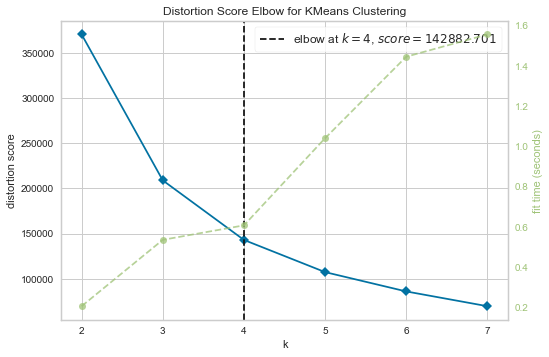

<Figure size 576x396 with 0 Axes>

In [157]:
kmax = 8
k_values = (2, kmax)

scaler = preprocessing.StandardScaler()
norm_data = scaler.fit_transform(gas_building_age[dl.gas_cols])

km = KMeansCluster(norm_data)
km.cluster(k_values)

path = images_path / Path("ensayos/clustering_por_edad_edificio/gas")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("elbow.svg"))

In [158]:
km_best = km.get_kmeans_of(4)
km_labels = km_best.labels_
km_centroids = scaler.inverse_transform(km_best.cluster_centers_)

np.unique(km_labels, return_counts=True)

(array([0, 1, 2, 3]), array([60314,     4,    33,   385], dtype=int64))

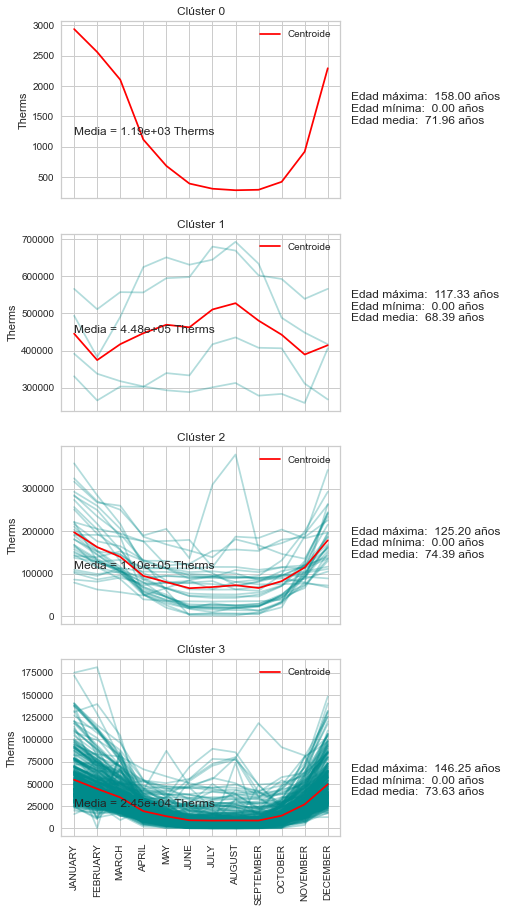

In [159]:
labels = pd.DataFrame(km_labels, columns=["label"])

k = km_centroids.shape[0]

f, axes = plt.subplots(k, 1, figsize=(5, 15), sharex=True)

for ki in range(k):
    cluster = gas_building_age.iloc[labels.query(f'label == {ki}').index][dl.gas_cols]
    
    palette={i:"darkcyan" for i in range(cluster.shape[0])}
    
    if len(cluster) < 10000:
        ax0 = sns.lineplot(data=cluster.values.T, ax=axes[ki], palette=palette, alpha=0.3)
        _ = [line.set_linestyle("-") for line in ax0.lines]
    
    ax0c = sns.lineplot(data=km_centroids[ki, :].T, ax=axes[ki], color="red")
    _ = [line.set_linestyle("-") for line in ax0c.lines]
    
    ax0c.legend(ax0c.lines[-1:], ["Centroide"]);
    
    axes[ki].set_title(f"Clúster {ki}")
    Media = km_centroids[ki, :].mean()
    axes[ki].text(0, Media, f"{Media = :0.2e} Therms")
    
    axes[ki].set_xticks([e for e in range(0, 12)])
    axes[ki].set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)
    axes[ki].set(ylabel="Therms")
    #print(f"Gráfica {ki} realizada")
    
    cluster_age = energy_building_age.iloc[labels.query(f'label == {ki}').index]["AVERAGE BUILDING AGE"]
    
    txt = f"Edad máxima: {cluster_age.max(): 0.2f} años\n" + \
          f"Edad mínima: {cluster_age.min(): 0.2f} años\n" + \
          f"Edad media: {cluster_age.mean(): 0.2f} años\n"
    axes[ki].text(12, Media, txt)

    
path = images_path / Path("ensayos/clustering_por_edad_edificio/gas")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("grafica.svg"))

In [160]:
comunities_by_cluster = {}

for nlab in range(k):
    com_index = np.where(labels==nlab)[0]
    com_list = []
    for c in gas_building_age.values[com_index][:,1:5]:
        com_list.append(c)
    comunities_by_cluster[nlab] = com_list

for k in sorted(comunities_by_cluster, key=lambda k: len(comunities_by_cluster[k])):
    print(f"Al clúster {k} pertenecen las comunidades:")
    for e in comunities_by_cluster[k]:
        print("\t", e)

Al clúster 1 pertenecen las comunidades:
	 ['Gage Park' 170316301001001.0 'Commercial' 'Commercial']
	 ['Loop' 170313201002034.0 'Commercial' 'Commercial']
	 ['Near West Side' 170312809001005.0 'Commercial' 'Commercial']
	 ['Portage Park' 170311502002002.0 'Commercial' 'Municipal']
Al clúster 2 pertenecen las comunidades:
	 ['Bridgeport' 170318399002006.0 'Commercial' 'Commercial']
	 ['Hermosa' 170312002002000.0 'Commercial' 'Commercial']
	 ['Austin' 170318314001022.0 'Commercial' 'Commercial']
	 ['Belmont Cragin' 170311913012018.0 'Commercial' 'Commercial']
	 ['Edgewater' 170310307022001.0 'Commercial' 'Multi 7+']
	 ['Humboldt Park' 170312306006009.0 'Commercial' 'Commercial']
	 ['Kenwood' 170313907003006.0 'Commercial' 'Multi 7+']
	 ['Lakeview' 170310609004001.0 'Commercial' 'Multi 7+']
	 ['Loop' 170313201002014.0 'Commercial' 'Commercial']
	 ['Loop' 170313201002016.0 'Commercial' 'Commercial']
	 ['Loop' 170313201002032.0 'Commercial' 'Commercial']
	 ['Loop' 170313201003008.0 'Commer

	 ['Albany Park' 170311403021008.0 'Residential' 'Multi < 7']
	 ['Albany Park' 170311403022000.0 'Residential' 'Single Family']
	 ['Albany Park' 170311403022001.0 'Commercial' 'Commercial']
	 ['Albany Park' 170311403022001.0 'Residential' 'Multi < 7']
	 ['Albany Park' 170311403022002.0 'Residential' 'Multi < 7']
	 ['Albany Park' 170311403022002.0 'Residential' 'Single Family']
	 ['Albany Park' 170311403022003.0 'Residential' 'Multi < 7']
	 ['Albany Park' 170311403022003.0 'Residential' 'Single Family']
	 ['Albany Park' 170311403022004.0 'Residential' 'Single Family']
	 ['Albany Park' 170311403022006.0 'Residential' 'Single Family']
	 ['Albany Park' 170311403022007.0 'Residential' 'Multi < 7']
	 ['Albany Park' 170311403022007.0 'Residential' 'Single Family']
	 ['Albany Park' 170311403022008.0 'Residential' 'Single Family']
	 ['Albany Park' 170311403022009.0 'Commercial' 'Commercial']
	 ['Albany Park' 170311403022009.0 'Residential' 'Multi < 7']
	 ['Albany Park' 170311403022010.0 'Reside

	 ['Archer Heights' 170315703004011.0 'Commercial' 'Multi < 7']
	 ['Archer Heights' 170315703004011.0 'Residential' 'Multi < 7']
	 ['Archer Heights' 170315703004011.0 'Residential' 'Single Family']
	 ['Archer Heights' 170315703004012.0 'Residential' 'Multi < 7']
	 ['Archer Heights' 170315703004012.0 'Residential' 'Single Family']
	 ['Archer Heights' 170315703004013.0 'Residential' 'Multi < 7']
	 ['Archer Heights' 170315703004013.0 'Residential' 'Single Family']
	 ['Archer Heights' 170315703004014.0 'Residential' 'Multi < 7']
	 ['Archer Heights' 170315703004014.0 'Residential' 'Single Family']
	 ['Archer Heights' 170315703004015.0 'Residential' 'Multi < 7']
	 ['Archer Heights' 170315703004015.0 'Residential' 'Single Family']
	 ['Archer Heights' 170315703004016.0 'Residential' 'Multi < 7']
	 ['Archer Heights' 170315703004016.0 'Residential' 'Single Family']
	 ['Archer Heights' 170315703004017.0 'Residential' 'Multi < 7']
	 ['Archer Heights' 170315703004017.0 'Residential' 'Single Family'

	 ['Auburn Gresham' 170317102003003.0 'Residential' 'Single Family']
	 ['Auburn Gresham' 170317102003004.0 'Residential' 'Multi 7+']
	 ['Auburn Gresham' 170317102003004.0 'Residential' 'Single Family']
	 ['Auburn Gresham' 170317102003005.0 'Residential' 'Single Family']
	 ['Auburn Gresham' 170317102003006.0 'Residential' 'Multi < 7']
	 ['Auburn Gresham' 170317102003012.0 'Commercial' 'Multi < 7']
	 ['Auburn Gresham' 170317102003006.0 'Residential' 'Single Family']
	 ['Auburn Gresham' 170317102003007.0 'Commercial' 'Multi < 7']
	 ['Auburn Gresham' 170317102003007.0 'Residential' 'Multi < 7']
	 ['Auburn Gresham' 170317102003007.0 'Residential' 'Single Family']
	 ['Auburn Gresham' 170317102003008.0 'Residential' 'Single Family']
	 ['Auburn Gresham' 170317102003009.0 'Commercial' 'Multi < 7']
	 ['Auburn Gresham' 170317102003009.0 'Residential' 'Multi < 7']
	 ['Auburn Gresham' 170317102003009.0 'Residential' 'Single Family']
	 ['Auburn Gresham' 170317102003010.0 'Commercial' 'Multi < 7']
	 

	 ['Auburn Gresham' 170317115002039.0 'Residential' 'Single Family']
	 ['Auburn Gresham' 170317115002040.0 'Residential' 'Multi < 7']
	 ['Auburn Gresham' 170317115002040.0 'Residential' 'Single Family']
	 ['Auburn Gresham' 170318399003010.0 'Commercial' 'Commercial']
	 ['Austin' 170312502002013.0 'Commercial' 'Multi < 7']
	 ['Austin' 170311912002003.0 'Residential' 'Multi < 7']
	 ['Austin' 170311912002003.0 'Residential' 'Single Family']
	 ['Austin' 170312502001002.0 'Commercial' 'Commercial']
	 ['Austin' 170312502001004.0 'Residential' 'Single Family']
	 ['Austin' 170312502001012.0 'Residential' 'Multi < 7']
	 ['Austin' 170312502001005.0 'Commercial' 'Commercial']
	 ['Austin' 170312502001007.0 'Residential' 'Multi < 7']
	 ['Austin' 170312502001007.0 'Residential' 'Single Family']
	 ['Austin' 170312502001008.0 'Residential' 'Multi < 7']
	 ['Austin' 170312502001008.0 'Residential' 'Single Family']
	 ['Austin' 170312502001009.0 'Commercial' 'Multi < 7']
	 ['Austin' 170312502001009.0 'Res

	 ['Austin' 170312513005001.0 'Residential' 'Single Family']
	 ['Austin' 170312513005002.0 'Residential' 'Multi < 7']
	 ['Austin' 170312513005002.0 'Residential' 'Single Family']
	 ['Austin' 170312513005003.0 'Commercial' 'Commercial']
	 ['Austin' 170312513005003.0 'Commercial' 'Multi 7+']
	 ['Austin' 170312513005003.0 'Residential' 'Multi < 7']
	 ['Austin' 170312513005003.0 'Residential' 'Single Family']
	 ['Austin' 170312513005004.0 'Residential' 'Multi 7+']
	 ['Austin' 170312513005004.0 'Residential' 'Multi < 7']
	 ['Austin' 170312513005004.0 'Residential' 'Single Family']
	 ['Austin' 170312513005005.0 'Residential' 'Multi < 7']
	 ['Austin' 170312513005005.0 'Residential' 'Single Family']
	 ['Austin' 170312513005006.0 'Commercial' 'Multi 7+']
	 ['Austin' 170312513005006.0 'Residential' 'Multi < 7']
	 ['Austin' 170312513005006.0 'Residential' 'Single Family']
	 ['Austin' 170312513005007.0 'Residential' 'Single Family']
	 ['Austin' 170312513005008.0 'Commercial' 'Multi < 7']
	 ['Austi

	 ['Avalon Park' 170314503001031.0 'Residential' 'Single Family']
	 ['Avalon Park' 170314503001033.0 'Residential' 'Single Family']
	 ['Avalon Park' 170314503001045.0 'Residential' 'Multi < 7']
	 ['Avalon Park' 170314503001034.0 'Commercial' 'Commercial']
	 ['Avalon Park' 170314503001034.0 'Residential' 'Multi < 7']
	 ['Avalon Park' 170314503001034.0 'Residential' 'Single Family']
	 ['Avalon Park' 170314503001035.0 'Residential' 'Single Family']
	 ['Avalon Park' 170314503001036.0 'Residential' 'Multi < 7']
	 ['Avalon Park' 170314503001036.0 'Residential' 'Single Family']
	 ['Avalon Park' 170314503001037.0 'Commercial' 'Commercial']
	 ['Avalon Park' 170314503001040.0 'Residential' 'Multi < 7']
	 ['Avalon Park' 170314503001041.0 'Residential' 'Multi < 7']
	 ['Avalon Park' 170314503001041.0 'Residential' 'Single Family']
	 ['Avalon Park' 170314503001042.0 'Residential' 'Multi < 7']
	 ['Avalon Park' 170314503001042.0 'Residential' 'Single Family']
	 ['Avalon Park' 170314503001043.0 'Reside

	 ['Belmont Cragin' 170311902001012.0 'Residential' 'Multi < 7']
	 ['Belmont Cragin' 170311902001012.0 'Residential' 'Single Family']
	 ['Belmont Cragin' 170311902001013.0 'Residential' 'Single Family']
	 ['Belmont Cragin' 170311902001014.0 'Residential' 'Multi < 7']
	 ['Belmont Cragin' 170311902001014.0 'Residential' 'Single Family']
	 ['Belmont Cragin' 170311902001015.0 'Residential' 'Multi < 7']
	 ['Belmont Cragin' 170311902001016.0 'Commercial' 'Multi < 7']
	 ['Belmont Cragin' 170311902002000.0 'Commercial' 'Multi < 7']
	 ['Belmont Cragin' 170311902002000.0 'Residential' 'Multi < 7']
	 ['Belmont Cragin' 170311902002001.0 'Residential' 'Multi < 7']
	 ['Belmont Cragin' 170311902002002.0 'Residential' 'Multi < 7']
	 ['Belmont Cragin' 170311902002002.0 'Residential' 'Single Family']
	 ['Belmont Cragin' 170311902002003.0 'Residential' 'Single Family']
	 ['Belmont Cragin' 170311902002004.0 'Residential' 'Multi < 7']
	 ['Belmont Cragin' 170311902002004.0 'Residential' 'Single Family']
	 [

	 ['Belmont Cragin' 170311911003009.0 'Residential' 'Multi 7+']
	 ['Belmont Cragin' 170311911003010.0 'Residential' 'Multi < 7']
	 ['Belmont Cragin' 170311911003011.0 'Commercial' 'Commercial']
	 ['Belmont Cragin' 170311911003011.0 'Residential' 'Multi < 7']
	 ['Belmont Cragin' 170311911003012.0 'Commercial' 'Commercial']
	 ['Belmont Cragin' 170311911003012.0 'Residential' 'Multi < 7']
	 ['Belmont Cragin' 170311911003012.0 'Residential' 'Single Family']
	 ['Belmont Cragin' 170311911004000.0 'Commercial' 'Commercial']
	 ['Belmont Cragin' 170311911004000.0 'Residential' 'Multi < 7']
	 ['Belmont Cragin' 170311911004000.0 'Residential' 'Single Family']
	 ['Belmont Cragin' 170311911004001.0 'Commercial' 'Multi < 7']
	 ['Belmont Cragin' 170311911004001.0 'Residential' 'Multi < 7']
	 ['Belmont Cragin' 170311911004001.0 'Residential' 'Single Family']
	 ['Belmont Cragin' 170311911004002.0 'Residential' 'Multi 7+']
	 ['Belmont Cragin' 170311911004002.0 'Residential' 'Multi < 7']
	 ['Belmont Crag

	 ['Bridgeport' 170318397002011.0 'Residential' 'Multi < 7']
	 ['Bridgeport' 170318397002011.0 'Residential' 'Single Family']
	 ['Bridgeport' 170318397002012.0 'Residential' 'Multi < 7']
	 ['Bridgeport' 170318397002013.0 'Commercial' 'Multi < 7']
	 ['Bridgeport' 170318397002013.0 'Residential' 'Multi < 7']
	 ['Bridgeport' 170318397002013.0 'Residential' 'Single Family']
	 ['Bridgeport' 170318397002014.0 'Residential' 'Multi < 7']
	 ['Bridgeport' 170318397002014.0 'Residential' 'Single Family']
	 ['Bridgeport' 170318397002015.0 'Commercial' 'Multi < 7']
	 ['Bridgeport' 170318397002015.0 'Residential' 'Multi < 7']
	 ['Bridgeport' 170318397002017.0 'Commercial' 'Commercial']
	 ['Bridgeport' 170318397002018.0 'Commercial' 'Multi < 7']
	 ['Bridgeport' 170318397002018.0 'Residential' 'Multi < 7']
	 ['Bridgeport' 170318397002018.0 'Residential' 'Single Family']
	 ['Bridgeport' 170318397002019.0 'Residential' 'Multi < 7']
	 ['Bridgeport' 170318397002019.0 'Residential' 'Single Family']
	 ['Bri

	 ['Brighton Park' 170318428004003.0 'Residential' 'Multi < 7']
	 ['Brighton Park' 170318428004003.0 'Residential' 'Single Family']
	 ['Brighton Park' 170318428004004.0 'Commercial' 'Commercial']
	 ['Brighton Park' 170318428004004.0 'Residential' 'Multi < 7']
	 ['Brighton Park' 170318428004004.0 'Residential' 'Single Family']
	 ['Brighton Park' 170318428004005.0 'Commercial' 'Commercial']
	 ['Brighton Park' 170318428004005.0 'Residential' 'Multi < 7']
	 ['Brighton Park' 170318428004006.0 'Commercial' 'Commercial']
	 ['Brighton Park' 170318428004006.0 'Commercial' 'Multi < 7']
	 ['Brighton Park' 170318428004006.0 'Residential' 'Single Family']
	 ['Brighton Park' 170318428004007.0 'Residential' 'Multi < 7']
	 ['Brighton Park' 170318428004007.0 'Residential' 'Single Family']
	 ['Brighton Park' 170318428004009.0 'Residential' 'Multi < 7']
	 ['Brighton Park' 170318428004009.0 'Residential' 'Single Family']
	 ['Brighton Park' 170318428004010.0 'Residential' 'Multi < 7']
	 ['Brighton Park' 17

	 ['Chicago Lawn' 170316603011004.0 'Residential' 'Single Family']
	 ['Chicago Lawn' 170316603011005.0 'Commercial' 'Multi 7+']
	 ['Chicago Lawn' 170316603011005.0 'Residential' 'Single Family']
	 ['Chicago Lawn' 170316603011006.0 'Residential' 'Multi < 7']
	 ['Chicago Lawn' 170316603011006.0 'Residential' 'Single Family']
	 ['Chicago Lawn' 170316603011007.0 'Commercial' 'Multi < 7']
	 ['Chicago Lawn' 170316603011007.0 'Residential' 'Multi < 7']
	 ['Chicago Lawn' 170316603011007.0 'Residential' 'Single Family']
	 ['Chicago Lawn' 170316603011008.0 'Residential' 'Multi < 7']
	 ['Chicago Lawn' 170316603011008.0 'Residential' 'Single Family']
	 ['Chicago Lawn' 170316603011009.0 'Commercial' 'Multi < 7']
	 ['Chicago Lawn' 170316603011009.0 'Residential' 'Multi < 7']
	 ['Chicago Lawn' 170316603011009.0 'Residential' 'Single Family']
	 ['Chicago Lawn' 170316603011010.0 'Commercial' 'Multi < 7']
	 ['Chicago Lawn' 170316603011010.0 'Residential' 'Multi < 7']
	 ['Chicago Lawn' 170316603011010.0 

	 ['Chicago Lawn' 170318350003012.0 'Residential' 'Single Family']
	 ['Chicago Lawn' 170318350003013.0 'Residential' 'Multi < 7']
	 ['Chicago Lawn' 170318350003013.0 'Residential' 'Single Family']
	 ['Chicago Lawn' 170318350003015.0 'Residential' 'Single Family']
	 ['Chicago Lawn' 170318350003017.0 'Commercial' 'Commercial']
	 ['Chicago Lawn' 170318350003017.0 'Residential' 'Multi < 7']
	 ['Chicago Lawn' 170318350003017.0 'Residential' 'Single Family']
	 ['Chicago Lawn' 170318350004000.0 'Residential' 'Multi < 7']
	 ['Chicago Lawn' 170318350004000.0 'Residential' 'Single Family']
	 ['Chicago Lawn' 170318350004001.0 'Commercial' 'Multi < 7']
	 ['Chicago Lawn' 170318350004001.0 'Residential' 'Multi < 7']
	 ['Chicago Lawn' 170318350004001.0 'Residential' 'Single Family']
	 ['Chicago Lawn' 170318350004002.0 'Residential' 'Multi < 7']
	 ['Chicago Lawn' 170318350004002.0 'Residential' 'Single Family']
	 ['Chicago Lawn' 170318350004003.0 'Residential' 'Multi < 7']
	 ['Chicago Lawn' 1703183500

	 ['Dunning' 170311705004032.0 'Residential' 'Multi < 7']
	 ['Dunning' 170311705004032.0 'Residential' 'Single Family']
	 ['Dunning' 170311705004033.0 'Residential' 'Multi < 7']
	 ['Dunning' 170311706001001.0 'Residential' 'Single Family']
	 ['Dunning' 170311706001003.0 'Residential' 'Single Family']
	 ['Dunning' 170311706001004.0 'Residential' 'Single Family']
	 ['Dunning' 170311706001005.0 'Residential' 'Single Family']
	 ['Dunning' 170311706001006.0 'Residential' 'Single Family']
	 ['Dunning' 170311706001007.0 'Residential' 'Single Family']
	 ['Dunning' 170311706001008.0 'Residential' 'Single Family']
	 ['Dunning' 170311706001009.0 'Residential' 'Single Family']
	 ['Dunning' 170311706001010.0 'Residential' 'Single Family']
	 ['Dunning' 170311706001012.0 'Residential' 'Single Family']
	 ['Dunning' 170311706001013.0 'Residential' 'Single Family']
	 ['Dunning' 170311706001014.0 'Residential' 'Single Family']
	 ['Dunning' 170311706001015.0 'Residential' 'Single Family']
	 ['Dunning' 170

	 ['East Side' 170315204003001.0 'Commercial' 'Multi < 7']
	 ['East Side' 170315204003001.0 'Residential' 'Multi < 7']
	 ['East Side' 170315204003001.0 'Residential' 'Single Family']
	 ['East Side' 170315204003002.0 'Residential' 'Single Family']
	 ['East Side' 170315204003003.0 'Commercial' 'Commercial']
	 ['East Side' 170315204003004.0 'Residential' 'Multi < 7']
	 ['East Side' 170315204003004.0 'Residential' 'Single Family']
	 ['East Side' 170315204003005.0 'Residential' 'Multi < 7']
	 ['East Side' 170315204003005.0 'Residential' 'Single Family']
	 ['East Side' 170315204003006.0 'Residential' 'Multi < 7']
	 ['East Side' 170315204003006.0 'Residential' 'Single Family']
	 ['East Side' 170315204003007.0 'Residential' 'Single Family']
	 ['East Side' 170315204003008.0 'Residential' 'Multi < 7']
	 ['East Side' 170315204003008.0 'Residential' 'Single Family']
	 ['East Side' 170315204003009.0 'Residential' 'Single Family']
	 ['East Side' 170315204003010.0 'Residential' 'Multi < 7']
	 ['East 

	 ['Edison Park' 170310901003013.0 'Residential' 'Single Family']
	 ['Edison Park' 170310901003014.0 'Residential' 'Single Family']
	 ['Edison Park' 170310901003015.0 'Residential' 'Single Family']
	 ['Edison Park' 170310901003016.0 'Residential' 'Single Family']
	 ['Edison Park' 170310901003017.0 'Residential' 'Single Family']
	 ['Edison Park' 170310901003018.0 'Residential' 'Single Family']
	 ['Edison Park' 170310901003019.0 'Residential' 'Single Family']
	 ['Edison Park' 170310901003020.0 'Residential' 'Single Family']
	 ['Edison Park' 170310901003021.0 'Residential' 'Single Family']
	 ['Edison Park' 170310901004000.0 'Residential' 'Single Family']
	 ['Edison Park' 170310901004001.0 'Residential' 'Single Family']
	 ['Edison Park' 170310901004002.0 'Residential' 'Single Family']
	 ['Edison Park' 170310901004003.0 'Residential' 'Single Family']
	 ['Edison Park' 170310901004004.0 'Residential' 'Single Family']
	 ['Edison Park' 170310901004005.0 'Residential' 'Single Family']
	 ['Edison

	 ['Englewood' 170318348001016.0 'Residential' 'Multi < 7']
	 ['Englewood' 170318348001016.0 'Residential' 'Single Family']
	 ['Englewood' 170318348001017.0 'Residential' 'Multi < 7']
	 ['Englewood' 170318348001017.0 'Residential' 'Single Family']
	 ['Englewood' 170318348002000.0 'Residential' 'Single Family']
	 ['Englewood' 170318348002001.0 'Commercial' 'Multi < 7']
	 ['Englewood' 170318348002001.0 'Residential' 'Multi < 7']
	 ['Englewood' 170318348002002.0 'Commercial' 'Multi 7+']
	 ['Englewood' 170318348002002.0 'Residential' 'Single Family']
	 ['Englewood' 170318348002003.0 'Commercial' 'Multi < 7']
	 ['Englewood' 170318348002003.0 'Residential' 'Multi < 7']
	 ['Englewood' 170318348002003.0 'Residential' 'Single Family']
	 ['Near West Side' 170312828001013.0 'Commercial' 'Multi < 7']
	 ['Englewood' 170318348002004.0 'Commercial' 'Multi < 7']
	 ['Englewood' 170318348002004.0 'Residential' 'Multi < 7']
	 ['Englewood' 170318348002004.0 'Residential' 'Single Family']
	 ['Englewood' 17

	 ['Gage Park' 170316309003019.0 'Residential' 'Single Family']
	 ['Gage Park' 170316309003020.0 'Residential' 'Multi < 7']
	 ['Gage Park' 170316309003020.0 'Residential' 'Single Family']
	 ['Gage Park' 170316309003021.0 'Residential' 'Single Family']
	 ['Gage Park' 170316309003022.0 'Residential' 'Multi < 7']
	 ['Gage Park' 170316309003022.0 'Residential' 'Single Family']
	 ['Gage Park' 170318351001006.0 'Commercial' 'Multi < 7']
	 ['Gage Park' 170318351001006.0 'Residential' 'Multi < 7']
	 ['Gage Park' 170318351001006.0 'Residential' 'Single Family']
	 ['Gage Park' 170318351001007.0 'Residential' 'Multi < 7']
	 ['Gage Park' 170318351001007.0 'Residential' 'Single Family']
	 ['Gage Park' 170318351001008.0 'Commercial' 'Commercial']
	 ['Gage Park' 170318351001008.0 'Residential' 'Multi < 7']
	 ['Gage Park' 170318351001008.0 'Residential' 'Single Family']
	 ['Gage Park' 170318351001013.0 'Residential' 'Multi < 7']
	 ['Gage Park' 170318351001015.0 'Commercial' 'Commercial']
	 ['Gage Park

	 ['Grand Boulevard' 170313802002011.0 'Residential' 'Multi < 7']
	 ['Grand Boulevard' 170313802002011.0 'Residential' 'Single Family']
	 ['Grand Boulevard' 170313807001003.0 'Residential' 'Multi < 7']
	 ['Grand Boulevard' 170313802002013.0 'Commercial' 'Commercial']
	 ['Grand Boulevard' 170313802002013.0 'Residential' 'Multi < 7']
	 ['Grand Boulevard' 170313802002013.0 'Residential' 'Single Family']
	 ['Grand Boulevard' 170313802002015.0 'Commercial' 'Commercial']
	 ['Grand Boulevard' 170313807001000.0 'Commercial' 'Multi < 7']
	 ['Grand Boulevard' 170313807001000.0 'Residential' 'Multi < 7']
	 ['Grand Boulevard' 170313807001001.0 'Residential' 'Multi 7+']
	 ['Grand Boulevard' 170313807001001.0 'Residential' 'Multi < 7']
	 ['Grand Boulevard' 170313807001002.0 'Commercial' 'Commercial']
	 ['Grand Boulevard' 170313807001002.0 'Commercial' 'Multi < 7']
	 ['Grand Boulevard' 170313807001002.0 'Residential' 'Multi < 7']
	 ['Grand Boulevard' 170313807001002.0 'Residential' 'Single Family']
	

	 ['Greater Grand Crossing' 170318418002018.0 'Residential' 'Single Family']
	 ['Greater Grand Crossing' 170318418002019.0 'Commercial' 'Multi < 7']
	 ['Greater Grand Crossing' 170318418002019.0 'Residential' 'Multi < 7']
	 ['Greater Grand Crossing' 170318418002019.0 'Residential' 'Single Family']
	 ['Greater Grand Crossing' 170318418002020.0 'Residential' 'Multi < 7']
	 ['Greater Grand Crossing' 170318418002020.0 'Residential' 'Single Family']
	 ['Greater Grand Crossing' 170318418002021.0 'Residential' 'Multi < 7']
	 ['Greater Grand Crossing' 170318418002021.0 'Residential' 'Single Family']
	 ['Greater Grand Crossing' 170318425001038.0 'Residential' 'Multi 7+']
	 ['Greater Grand Crossing' 170318418002022.0 'Commercial' 'Multi < 7']
	 ['Hegewisch' 170315501002018.0 'Residential' 'Single Family']
	 ['Greater Grand Crossing' 170318418002022.0 'Residential' 'Multi 7+']
	 ['Greater Grand Crossing' 170318418002022.0 'Residential' 'Multi < 7']
	 ['Greater Grand Crossing' 170318418002023.0 'R

	 ['Humboldt Park' 170312307001010.0 'Residential' 'Multi < 7']
	 ['Humboldt Park' 170312307001010.0 'Residential' 'Single Family']
	 ['Humboldt Park' 170312307001011.0 'Residential' 'Multi < 7']
	 ['Humboldt Park' 170312307001011.0 'Residential' 'Single Family']
	 ['Humboldt Park' 170312307001018.0 'Residential' 'Single Family']
	 ['Humboldt Park' 170312307001012.0 'Residential' 'Multi < 7']
	 ['Humboldt Park' 170312307001012.0 'Residential' 'Single Family']
	 ['Humboldt Park' 170312307001013.0 'Residential' 'Multi < 7']
	 ['Humboldt Park' 170312307001013.0 'Residential' 'Single Family']
	 ['Humboldt Park' 170312307001014.0 'Residential' 'Multi < 7']
	 ['Humboldt Park' 170312307001014.0 'Residential' 'Single Family']
	 ['Humboldt Park' 170312307001015.0 'Residential' 'Multi < 7']
	 ['Humboldt Park' 170312307001015.0 'Residential' 'Single Family']
	 ['Humboldt Park' 170312307001016.0 'Residential' 'Multi < 7']
	 ['Humboldt Park' 170312307001016.0 'Residential' 'Single Family']
	 ['Humb

	 ['Hyde Park' 170318362001013.0 'Residential' 'Single Family']
	 ['Hyde Park' 170318362001014.0 'Residential' 'Single Family']
	 ['Hyde Park' 170318362001015.0 'Residential' 'Multi < 7']
	 ['Hyde Park' 170318362001015.0 'Residential' 'Single Family']
	 ['Hyde Park' 170318362001016.0 'Commercial' 'Commercial']
	 ['Hyde Park' 170318362001023.0 'Residential' 'Multi < 7']
	 ['Hyde Park' 170318363001001.0 'Commercial' 'Commercial']
	 ['Hyde Park' 170318363001001.0 'Residential' 'Multi 7+']
	 ['Hyde Park' 170318363001002.0 'Residential' 'Multi < 7']
	 ['Hyde Park' 170318363001005.0 'Residential' 'Multi < 7']
	 ['Hyde Park' 170318363002001.0 'Commercial' 'Commercial']
	 ['Hyde Park' 170318363002001.0 'Residential' 'Multi 7+']
	 ['Hyde Park' 170318363002002.0 'Residential' 'Multi < 7']
	 ['Irving Park' 170311601001002.0 'Commercial' 'Commercial']
	 ['Hyde Park' 170318363002003.0 'Residential' 'Multi < 7']
	 ['Hyde Park' 170318363002005.0 'Commercial' 'Multi 7+']
	 ['Hyde Park' 170318363002005

	 ['Irving Park' 170311610001005.0 'Residential' 'Multi < 7']
	 ['Irving Park' 170311610001005.0 'Residential' 'Single Family']
	 ['Irving Park' 170311610001006.0 'Commercial' 'Commercial']
	 ['Irving Park' 170311610001006.0 'Residential' 'Multi 7+']
	 ['Irving Park' 170311610001006.0 'Residential' 'Single Family']
	 ['Irving Park' 170311610001007.0 'Commercial' 'Multi 7+']
	 ['Irving Park' 170311610001007.0 'Residential' 'Multi < 7']
	 ['Jefferson Park' 170311102002013.0 'Residential' 'Multi < 7']
	 ['Irving Park' 170311610001007.0 'Residential' 'Single Family']
	 ['Irving Park' 170311610001008.0 'Residential' 'Multi < 7']
	 ['Irving Park' 170311610001008.0 'Residential' 'Single Family']
	 ['Irving Park' 170311610001009.0 'Residential' 'Single Family']
	 ['Irving Park' 170311610001010.0 'Commercial' 'Commercial']
	 ['Irving Park' 170311610001010.0 'Residential' 'Multi < 7']
	 ['Irving Park' 170311610001010.0 'Residential' 'Single Family']
	 ['Irving Park' 170311610001011.0 'Residentia

	 ['Kenwood' 170313905001003.0 'Residential' 'Single Family']
	 ['Kenwood' 170313907002008.0 'Commercial' 'Multi 7+']
	 ['Kenwood' 170313905001004.0 'Residential' 'Single Family']
	 ['Kenwood' 170313905001006.0 'Residential' 'Single Family']
	 ['Kenwood' 170313905001007.0 'Residential' 'Single Family']
	 ['Kenwood' 170313905001008.0 'Commercial' 'Commercial']
	 ['Kenwood' 170313905001008.0 'Residential' 'Multi < 7']
	 ['Kenwood' 170313905001009.0 'Commercial' 'Commercial']
	 ['Kenwood' 170313905001009.0 'Commercial' 'Multi 7+']
	 ['Kenwood' 170313905001009.0 'Residential' 'Multi 7+']
	 ['Kenwood' 170313905001009.0 'Residential' 'Multi < 7']
	 ['Kenwood' 170313907002008.0 'Commercial' 'Multi < 7']
	 ['Kenwood' 170313906001000.0 'Commercial' 'Commercial']
	 ['Kenwood' 170313906001000.0 'Residential' 'Multi < 7']
	 ['Kenwood' 170313906001000.0 'Residential' 'Single Family']
	 ['Kenwood' 170313906001003.0 'Commercial' 'Commercial']
	 ['Kenwood' 170313906001005.0 'Commercial' 'Commercial']


	 ['Lakeview' 170310628003007.0 'Residential' 'Single Family']
	 ['Lakeview' 170310628003008.0 'Residential' 'Multi < 7']
	 ['Lakeview' 170310628003008.0 'Residential' 'Single Family']
	 ['Lakeview' 170310628003009.0 'Commercial' 'Multi < 7']
	 ['Lakeview' 170310628003009.0 'Residential' 'Multi < 7']
	 ['Lakeview' 170310628003009.0 'Residential' 'Single Family']
	 ['Lakeview' 170310628003010.0 'Commercial' 'Multi < 7']
	 ['Lakeview' 170310628003010.0 'Residential' 'Multi < 7']
	 ['Lakeview' 170310628003010.0 'Residential' 'Single Family']
	 ['Lakeview' 170310628003011.0 'Residential' 'Multi 7+']
	 ['Lakeview' 170310628003011.0 'Residential' 'Multi < 7']
	 ['Lakeview' 170310628003011.0 'Residential' 'Single Family']
	 ['Lakeview' 170310628003012.0 'Commercial' 'Commercial']
	 ['Lakeview' 170310628003012.0 'Residential' 'Multi < 7']
	 ['Lakeview' 170310628003012.0 'Residential' 'Single Family']
	 ['Lakeview' 170310628003013.0 'Commercial' 'Commercial']
	 ['Lakeview' 170310628003013.0 'Co

	 ['Lincoln Park' 170310710002002.0 'Commercial' 'Commercial']
	 ['Lincoln Park' 170310710002021.0 'Commercial' 'Commercial']
	 ['Lincoln Park' 170310710002002.0 'Commercial' 'Multi < 7']
	 ['Lincoln Park' 170310710002002.0 'Residential' 'Multi < 7']
	 ['Lincoln Park' 170310710002003.0 'Commercial' 'Commercial']
	 ['Lincoln Park' 170310710002003.0 'Commercial' 'Multi < 7']
	 ['Lincoln Park' 170310710002003.0 'Residential' 'Multi < 7']
	 ['Lincoln Park' 170310710002004.0 'Commercial' 'Multi < 7']
	 ['Lincoln Park' 170310710002004.0 'Residential' 'Multi < 7']
	 ['Lincoln Park' 170310710002004.0 'Residential' 'Single Family']
	 ['Lincoln Park' 170310710002005.0 'Residential' 'Multi < 7']
	 ['Lincoln Park' 170310710002006.0 'Commercial' 'Multi 7+']
	 ['Lincoln Park' 170310710002006.0 'Commercial' 'Multi < 7']
	 ['Lincoln Park' 170310710002006.0 'Residential' 'Multi < 7']
	 ['Lincoln Park' 170310710002006.0 'Residential' 'Single Family']
	 ['Lincoln Park' 170310710002007.0 'Commercial' 'Mul

	 ['Lincoln Square' 170310402024014.0 'Commercial' 'Multi 7+']
	 ['Lincoln Square' 170310402024014.0 'Residential' 'Multi < 7']
	 ['Lincoln Square' 170310402024014.0 'Residential' 'Single Family']
	 ['Lincoln Square' 170310402024015.0 'Commercial' 'Commercial']
	 ['Lincoln Square' 170310402024015.0 'Commercial' 'Multi < 7']
	 ['Lincoln Square' 170310402024017.0 'Commercial' 'Commercial']
	 ['Lincoln Square' 170310402024017.0 'Residential' 'Multi < 7']
	 ['Lincoln Square' 170310402024017.0 'Residential' 'Single Family']
	 ['Lincoln Square' 170310402024018.0 'Commercial' 'Multi < 7']
	 ['Lincoln Square' 170310402024018.0 'Residential' 'Multi < 7']
	 ['Lincoln Square' 170310403001000.0 'Residential' 'Single Family']
	 ['Lincoln Square' 170310403001001.0 'Residential' 'Single Family']
	 ['Lincoln Square' 170310403001002.0 'Residential' 'Single Family']
	 ['Lincoln Square' 170310403001003.0 'Residential' 'Single Family']
	 ['Lincoln Square' 170310403001004.0 'Residential' 'Single Family']
	

	 ['Logan Square' 170312215002001.0 'Residential' 'Multi < 7']
	 ['Logan Square' 170312216002024.0 'Commercial' 'Multi < 7']
	 ['Logan Square' 170312215002007.0 'Residential' 'Multi < 7']
	 ['Logan Square' 170312215002008.0 'Residential' 'Multi 7+']
	 ['Logan Square' 170312215002010.0 'Residential' 'Multi < 7']
	 ['Logan Square' 170312215002017.0 'Residential' 'Multi < 7']
	 ['Logan Square' 170312215002020.0 'Residential' 'Multi < 7']
	 ['Logan Square' 170318309003002.0 'Commercial' 'Multi < 7']
	 ['Logan Square' 170312215002022.0 'Residential' 'Multi < 7']
	 ['Logan Square' 170312216001002.0 'Residential' 'Multi < 7']
	 ['Logan Square' 170312216001003.0 'Residential' 'Multi < 7']
	 ['Logan Square' 170312216001004.0 'Residential' 'Multi < 7']
	 ['Logan Square' 170312216001005.0 'Residential' 'Multi < 7']
	 ['Logan Square' 170312216001006.0 'Residential' 'Multi < 7']
	 ['Logan Square' 170312216001006.0 'Residential' 'Single Family']
	 ['Logan Square' 170312216001007.0 'Residential' 'Mul

	 ['Lower West Side' 170313109002002.0 'Commercial' 'Multi < 7']
	 ['Lower West Side' 170313109002002.0 'Residential' 'Multi < 7']
	 ['Lower West Side' 170313109002003.0 'Residential' 'Multi < 7']
	 ['Lower West Side' 170313109002003.0 'Residential' 'Single Family']
	 ['Lower West Side' 170313109002004.0 'Commercial' 'Multi < 7']
	 ['Lower West Side' 170313109002004.0 'Residential' 'Multi < 7']
	 ['Lower West Side' 170313109002004.0 'Residential' 'Single Family']
	 ['Lower West Side' 170313109002005.0 'Residential' 'Multi < 7']
	 ['Lower West Side' 170313109002005.0 'Residential' 'Single Family']
	 ['Lower West Side' 170313109002006.0 'Commercial' 'Multi < 7']
	 ['Lower West Side' 170313109002006.0 'Residential' 'Multi < 7']
	 ['Lower West Side' 170313109002006.0 'Residential' 'Single Family']
	 ['Lower West Side' 170313109003002.0 'Residential' 'Single Family']
	 ['Lower West Side' 170313109002007.0 'Commercial' 'Commercial']
	 ['Lower West Side' 170313109002007.0 'Residential' 'Multi

	 ['Morgan Park' 170317504001019.0 'Residential' 'Single Family']
	 ['Morgan Park' 170317504001020.0 'Residential' 'Single Family']
	 ['Morgan Park' 170317504001021.0 'Residential' 'Single Family']
	 ['Morgan Park' 170317504001022.0 'Residential' 'Single Family']
	 ['Morgan Park' 170317504001023.0 'Residential' 'Single Family']
	 ['Morgan Park' 170317504001024.0 'Residential' 'Single Family']
	 ['Morgan Park' 170317504001025.0 'Residential' 'Single Family']
	 ['Morgan Park' 170317504001026.0 'Residential' 'Single Family']
	 ['Morgan Park' 170317504001028.0 'Residential' 'Single Family']
	 ['Morgan Park' 170317504001029.0 'Residential' 'Single Family']
	 ['Morgan Park' 170317504001030.0 'Residential' 'Single Family']
	 ['Morgan Park' 170317504001031.0 'Residential' 'Single Family']
	 ['Morgan Park' 170317504001032.0 'Commercial' 'Commercial']
	 ['Morgan Park' 170317504001032.0 'Residential' 'Single Family']
	 ['Morgan Park' 170317504001036.0 'Residential' 'Single Family']
	 ['Morgan Par

	 ['Near North Side' 170318383002000.0 'Commercial' 'Multi < 7']
	 ['Near North Side' 170318383002000.0 'Residential' 'Multi < 7']
	 ['Near North Side' 170318422001014.0 'Commercial' 'Commercial']
	 ['Near North Side' 170318383002001.0 'Commercial' 'Commercial']
	 ['Near South Side' 170313301003008.0 'Residential' 'Single Family']
	 ['Near North Side' 170318383002005.0 'Commercial' 'Multi < 7']
	 ['Near North Side' 170318383002007.0 'Commercial' 'Commercial']
	 ['Near North Side' 170318383002012.0 'Commercial' 'Commercial']
	 ['Near North Side' 170318422001000.0 'Commercial' 'Commercial']
	 ['Rogers Park' 170310107012016.0 'Commercial' 'Commercial']
	 ['Near North Side' 170318422001003.0 'Residential' 'Single Family']
	 ['Near North Side' 170318422001007.0 'Commercial' 'Commercial']
	 ['Near North Side' 170318422001010.0 'Commercial' 'Commercial']
	 ['Near North Side' 170318422001011.0 'Commercial' 'Commercial']
	 ['Near North Side' 170318422001014.0 'Commercial' 'Multi 7+']
	 ['Near N

	 ['New City' 170316110001016.0 'Residential' 'Single Family']
	 ['New City' 170316110001017.0 'Residential' 'Multi < 7']
	 ['New City' 170316110001017.0 'Residential' 'Single Family']
	 ['New City' 170316110001019.0 'Residential' 'Single Family']
	 ['New City' 170316110001020.0 'Residential' 'Multi < 7']
	 ['New City' 170316110001020.0 'Residential' 'Single Family']
	 ['New City' 170316110001021.0 'Residential' 'Multi < 7']
	 ['New City' 170316110001021.0 'Residential' 'Single Family']
	 ['New City' 170316110001022.0 'Residential' 'Multi < 7']
	 ['New City' 170316110001022.0 'Residential' 'Single Family']
	 ['New City' 170316110001023.0 'Residential' 'Multi < 7']
	 ['New City' 170316110001024.0 'Residential' 'Multi < 7']
	 ['New City' 170316110001024.0 'Residential' 'Single Family']
	 ['New City' 170316110001025.0 'Commercial' 'Multi 7+']
	 ['New City' 170316110001026.0 'Residential' 'Multi < 7']
	 ['New City' 170316110001026.0 'Residential' 'Single Family']
	 ['New City' 170316110001

	 ['North Center' 170310507001010.0 'Residential' 'Multi < 7']
	 ['North Center' 170310507001011.0 'Residential' 'Multi < 7']
	 ['North Center' 170310507001011.0 'Residential' 'Single Family']
	 ['North Center' 170310508001003.0 'Residential' 'Multi < 7']
	 ['North Center' 170310507001012.0 'Residential' 'Multi < 7']
	 ['North Center' 170310507001012.0 'Residential' 'Single Family']
	 ['North Center' 170310507001014.0 'Residential' 'Multi < 7']
	 ['North Center' 170310507001014.0 'Residential' 'Single Family']
	 ['North Center' 170310507001015.0 'Commercial' 'Multi 7+']
	 ['North Center' 170310507001015.0 'Residential' 'Multi < 7']
	 ['North Center' 170310507001015.0 'Residential' 'Single Family']
	 ['North Center' 170310507001016.0 'Residential' 'Multi < 7']
	 ['North Center' 170310507001016.0 'Residential' 'Single Family']
	 ['North Center' 170310507001017.0 'Residential' 'Multi < 7']
	 ['North Center' 170310507001017.0 'Residential' 'Single Family']
	 ['North Center' 170310507001018

	 ['North Lawndale' 170318430002037.0 'Residential' 'Multi < 7']
	 ['North Lawndale' 170318430002038.0 'Commercial' 'Commercial']
	 ['North Lawndale' 170318431001015.0 'Residential' 'Multi < 7']
	 ['North Lawndale' 170318430002039.0 'Commercial' 'Commercial']
	 ['North Lawndale' 170318430002040.0 'Residential' 'Single Family']
	 ['North Lawndale' 170318430002043.0 'Residential' 'Single Family']
	 ['North Lawndale' 170318430002047.0 'Residential' 'Multi < 7']
	 ['North Lawndale' 170318430002047.0 'Residential' 'Single Family']
	 ['North Lawndale' 170318430002048.0 'Residential' 'Multi < 7']
	 ['North Lawndale' 170318430002048.0 'Residential' 'Single Family']
	 ['North Lawndale' 170318431001002.0 'Residential' 'Multi < 7']
	 ['North Lawndale' 170318431001002.0 'Residential' 'Single Family']
	 ['North Lawndale' 170318431001003.0 'Commercial' 'Multi < 7']
	 ['North Lawndale' 170318431001013.0 'Residential' 'Multi < 7']
	 ['North Lawndale' 170318431001014.0 'Commercial' 'Multi < 7']
	 ['Nor

	 ['Norwood Park' 170311004002002.0 'Residential' 'Single Family']
	 ['Norwood Park' 170311004002003.0 'Residential' 'Single Family']
	 ['Norwood Park' 170311004002004.0 'Residential' 'Single Family']
	 ['Norwood Park' 170311005002001.0 'Residential' 'Multi < 7']
	 ['Norwood Park' 170311004002005.0 'Residential' 'Single Family']
	 ['Norwood Park' 170311004002006.0 'Residential' 'Single Family']
	 ['Norwood Park' 170311004002007.0 'Residential' 'Single Family']
	 ['Norwood Park' 170311004002008.0 'Residential' 'Single Family']
	 ['Norwood Park' 170311005005029.0 'Residential' 'Multi < 7']
	 ['Norwood Park' 170311004002009.0 'Residential' 'Single Family']
	 ['Norwood Park' 170311004003000.0 'Residential' 'Single Family']
	 ['Norwood Park' 170311004003002.0 'Residential' 'Single Family']
	 ['Norwood Park' 170311004003003.0 'Residential' 'Single Family']
	 ['Norwood Park' 170311004003004.0 'Residential' 'Single Family']
	 ['Norwood Park' 170311004003005.0 'Residential' 'Single Family']
	 [

	 ['Portage Park' 170311504014004.0 'Commercial' 'Multi < 7']
	 ['Portage Park' 170311504014004.0 'Residential' 'Multi < 7']
	 ['Portage Park' 170311504014004.0 'Residential' 'Single Family']
	 ['Portage Park' 170311504014005.0 'Residential' 'Multi < 7']
	 ['Portage Park' 170311504014005.0 'Residential' 'Single Family']
	 ['Portage Park' 170311504014006.0 'Residential' 'Single Family']
	 ['Portage Park' 170311504014007.0 'Residential' 'Single Family']
	 ['Portage Park' 170311504014008.0 'Residential' 'Single Family']
	 ['Portage Park' 170311504014009.0 'Residential' 'Multi < 7']
	 ['Portage Park' 170311504014009.0 'Residential' 'Single Family']
	 ['Portage Park' 170311504014010.0 'Residential' 'Single Family']
	 ['Portage Park' 170311504014011.0 'Residential' 'Single Family']
	 ['Portage Park' 170311504014012.0 'Residential' 'Multi < 7']
	 ['Portage Park' 170311504014012.0 'Residential' 'Single Family']
	 ['Portage Park' 170311504014013.0 'Residential' 'Multi < 7']
	 ['Portage Park' 17

	 ['Pullman' 170315002002009.0 'Residential' 'Single Family']
	 ['Pullman' 170315002002011.0 'Residential' 'Multi < 7']
	 ['Pullman' 170315002002015.0 'Residential' 'Single Family']
	 ['Pullman' 170315002002016.0 'Residential' 'Multi < 7']
	 ['Pullman' 170315002002017.0 'Residential' 'Multi < 7']
	 ['Pullman' 170315002002017.0 'Residential' 'Single Family']
	 ['Pullman' 170315002002018.0 'Residential' 'Single Family']
	 ['Pullman' 170315002002020.0 'Residential' 'Single Family']
	 ['Pullman' 170315002002021.0 'Commercial' 'Commercial']
	 ['Pullman' 170315002002021.0 'Residential' 'Multi < 7']
	 ['Pullman' 170315002002021.0 'Residential' 'Single Family']
	 ['Pullman' 170315002002023.0 'Residential' 'Single Family']
	 ['Pullman' 170315003001001.0 'Commercial' 'Municipal']
	 ['Pullman' 170315003001005.0 'Residential' 'Multi < 7']
	 ['Pullman' 170315003001005.0 'Residential' 'Single Family']
	 ['Pullman' 170315003001007.0 'Residential' 'Multi < 7']
	 ['Pullman' 170315003001009.0 'Residenti

	 ['Roseland' 170314903002019.0 'Residential' 'Single Family']
	 ['Roseland' 170314903002020.0 'Residential' 'Multi < 7']
	 ['Roseland' 170314903002020.0 'Residential' 'Single Family']
	 ['Roseland' 170314903002021.0 'Residential' 'Single Family']
	 ['Roseland' 170314903002023.0 'Commercial' 'Multi < 7']
	 ['Roseland' 170314903002023.0 'Residential' 'Single Family']
	 ['Roseland' 170314903002024.0 'Residential' 'Multi < 7']
	 ['Roseland' 170314903002024.0 'Residential' 'Single Family']
	 ['Roseland' 170314903002025.0 'Residential' 'Single Family']
	 ['Roseland' 170314903002026.0 'Commercial' 'Commercial']
	 ['Roseland' 170314903002028.0 'Residential' 'Single Family']
	 ['Roseland' 170314904001000.0 'Residential' 'Multi < 7']
	 ['Roseland' 170314904001021.0 'Residential' 'Multi < 7']
	 ['Roseland' 170314904001000.0 'Residential' 'Single Family']
	 ['Roseland' 170314904001001.0 'Residential' 'Single Family']
	 ['Roseland' 170314908001021.0 'Residential' 'Multi < 7']
	 ['Roseland' 1703149

	 ['Roseland' 170314914003007.0 'Commercial' 'Multi < 7']
	 ['Roseland' 170314914003007.0 'Residential' 'Multi < 7']
	 ['Roseland' 170314914003007.0 'Residential' 'Single Family']
	 ['Roseland' 170314914003008.0 'Residential' 'Multi < 7']
	 ['Roseland' 170314914003008.0 'Residential' 'Single Family']
	 ['Roseland' 170314914003009.0 'Commercial' 'Commercial']
	 ['Roseland' 170314914003009.0 'Residential' 'Multi < 7']
	 ['Roseland' 170314914003009.0 'Residential' 'Single Family']
	 ['Roseland' 170314914003011.0 'Commercial' 'Multi < 7']
	 ['Roseland' 170314914003011.0 'Residential' 'Multi < 7']
	 ['Roseland' 170314914003011.0 'Residential' 'Single Family']
	 ['Roseland' 170314914003012.0 'Residential' 'Multi < 7']
	 ['Roseland' 170314914003012.0 'Residential' 'Single Family']
	 ['Roseland' 170314914003013.0 'Residential' 'Multi 7+']
	 ['Roseland' 170314914003013.0 'Residential' 'Multi < 7']
	 ['Roseland' 170314914003013.0 'Residential' 'Single Family']
	 ['Roseland' 170314914003014.0 'Re

	 ['South Deering' 170315102001012.0 'Residential' 'Single Family']
	 ['South Deering' 170315102001013.0 'Residential' 'Single Family']
	 ['South Deering' 170315102001014.0 'Residential' 'Single Family']
	 ['South Deering' 170315102001015.0 'Residential' 'Single Family']
	 ['South Deering' 170315102001016.0 'Commercial' 'Commercial']
	 ['South Deering' 170315102001016.0 'Residential' 'Single Family']
	 ['South Deering' 170315102002005.0 'Residential' 'Single Family']
	 ['South Deering' 170315102001017.0 'Commercial' 'Commercial']
	 ['South Deering' 170315102001018.0 'Residential' 'Single Family']
	 ['South Deering' 170315102001019.0 'Residential' 'Single Family']
	 ['South Deering' 170315102001020.0 'Residential' 'Single Family']
	 ['South Deering' 170315102001021.0 'Residential' 'Single Family']
	 ['South Deering' 170315102001022.0 'Residential' 'Single Family']
	 ['South Deering' 170315102001024.0 'Residential' 'Single Family']
	 ['South Deering' 170315102001025.0 'Residential' 'Mult

	 ['South Lawndale' 170318408001009.0 'Residential' 'Multi < 7']
	 ['South Lawndale' 170318408001009.0 'Residential' 'Single Family']
	 ['South Lawndale' 170318408001010.0 'Residential' 'Multi < 7']
	 ['South Lawndale' 170318408001010.0 'Residential' 'Single Family']
	 ['South Lawndale' 170318408001011.0 'Residential' 'Multi < 7']
	 ['South Lawndale' 170318408001011.0 'Residential' 'Single Family']
	 ['South Lawndale' 170318408001012.0 'Commercial' 'Commercial']
	 ['South Lawndale' 170318408001012.0 'Residential' 'Multi < 7']
	 ['South Lawndale' 170318408001012.0 'Residential' 'Single Family']
	 ['South Lawndale' 170318408001013.0 'Residential' 'Multi < 7']
	 ['South Lawndale' 170318408001013.0 'Residential' 'Single Family']
	 ['South Lawndale' 170318408001014.0 'Residential' 'Multi < 7']
	 ['South Lawndale' 170318408001014.0 'Residential' 'Single Family']
	 ['South Lawndale' 170318408001015.0 'Residential' 'Multi < 7']
	 ['South Lawndale' 170318408001015.0 'Residential' 'Single Family

	 ['Uptown' 170310310002009.0 'Commercial' 'Commercial']
	 ['Uptown' 170310310002009.0 'Commercial' 'Multi < 7']
	 ['Uptown' 170310310002009.0 'Residential' 'Multi < 7']
	 ['Uptown' 170310310002010.0 'Residential' 'Single Family']
	 ['Uptown' 170310310002011.0 'Commercial' 'Multi 7+']
	 ['Uptown' 170310310002011.0 'Commercial' 'Multi < 7']
	 ['West Town' 170312409001007.0 'Residential' 'Multi < 7']
	 ['Uptown' 170310310002012.0 'Commercial' 'Multi 7+']
	 ['Uptown' 170310310002012.0 'Commercial' 'Multi < 7']
	 ['Uptown' 170310310002012.0 'Residential' 'Multi 7+']
	 ['Uptown' 170310310002012.0 'Residential' 'Multi < 7']
	 ['Uptown' 170310310002012.0 'Residential' 'Single Family']
	 ['Uptown' 170310310002013.0 'Commercial' 'Commercial']
	 ['Uptown' 170310310002015.0 'Commercial' 'Multi < 7']
	 ['Uptown' 170310310003002.0 'Commercial' 'Multi 7+']
	 ['Uptown' 170310310003002.0 'Commercial' 'Multi < 7']
	 ['Uptown' 170310310003002.0 'Residential' 'Multi < 7']
	 ['Uptown' 170310310003002.0 'R

	 ['Washington Heights' 170317305004026.0 'Commercial' 'Commercial']
	 ['Washington Heights' 170317305004027.0 'Residential' 'Single Family']
	 ['Washington Heights' 170317305004028.0 'Residential' 'Single Family']
	 ['Washington Heights' 170317305004029.0 'Residential' 'Single Family']
	 ['Washington Heights' 170317305004030.0 'Residential' 'Single Family']
	 ['Washington Heights' 170317305004033.0 'Residential' 'Single Family']
	 ['Washington Heights' 170317305004034.0 'Residential' 'Single Family']
	 ['West Pullman' 170315304002007.0 'Residential' 'Single Family']
	 ['Washington Heights' 170317305004035.0 'Commercial' 'Commercial']
	 ['Washington Heights' 170317305004035.0 'Residential' 'Single Family']
	 ['Washington Heights' 170317305004036.0 'Residential' 'Single Family']
	 ['Washington Heights' 170317306002010.0 'Residential' 'Single Family']
	 ['Washington Heights' 170317305004037.0 'Commercial' 'Commercial']
	 ['Washington Heights' 170317305004040.0 'Residential' 'Single Famil

	 ['West Englewood' 170316712001012.0 'Residential' 'Multi < 7']
	 ['West Englewood' 170316712001012.0 'Residential' 'Single Family']
	 ['West Englewood' 170316712001013.0 'Commercial' 'Commercial']
	 ['West Englewood' 170316712002002.0 'Residential' 'Multi < 7']
	 ['West Englewood' 170316712002003.0 'Residential' 'Single Family']
	 ['West Englewood' 170316712002004.0 'Residential' 'Multi < 7']
	 ['West Englewood' 170316712002004.0 'Residential' 'Single Family']
	 ['West Englewood' 170316712002005.0 'Residential' 'Multi < 7']
	 ['West Englewood' 170316712002005.0 'Residential' 'Single Family']
	 ['West Englewood' 170316712002006.0 'Residential' 'Single Family']
	 ['West Englewood' 170316712002007.0 'Residential' 'Multi < 7']
	 ['West Englewood' 170316712002007.0 'Residential' 'Single Family']
	 ['West Englewood' 170316712002008.0 'Residential' 'Multi < 7']
	 ['West Englewood' 170316712002008.0 'Residential' 'Single Family']
	 ['West Englewood' 170316712002009.0 'Residential' 'Multi < 7

	 ['West Lawn' 170316502003010.0 'Residential' 'Single Family']
	 ['West Lawn' 170316502003011.0 'Residential' 'Multi < 7']
	 ['West Lawn' 170316502003011.0 'Residential' 'Single Family']
	 ['West Lawn' 170316502003012.0 'Residential' 'Multi < 7']
	 ['West Lawn' 170316502003012.0 'Residential' 'Single Family']
	 ['West Lawn' 170316502003013.0 'Residential' 'Multi < 7']
	 ['West Lawn' 170316502003013.0 'Residential' 'Single Family']
	 ['West Lawn' 170316502003014.0 'Residential' 'Multi < 7']
	 ['West Lawn' 170316502003014.0 'Residential' 'Single Family']
	 ['West Lawn' 170316502003015.0 'Residential' 'Multi < 7']
	 ['West Lawn' 170316502003015.0 'Residential' 'Single Family']
	 ['West Lawn' 170316502003016.0 'Commercial' 'Multi < 7']
	 ['West Lawn' 170316502003016.0 'Residential' 'Multi < 7']
	 ['West Lawn' 170316502003016.0 'Residential' 'Single Family']
	 ['West Lawn' 170316502004005.0 'Residential' 'Multi < 7']
	 ['West Lawn' 170316502003017.0 'Residential' 'Multi < 7']
	 ['West Lawn

	 ['West Pullman' 170315305031012.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305031013.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305031014.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305031016.0 'Commercial' 'Commercial']
	 ['West Pullman' 170315305031016.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305031017.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305031018.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305031019.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305031020.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305031022.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305031023.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305031024.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305031025.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305031026.0 'Residential' 'Single Family']
	 ['West Pullman' 170315305031028.0 'Commercial' 'Commercial']
	 [

	 ['West Ridge' 170310207021019.0 'Residential' 'Multi < 7']
	 ['West Ridge' 170310207021019.0 'Residential' 'Single Family']
	 ['West Ridge' 170310207021020.0 'Residential' 'Single Family']
	 ['West Ridge' 170310207021021.0 'Residential' 'Multi < 7']
	 ['West Ridge' 170310207021021.0 'Residential' 'Single Family']
	 ['West Ridge' 170310207021022.0 'Residential' 'Multi < 7']
	 ['West Ridge' 170310207021022.0 'Residential' 'Single Family']
	 ['West Ridge' 170310207021023.0 'Residential' 'Multi < 7']
	 ['West Ridge' 170310207022013.0 'Residential' 'Multi < 7']
	 ['West Ridge' 170310207022000.0 'Commercial' 'Commercial']
	 ['West Ridge' 170310207022002.0 'Commercial' 'Commercial']
	 ['West Ridge' 170310207022003.0 'Commercial' 'Commercial']
	 ['West Ridge' 170310207022003.0 'Commercial' 'Multi 7+']
	 ['West Ridge' 170310207022004.0 'Commercial' 'Multi 7+']
	 ['West Ridge' 170310207022004.0 'Residential' 'Multi < 7']
	 ['West Town' 170312422001005.0 'Commercial' 'Multi < 7']
	 ['West Ridge

	 ['West Town' 170312415002000.0 'Residential' 'Multi < 7']
	 ['West Town' 170312415002001.0 'Commercial' 'Multi < 7']
	 ['West Town' 170312415002001.0 'Residential' 'Multi < 7']
	 ['West Town' 170312415002001.0 'Residential' 'Single Family']
	 ['West Town' 170312415002002.0 'Commercial' 'Multi < 7']
	 ['West Town' 170312415002003.0 'Residential' 'Multi < 7']
	 ['West Town' 170312415002004.0 'Commercial' 'Commercial']
	 ['West Town' 170312415002004.0 'Residential' 'Multi < 7']
	 ['West Town' 170312415002004.0 'Residential' 'Single Family']
	 ['West Town' 170312415002005.0 'Commercial' 'Multi < 7']
	 ['West Town' 170312415002005.0 'Residential' 'Multi < 7']
	 ['West Town' 170312415002005.0 'Residential' 'Single Family']
	 ['West Town' 170312415002006.0 'Residential' 'Multi < 7']
	 ['West Town' 170312415002006.0 'Residential' 'Single Family']
	 ['West Town' 170312415002007.0 'Commercial' 'Multi 7+']
	 ['West Town' 170312415002007.0 'Residential' 'Multi < 7']
	 ['West Town' 17031241500200

	 ['West Town' 170312431002006.0 'Residential' 'Single Family']
	 ['West Town' 170312431002007.0 'Residential' 'Multi < 7']
	 ['West Town' 170312431002007.0 'Residential' 'Single Family']
	 ['West Town' 170312431002008.0 'Commercial' 'Multi < 7']
	 ['West Town' 170312431002008.0 'Residential' 'Multi < 7']
	 ['West Town' 170312431002008.0 'Residential' 'Single Family']
	 ['West Town' 170312431002009.0 'Residential' 'Multi < 7']
	 ['West Town' 170312431002009.0 'Residential' 'Single Family']
	 ['West Town' 170312431002010.0 'Commercial' 'Commercial']
	 ['West Town' 170312431002010.0 'Commercial' 'Multi < 7']
	 ['West Town' 170312431002010.0 'Residential' 'Single Family']
	 ['West Town' 170312431002011.0 'Commercial' 'Commercial']
	 ['West Town' 170312431002011.0 'Residential' 'Single Family']
	 ['West Town' 170312431002012.0 'Commercial' 'Commercial']
	 ['West Town' 170312432001011.0 'Commercial' 'Multi < 7']
	 ['West Town' 170312431002012.0 'Commercial' 'Multi < 7']
	 ['West Town' 17031

### [Volver al inicio](#Consumo-de-energía-en-Chicago-en-2010)

---

### Clustering por dimensión del hogar

En este caso vamos a buscar patrones según la dimensión del hogar (número de personas entre número de casas). En este caso, solo se seleccionarán las zonas residenciales.

In [161]:
housesize = dl[['AVERAGE HOUSESIZE', 'BUILDING TYPE']]
housesize = housesize[housesize['BUILDING TYPE'] == "Residential"]
housesize

,AVERAGE HOUSESIZE,BUILDING TYPE
0,3.87,Residential
1,1.81,Residential
8,2.93,Residential
9,3.82,Residential
10,0.00,Residential
...,...,...
67045,3.14,Residential
67046,3.14,Residential
67048,2.07,Residential
67049,0.00,Residential


In [162]:
minsize = housesize['AVERAGE HOUSESIZE'].min().item()
maxsize = housesize['AVERAGE HOUSESIZE'].max().item()

f'El valor de dimensión del hogar oscila entre {minsize} y {maxsize}'

'El valor de dimensión del hogar oscila entre 0.0 y 9.0'

#### Energia

Aplicamos clustering a las muestras de consumo de electricidad.

In [163]:
energy_housesize = dl[dl.energy_cols + ['AVERAGE HOUSESIZE', 'BUILDING TYPE', 'COMMUNITY AREA NAME']]
energy_housesize = energy_housesize[energy_housesize['BUILDING TYPE'] == "Residential"][dl.energy_cols + ['AVERAGE HOUSESIZE', 'COMMUNITY AREA NAME']]
energy_housesize

,KWH JANUARY 2010,KWH FEBRUARY 2010,KWH MARCH 2010,KWH APRIL 2010,KWH MAY 2010,KWH JUNE 2010,KWH JULY 2010,KWH AUGUST 2010,KWH SEPTEMBER 2010,KWH OCTOBER 2010,KWH NOVEMBER 2010,KWH DECEMBER 2010,AVERAGE HOUSESIZE,COMMUNITY AREA NAME
1,7334.0,7741.0,4214.0,4284.0,2518.0,4273.0,4566.0,2787.0,3357.0,5540.0,15774.0,19676.0,1.81,Ashburn
8,2461.0,4888.0,2893.0,2737.0,2350.0,3037.0,3874.0,4861.0,5180.0,2984.0,2635.0,3597.0,2.93,Austin
9,0.0,0.0,0.0,0.0,0.0,511.0,904.0,1818.0,1968.0,738.0,450.0,2207.0,3.82,Austin
10,96.0,202.0,1837.0,1118.0,669.0,889.0,812.0,1880.0,1743.0,696.0,684.0,903.0,0.00,Austin
29,7542.0,7912.0,5451.0,3173.0,3792.0,4120.0,3197.0,4574.0,5509.0,6531.0,14402.0,22510.0,2.40,Chatham
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67045,9572.0,9104.0,8525.0,7756.0,11256.0,11669.0,12099.0,13200.0,9694.0,8419.0,19077.0,18869.0,3.14,Woodlawn
67046,2705.0,1318.0,1582.0,1465.0,1494.0,2990.0,2449.0,2351.0,1213.0,2174.0,2888.0,5025.0,3.14,Woodlawn
67048,3567.0,3031.0,2582.0,2295.0,7902.0,4987.0,5773.0,3996.0,3050.0,3103.0,3880.0,4684.0,2.07,Woodlawn
67049,1208.0,1055.0,1008.0,1109.0,1591.0,1367.0,1569.0,1551.0,1376.0,1236.0,2108.0,2529.0,0.00,Woodlawn


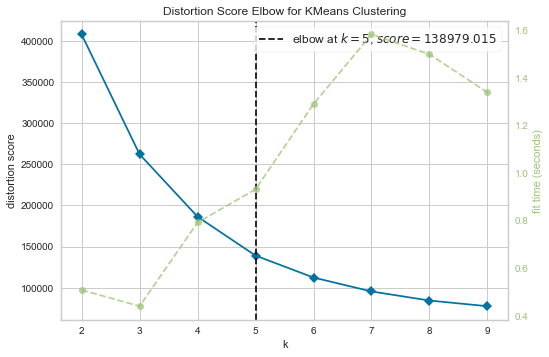

<Figure size 576x396 with 0 Axes>

In [164]:
kmax = 10
k_values = (2, kmax)

scaler = preprocessing.StandardScaler()
norm_data = scaler.fit_transform(energy_housesize[dl.energy_cols])

km = KMeansCluster(norm_data)
km.cluster(k_values)

path = images_path / Path("ensayos/clustering_por_dimension_hogar/energia")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("elbow.svg"))

In [165]:
km_best = km.get_kmeans_of(5)
km_labels = km_best.labels_
km_centroids = scaler.inverse_transform(km_best.cluster_centers_)

np.unique(km_labels, return_counts=True)

(array([0, 1, 2, 3, 4]),
 array([17752,     4,  1473,    46, 30165], dtype=int64))

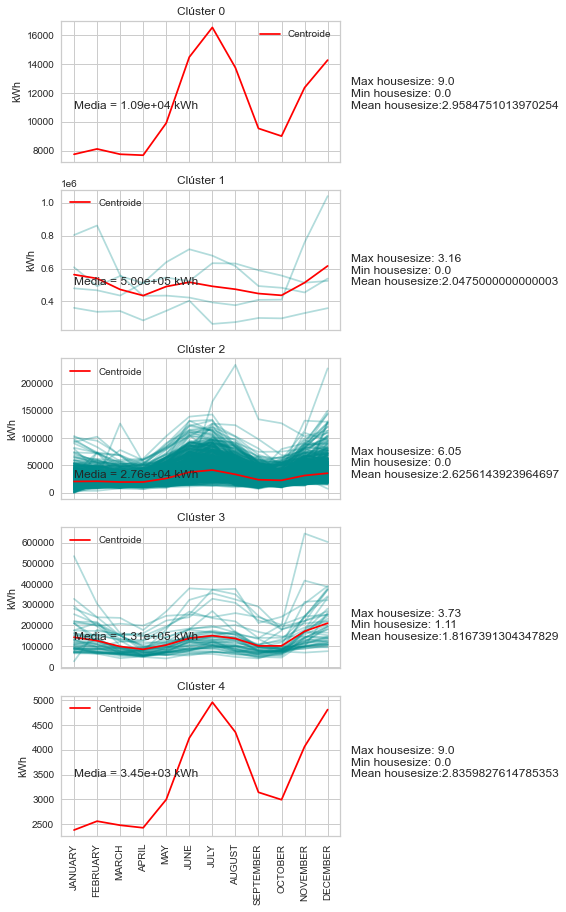

In [166]:
labels = pd.DataFrame(km_labels, columns=["label"])

k = km_centroids.shape[0]

f, axes = plt.subplots(k, 1, figsize=(5, 15), sharex=True)

for ki in range(k):
    cluster = energy_housesize.iloc[labels.query(f'label == {ki}').index][dl.energy_cols]
    
    palette={i:"darkcyan" for i in range(cluster.shape[0])}
    
    if len(cluster) < 10000:
        ax0 = sns.lineplot(data=cluster.values.T, ax=axes[ki], palette=palette, alpha=0.3)
        _ = [line.set_linestyle("-") for line in ax0.lines]
    
    ax0c = sns.lineplot(data=km_centroids[ki, :].T, ax=axes[ki], color="red")
    _ = [line.set_linestyle("-") for line in ax0c.lines]
    
    ax0c.legend(ax0c.lines[-1:], ["Centroide"]);
    
    axes[ki].set_title(f"Clúster {ki}")
    Media = km_centroids[ki, :].mean()
    axes[ki].text(0, Media, f"{Media = :0.2e} kWh")
    
    axes[ki].set_xticks([e for e in range(0, 12)])
    axes[ki].set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)
    axes[ki].set(ylabel="kWh")
    #print(f"Gráfica {ki} realizada")
    
    cluster_housesize = energy_housesize.iloc[labels.query(f'label == {ki}').index]["AVERAGE HOUSESIZE"]
    
    txt = f"Max housesize: {cluster_housesize.max()}\n" + \
          f"Min housesize: {cluster_housesize.min()}\n" + \
          f"Mean housesize:{cluster_housesize.mean()}"
    
    axes[ki].text(12, Media, txt)

path = images_path / Path("ensayos/clustering_por_dimension_hogar/energia")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("grafica.svg"))

In [167]:
comunities_by_cluster = {}

for nlab in range(k):
    com_index = np.where(labels==nlab)[0]
    com_list = []
    for c in energy_housesize.values[com_index][:,-1]:
        com_list.append(c)
    comunities_by_cluster[nlab] = com_list

for k in sorted(comunities_by_cluster, key=lambda k: len(comunities_by_cluster[k])):
    print(f"Al clúster {k} pertenecen las comunidades:")
    for e in np.unique(comunities_by_cluster[k]):
        print("\t", e)

Al clúster 1 pertenecen las comunidades:
	 Garfield Ridge
	 Near North Side
	 Near West Side
	 Portage Park
Al clúster 3 pertenecen las comunidades:
	 Ashburn
	 Auburn Gresham
	 Avalon Park
	 Belmont Cragin
	 Chatham
	 Edgewater
	 Grand Boulevard
	 Hyde Park
	 Jefferson Park
	 Lakeview
	 Lincoln Park
	 Loop
	 Morgan Park
	 Near North Side
	 Near South Side
	 Near West Side
	 North Center
	 North Lawndale
	 Riverdale
	 South Deering
	 Uptown
	 Washington Park
	 West Lawn
	 West Town
Al clúster 2 pertenecen las comunidades:
	 Albany Park
	 Archer Heights
	 Armour Square
	 Ashburn
	 Auburn Gresham
	 Austin
	 Avalon Park
	 Avondale
	 Belmont Cragin
	 Beverly
	 Bridgeport
	 Brighton Park
	 Calumet Heights
	 Chatham
	 Chicago Lawn
	 Clearing
	 Douglas
	 Dunning
	 East Garfield Park
	 East Side
	 Edgewater
	 Edison Park
	 Englewood
	 Forest Glen
	 Gage Park
	 Garfield Ridge
	 Grand Boulevard
	 Hegewisch
	 Hermosa
	 Humboldt Park
	 Hyde Park
	 Irving Park
	 Jefferson Park
	 Kenwood
	 Lakeview


#### Gas

Aplicamos clustering a las muestras de consumo de gas.

In [168]:
gas_housesize = dl[dl.gas_cols + ['AVERAGE HOUSESIZE', 'BUILDING TYPE', 'COMMUNITY AREA NAME']]
gas_housesize = gas_housesize[gas_housesize['BUILDING TYPE'] == "Residential"][dl.gas_cols + ['AVERAGE HOUSESIZE', 'COMMUNITY AREA NAME']]
gas_housesize

,THERM JANUARY 2010,THERM FEBRUARY 2010,THERM MARCH 2010,THERM APRIL 2010,THERM MAY 2010,THERM JUNE 2010,THERM JULY 2010,THERM AUGUST 2010,THERM SEPTEMBER 2010,THERM OCTOBER 2010,THERM NOVEMBER 2010,THERM DECEMBER 2010,AVERAGE HOUSESIZE,COMMUNITY AREA NAME
0,2326.0,2131.0,1400.0,620.0,502.0,224.0,222.0,187.0,197.0,252.0,744.0,2112.0,3.87,Archer Heights
19,285.0,285.0,244.0,129.0,73.0,46.0,39.0,27.0,39.0,29.0,50.0,144.0,2.20,Avondale
22,243.0,195.0,156.0,46.0,6.0,7.0,6.0,6.0,7.0,5.0,26.0,81.0,2.00,Beverly
39,555.0,440.0,378.0,228.0,126.0,88.0,61.0,62.0,63.0,69.0,173.0,304.0,2.61,Clearing
41,326.0,305.0,244.0,137.0,96.0,76.0,44.0,27.0,31.0,48.0,71.0,205.0,3.19,Dunning
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67045,6914.0,5433.0,5054.0,2967.0,2241.0,1107.0,770.0,674.0,788.0,954.0,2423.0,4619.0,3.14,Woodlawn
67046,2166.0,1681.0,1858.0,1172.0,708.0,360.0,72.0,67.0,77.0,185.0,623.0,1800.0,3.14,Woodlawn
67048,2202.0,1874.0,1647.0,906.0,645.0,346.0,84.0,150.0,150.0,260.0,694.0,1335.0,2.07,Woodlawn
67049,95.0,11.0,47.0,9.0,45.0,18.0,22.0,9.0,17.0,11.0,18.0,13.0,0.00,Woodlawn


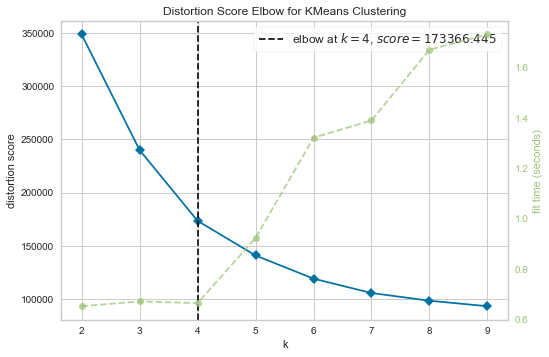

<Figure size 576x396 with 0 Axes>

In [169]:
kmax = 10
k_values = (2, kmax)

scaler = preprocessing.StandardScaler()
norm_data = scaler.fit_transform(gas_housesize[dl.gas_cols])

km = KMeansCluster(norm_data)
km.cluster(k_values)

path = images_path / Path("ensayos/clustering_por_dimension_hogar/gas")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("elbow.svg"))

In [170]:
km_best = km.get_kmeans_of(4)
km_labels = km_best.labels_
km_centroids = scaler.inverse_transform(km_best.cluster_centers_)

np.unique(km_labels, return_counts=True)

(array([0, 1, 2, 3]), array([17451, 26212,    68,  2464], dtype=int64))

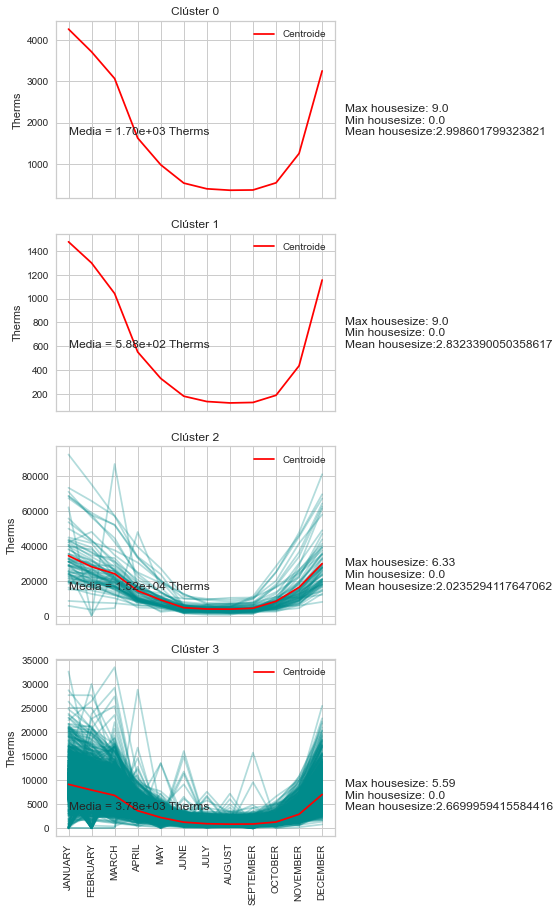

In [171]:
labels = pd.DataFrame(km_labels, columns=["label"])

k = km_centroids.shape[0]

f, axes = plt.subplots(k, 1, figsize=(5, 15), sharex=True)

for ki in range(k):
    cluster = gas_housesize.iloc[labels.query(f'label == {ki}').index][dl.gas_cols]
    
    palette={i:"darkcyan" for i in range(cluster.shape[0])}
    
    if len(cluster) < 10000:
        ax0 = sns.lineplot(data=cluster.values.T, ax=axes[ki], palette=palette, alpha=0.3)
        _ = [line.set_linestyle("-") for line in ax0.lines]
    
    ax0c = sns.lineplot(data=km_centroids[ki, :].T, ax=axes[ki], color="red")
    _ = [line.set_linestyle("-") for line in ax0c.lines]
    
    ax0c.legend(ax0c.lines[-1:], ["Centroide"]);
    
    axes[ki].set_title(f"Clúster {ki}")
    Media = km_centroids[ki, :].mean()
    axes[ki].text(0, Media, f"{Media = :0.2e} Therms")
    
    axes[ki].set_xticks([e for e in range(0, 12)])
    axes[ki].set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)
    axes[ki].set(ylabel="Therms")
    #print(f"Gráfica {ki} realizada")
    
    cluster_housesize = gas_housesize.iloc[labels.query(f'label == {ki}').index]["AVERAGE HOUSESIZE"]
    
    txt = f"Max housesize: {cluster_housesize.max()}\n" + \
          f"Min housesize: {cluster_housesize.min()}\n" + \
          f"Mean housesize:{cluster_housesize.mean()}"
    
    axes[ki].text(12, Media, txt)

path = images_path / Path("ensayos/clustering_por_dimension_hogar/gas")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("grafica.svg"))

In [172]:
comunities_by_cluster = {}

for nlab in range(k):
    com_index = np.where(labels==nlab)[0]
    com_list = []
    for c in gas_housesize.values[com_index][:, -1]:
        com_list.append(c)
    comunities_by_cluster[nlab] = com_list

for k in sorted(comunities_by_cluster, key=lambda k: len(comunities_by_cluster[k])):
    print(f"Al clúster {k} pertenecen las comunidades:")
    for e in np.unique(comunities_by_cluster[k]):
        print("\t", e)

Al clúster 2 pertenecen las comunidades:
	 Ashburn
	 Auburn Gresham
	 Avalon Park
	 Belmont Cragin
	 Douglas
	 East Garfield Park
	 Edgewater
	 Garfield Ridge
	 Humboldt Park
	 Hyde Park
	 Jefferson Park
	 Kenwood
	 Lakeview
	 Lincoln Park
	 Loop
	 Morgan Park
	 Mount Greenwood
	 Near North Side
	 Near South Side
	 Near West Side
	 New City
	 North Center
	 North Lawndale
	 O'Hare
	 Riverdale
	 South Chicago
	 South Deering
	 South Shore
	 Uptown
	 Washington Park
	 West Lawn
	 Woodlawn
Al clúster 3 pertenecen las comunidades:
	 Albany Park
	 Archer Heights
	 Armour Square
	 Ashburn
	 Auburn Gresham
	 Austin
	 Avalon Park
	 Avondale
	 Belmont Cragin
	 Beverly
	 Bridgeport
	 Brighton Park
	 Calumet Heights
	 Chatham
	 Chicago Lawn
	 Clearing
	 Douglas
	 Dunning
	 East Garfield Park
	 East Side
	 Edgewater
	 Edison Park
	 Englewood
	 Forest Glen
	 Gage Park
	 Garfield Ridge
	 Grand Boulevard
	 Greater Grand Crossing
	 Hegewisch
	 Hermosa
	 Humboldt Park
	 Hyde Park
	 Irving Park
	 Jeffer

### [Volver al inicio](#Consumo-de-energía-en-Chicago-en-2010)

---

### Clustering por ocupación total

En este capo se buscarán patrones según el porcentaje de ocupación para las zonas residenciales.

#### Energía

Seleccionamos las muestras de consumo de electricidad para las zonas residenciales y aplicamos clustering.

In [6]:
energy_occupied = dl[dl.energy_cols + ['OCCUPIED UNITS PERCENTAGE', 'BUILDING TYPE', 'COMMUNITY AREA NAME']]
energy_occupied = energy_occupied[energy_occupied['BUILDING TYPE'] == "Residential"][dl.energy_cols + ['OCCUPIED UNITS PERCENTAGE', 'COMMUNITY AREA NAME']]
energy_occupied

,KWH JANUARY 2010,KWH FEBRUARY 2010,KWH MARCH 2010,KWH APRIL 2010,KWH MAY 2010,KWH JUNE 2010,KWH JULY 2010,KWH AUGUST 2010,KWH SEPTEMBER 2010,KWH OCTOBER 2010,KWH NOVEMBER 2010,KWH DECEMBER 2010,OCCUPIED UNITS PERCENTAGE,COMMUNITY AREA NAME
1,7334.0,7741.0,4214.0,4284.0,2518.0,4273.0,4566.0,2787.0,3357.0,5540.0,15774.0,19676.0,0.9254,Ashburn
8,2461.0,4888.0,2893.0,2737.0,2350.0,3037.0,3874.0,4861.0,5180.0,2984.0,2635.0,3597.0,0.8710,Austin
9,0.0,0.0,0.0,0.0,0.0,511.0,904.0,1818.0,1968.0,738.0,450.0,2207.0,0.6667,Austin
29,7542.0,7912.0,5451.0,3173.0,3792.0,4120.0,3197.0,4574.0,5509.0,6531.0,14402.0,22510.0,0.8955,Chatham
30,0.0,0.0,115.0,695.0,3527.0,8412.0,4175.0,3900.0,3257.0,3305.0,2813.0,3344.0,0.2000,Chatham
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67043,653.0,989.0,1281.0,1110.0,2077.0,2265.0,3694.0,3588.0,3233.0,4107.0,5930.0,6640.0,0.9000,Woodlawn
67045,9572.0,9104.0,8525.0,7756.0,11256.0,11669.0,12099.0,13200.0,9694.0,8419.0,19077.0,18869.0,0.6727,Woodlawn
67046,2705.0,1318.0,1582.0,1465.0,1494.0,2990.0,2449.0,2351.0,1213.0,2174.0,2888.0,5025.0,0.6727,Woodlawn
67048,3567.0,3031.0,2582.0,2295.0,7902.0,4987.0,5773.0,3996.0,3050.0,3103.0,3880.0,4684.0,0.6250,Woodlawn


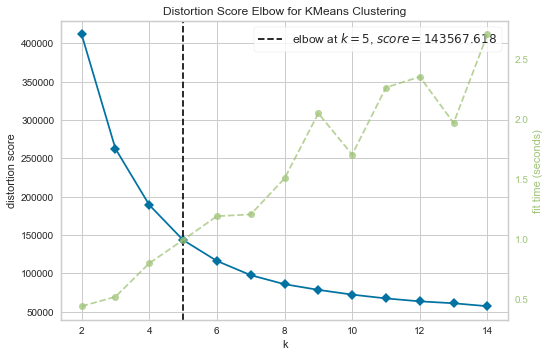

<Figure size 576x396 with 0 Axes>

In [7]:
kmax = 15
k_values = (2, kmax)

scaler = preprocessing.StandardScaler()
norm_data = scaler.fit_transform(energy_occupied[dl.energy_cols])

km = KMeansCluster(norm_data)
km.cluster(k_values)

path = images_path / Path("ensayos/clustering_por_ocupacion_total/energia")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("elbow.svg"))

In [8]:
km_best = km.get_kmeans_of(5)
km_labels = km_best.labels_
km_centroids = scaler.inverse_transform(km_best.cluster_centers_)

np.unique(km_labels, return_counts=True)

(array([0, 1, 2, 3, 4]),
 array([29584, 17577,     3,    46,  1451], dtype=int64))

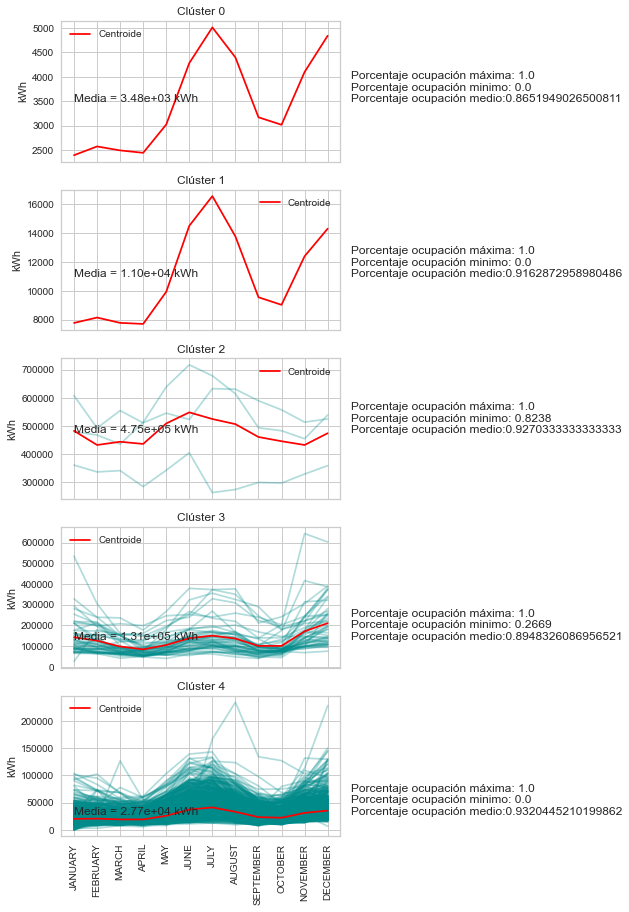

In [9]:
labels = pd.DataFrame(km_labels, columns=["label"])

k = km_centroids.shape[0]

f, axes = plt.subplots(k, 1, figsize=(5, 15), sharex=True)

for ki in range(k):
    cluster = energy_occupied.iloc[labels.query(f'label == {ki}').index][dl.energy_cols]
    
    palette={i:"darkcyan" for i in range(cluster.shape[0])}
    
    if len(cluster) < 10000:
        ax0 = sns.lineplot(data=cluster.values.T, ax=axes[ki], palette=palette, alpha=0.3)
        _ = [line.set_linestyle("-") for line in ax0.lines]
    
    ax0c = sns.lineplot(data=km_centroids[ki, :].T, ax=axes[ki], color="red")
    _ = [line.set_linestyle("-") for line in ax0c.lines]
    
    ax0c.legend(ax0c.lines[-1:], ["Centroide"]);
    
    axes[ki].set_title(f"Clúster {ki}")
    Media = km_centroids[ki, :].mean()
    axes[ki].text(0, Media, f"{Media = :0.2e} kWh")
    
    axes[ki].set_xticks([e for e in range(0, 12)])
    axes[ki].set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)
    axes[ki].set(ylabel="kWh")
    #print(f"Gráfica {ki} realizada")
    
    cluster_occupied = energy_occupied.iloc[labels.query(f'label == {ki}').index]["OCCUPIED UNITS PERCENTAGE"]
    
    txt = f"Porcentaje ocupación máxima: {cluster_occupied.max()}\n" + \
          f"Porcentaje ocupación minimo: {cluster_occupied.min()}\n" + \
          f"Porcentaje ocupación medio:{cluster_occupied.mean()}"
    
    axes[ki].text(12, Media, txt)

    
path = images_path / Path("ensayos/clustering_por_ocupacion_total/energia")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("grafica.svg"))

In [10]:
comunities_by_cluster = {}

for nlab in range(k):
    com_index = np.where(labels==nlab)[0]
    com_list = []
    for c in energy_occupied.values[com_index][:, -1]:
        com_list.append(c)
    comunities_by_cluster[nlab] = com_list

for k in sorted(comunities_by_cluster, key=lambda k: len(comunities_by_cluster[k])):
    print(f"Al clúster {k} pertenecen las comunidades:")
    for e in np.unique(comunities_by_cluster[k]):
        print("\t", e)

Al clúster 2 pertenecen las comunidades:
	 Garfield Ridge
	 Near West Side
	 Portage Park
Al clúster 3 pertenecen las comunidades:
	 Ashburn
	 Auburn Gresham
	 Avalon Park
	 Belmont Cragin
	 Chatham
	 Edgewater
	 Grand Boulevard
	 Hyde Park
	 Jefferson Park
	 Lakeview
	 Lincoln Park
	 Loop
	 Morgan Park
	 Near North Side
	 Near South Side
	 Near West Side
	 North Center
	 North Lawndale
	 Riverdale
	 South Deering
	 Uptown
	 Washington Park
	 West Lawn
	 West Town
Al clúster 4 pertenecen las comunidades:
	 Albany Park
	 Archer Heights
	 Armour Square
	 Ashburn
	 Auburn Gresham
	 Austin
	 Avalon Park
	 Avondale
	 Belmont Cragin
	 Beverly
	 Bridgeport
	 Brighton Park
	 Calumet Heights
	 Chatham
	 Chicago Lawn
	 Clearing
	 Douglas
	 Dunning
	 East Garfield Park
	 East Side
	 Edgewater
	 Edison Park
	 Englewood
	 Forest Glen
	 Gage Park
	 Garfield Ridge
	 Grand Boulevard
	 Hegewisch
	 Hermosa
	 Humboldt Park
	 Hyde Park
	 Irving Park
	 Jefferson Park
	 Kenwood
	 Lakeview
	 Lincoln Park
	 L

#### Gas

Seleccionamos las muestras de consumo de gas para las zonas residenciales y aplicamos clustering.

In [11]:
gas_occupied = dl[dl.gas_cols + ['OCCUPIED UNITS PERCENTAGE', 'BUILDING TYPE', 'COMMUNITY AREA NAME']]
gas_occupied = gas_occupied[gas_occupied['BUILDING TYPE'] == "Residential"][dl.gas_cols + ['OCCUPIED UNITS PERCENTAGE', 'COMMUNITY AREA NAME']]
gas_occupied

,THERM JANUARY 2010,THERM FEBRUARY 2010,THERM MARCH 2010,THERM APRIL 2010,THERM MAY 2010,THERM JUNE 2010,THERM JULY 2010,THERM AUGUST 2010,THERM SEPTEMBER 2010,THERM OCTOBER 2010,THERM NOVEMBER 2010,THERM DECEMBER 2010,OCCUPIED UNITS PERCENTAGE,COMMUNITY AREA NAME
0,2326.0,2131.0,1400.0,620.0,502.0,224.0,222.0,187.0,197.0,252.0,744.0,2112.0,0.9582,Archer Heights
19,285.0,285.0,244.0,129.0,73.0,46.0,39.0,27.0,39.0,29.0,50.0,144.0,0.9375,Avondale
22,243.0,195.0,156.0,46.0,6.0,7.0,6.0,6.0,7.0,5.0,26.0,81.0,1.0000,Beverly
39,555.0,440.0,378.0,228.0,126.0,88.0,61.0,62.0,63.0,69.0,173.0,304.0,0.9200,Clearing
41,326.0,305.0,244.0,137.0,96.0,76.0,44.0,27.0,31.0,48.0,71.0,205.0,1.0000,Dunning
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67043,3299.0,1884.0,1944.0,876.0,712.0,372.0,271.0,222.0,184.0,233.0,524.0,1135.0,0.9000,Woodlawn
67045,6914.0,5433.0,5054.0,2967.0,2241.0,1107.0,770.0,674.0,788.0,954.0,2423.0,4619.0,0.6727,Woodlawn
67046,2166.0,1681.0,1858.0,1172.0,708.0,360.0,72.0,67.0,77.0,185.0,623.0,1800.0,0.6727,Woodlawn
67048,2202.0,1874.0,1647.0,906.0,645.0,346.0,84.0,150.0,150.0,260.0,694.0,1335.0,0.6250,Woodlawn


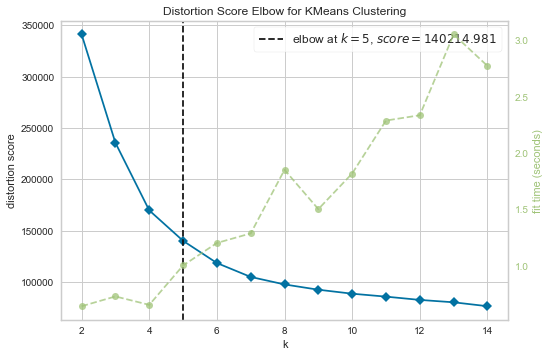

<Figure size 576x396 with 0 Axes>

In [12]:
kmax = 15
k_values = (2, kmax)

scaler = preprocessing.StandardScaler()
norm_data = scaler.fit_transform(gas_occupied[dl.gas_cols])

km = KMeansCluster(norm_data)
km.cluster(k_values)

path = images_path / Path("ensayos/clustering_por_ocupacion_total/gas")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("elbow.svg"))

In [13]:
km_best = km.get_kmeans_of(5)
km_labels = km_best.labels_
km_centroids = scaler.inverse_transform(km_best.cluster_centers_)

np.unique(km_labels, return_counts=True)

(array([0, 1, 2, 3, 4]),
 array([23267,  4440,    29,   483, 17295], dtype=int64))

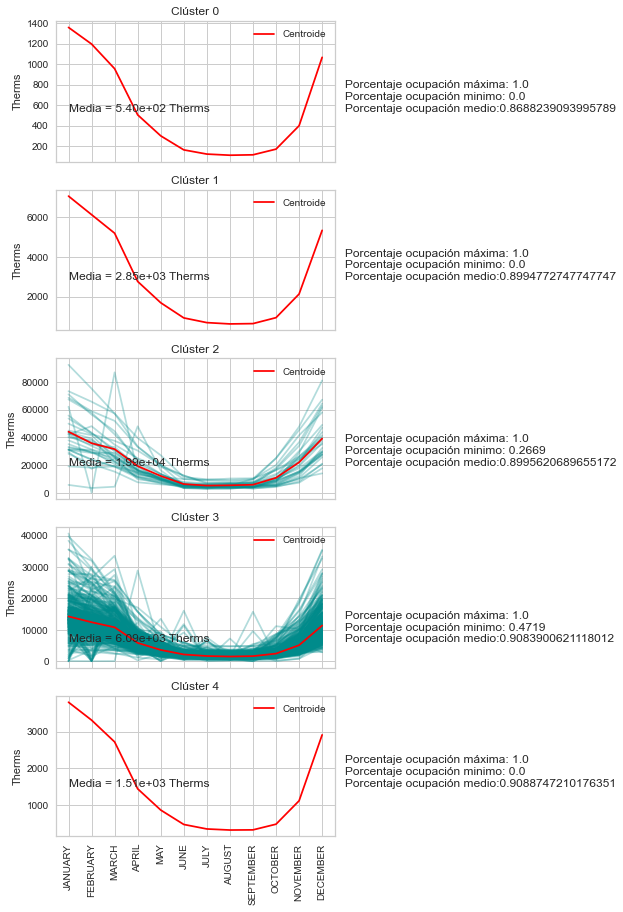

In [14]:
labels = pd.DataFrame(km_labels, columns=["label"])

k = km_centroids.shape[0]

f, axes = plt.subplots(k, 1, figsize=(5, 15), sharex=True)

for ki in range(k):
    cluster = gas_occupied.iloc[labels.query(f'label == {ki}').index][dl.gas_cols]
    
    palette={i:"darkcyan" for i in range(cluster.shape[0])}
    
    if len(cluster) < 1000:
        ax0 = sns.lineplot(data=cluster.values.T, ax=axes[ki], palette=palette, alpha=0.3)
        _ = [line.set_linestyle("-") for line in ax0.lines]
    
    ax0c = sns.lineplot(data=km_centroids[ki, :].T, ax=axes[ki], color="red")
    _ = [line.set_linestyle("-") for line in ax0c.lines]
    
    ax0c.legend(ax0c.lines[-1:], ["Centroide"]);
    
    axes[ki].set_title(f"Clúster {ki}")
    Media = km_centroids[ki, :].mean()
    axes[ki].text(0, Media, f"{Media = :0.2e} Therms")
    
    axes[ki].set_xticks([e for e in range(0, 12)])
    axes[ki].set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)
    axes[ki].set(ylabel="Therms")
    #print(f"Gráfica {ki} realizada")
    
    cluster_occupied = gas_occupied.iloc[labels.query(f'label == {ki}').index]["OCCUPIED UNITS PERCENTAGE"]
    
    txt = f"Porcentaje ocupación máxima: {cluster_occupied.max()}\n" + \
          f"Porcentaje ocupación minimo: {cluster_occupied.min()}\n" + \
          f"Porcentaje ocupación medio:{cluster_occupied.mean()}"
    
    axes[ki].text(12, Media, txt)

path = images_path / Path("ensayos/clustering_por_ocupacion_total/gas")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("grafica.svg"))

In [15]:
comunities_by_cluster = {}

for nlab in range(k):
    com_index = np.where(labels==nlab)[0]
    com_list = []
    for c in gas_occupied.values[com_index][:, -1]:
        com_list.append(c)
    comunities_by_cluster[nlab] = com_list

for k in sorted(comunities_by_cluster, key=lambda k: len(comunities_by_cluster[k])):
    print(f"Al clúster {k} pertenecen las comunidades:")
    for e in np.unique(comunities_by_cluster[k]):
        print("\t", e)

Al clúster 2 pertenecen las comunidades:
	 Ashburn
	 Douglas
	 Edgewater
	 Hyde Park
	 Lakeview
	 Lincoln Park
	 Loop
	 Mount Greenwood
	 Near North Side
	 Near South Side
	 Near West Side
	 New City
	 O'Hare
	 Riverdale
	 South Chicago
	 South Shore
	 Uptown
	 Washington Park
	 West Lawn
Al clúster 3 pertenecen las comunidades:
	 Albany Park
	 Archer Heights
	 Armour Square
	 Ashburn
	 Auburn Gresham
	 Austin
	 Avalon Park
	 Avondale
	 Belmont Cragin
	 Beverly
	 Bridgeport
	 Brighton Park
	 Calumet Heights
	 Chatham
	 Clearing
	 Douglas
	 Dunning
	 East Garfield Park
	 Edgewater
	 Edison Park
	 Englewood
	 Forest Glen
	 Garfield Ridge
	 Grand Boulevard
	 Greater Grand Crossing
	 Humboldt Park
	 Hyde Park
	 Irving Park
	 Jefferson Park
	 Kenwood
	 Lakeview
	 Lincoln Park
	 Lincoln Square
	 Logan Square
	 Lower West Side
	 McKinley Park
	 Montclare
	 Morgan Park
	 Mount Greenwood
	 Near North Side
	 Near South Side
	 Near West Side
	 New City
	 North Center
	 North Lawndale
	 North Park

### [Volver al inicio](#Consumo-de-energía-en-Chicago-en-2010)

---

### Clustering por porcentaje de casas en renta

En este caso, se seleccionará el porcentaje de casas en alquiler criterio de comparación.

#### Energía

Seleccionamos las muestras de consumo de electricidad para las zonas residenciales y aplicamos clustering.

In [16]:
energy_occupied = dl[dl.energy_cols + ['RENTER-OCCUPIED HOUSING PERCENTAGE', 'BUILDING TYPE', 'COMMUNITY AREA NAME']]
energy_occupied = energy_occupied[energy_occupied['BUILDING TYPE'] == "Residential"][dl.energy_cols + ['RENTER-OCCUPIED HOUSING PERCENTAGE', 'COMMUNITY AREA NAME']]
energy_occupied

,KWH JANUARY 2010,KWH FEBRUARY 2010,KWH MARCH 2010,KWH APRIL 2010,KWH MAY 2010,KWH JUNE 2010,KWH JULY 2010,KWH AUGUST 2010,KWH SEPTEMBER 2010,KWH OCTOBER 2010,KWH NOVEMBER 2010,KWH DECEMBER 2010,RENTER-OCCUPIED HOUSING PERCENTAGE,COMMUNITY AREA NAME
1,7334.0,7741.0,4214.0,4284.0,2518.0,4273.0,4566.0,2787.0,3357.0,5540.0,15774.0,19676.0,0.8059,Ashburn
8,2461.0,4888.0,2893.0,2737.0,2350.0,3037.0,3874.0,4861.0,5180.0,2984.0,2635.0,3597.0,1.0000,Austin
9,0.0,0.0,0.0,0.0,0.0,511.0,904.0,1818.0,1968.0,738.0,450.0,2207.0,0.7270,Austin
29,7542.0,7912.0,5451.0,3173.0,3792.0,4120.0,3197.0,4574.0,5509.0,6531.0,14402.0,22510.0,0.8670,Chatham
30,0.0,0.0,115.0,695.0,3527.0,8412.0,4175.0,3900.0,3257.0,3305.0,2813.0,3344.0,0.5000,Chatham
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67043,653.0,989.0,1281.0,1110.0,2077.0,2265.0,3694.0,3588.0,3233.0,4107.0,5930.0,6640.0,0.7220,Woodlawn
67045,9572.0,9104.0,8525.0,7756.0,11256.0,11669.0,12099.0,13200.0,9694.0,8419.0,19077.0,18869.0,0.7030,Woodlawn
67046,2705.0,1318.0,1582.0,1465.0,1494.0,2990.0,2449.0,2351.0,1213.0,2174.0,2888.0,5025.0,0.7030,Woodlawn
67048,3567.0,3031.0,2582.0,2295.0,7902.0,4987.0,5773.0,3996.0,3050.0,3103.0,3880.0,4684.0,0.8670,Woodlawn


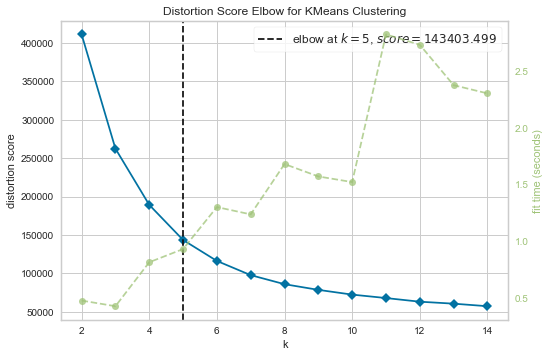

<Figure size 576x396 with 0 Axes>

In [17]:
kmax = 15
k_values = (2, kmax)

scaler = preprocessing.StandardScaler()
norm_data = scaler.fit_transform(energy_occupied[dl.energy_cols])

km = KMeansCluster(norm_data)
km.cluster(k_values)

path = images_path / Path("ensayos/clustering_por_ocupacion_en_renta/energia")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("elbow.svg"))

In [18]:
km_best = km.get_kmeans_of(5)
km_labels = km_best.labels_
km_centroids = scaler.inverse_transform(km_best.cluster_centers_)

np.unique(km_labels, return_counts=True)

(array([0, 1, 2, 3, 4]),
 array([29677, 17501,     3,    46,  1374], dtype=int64))

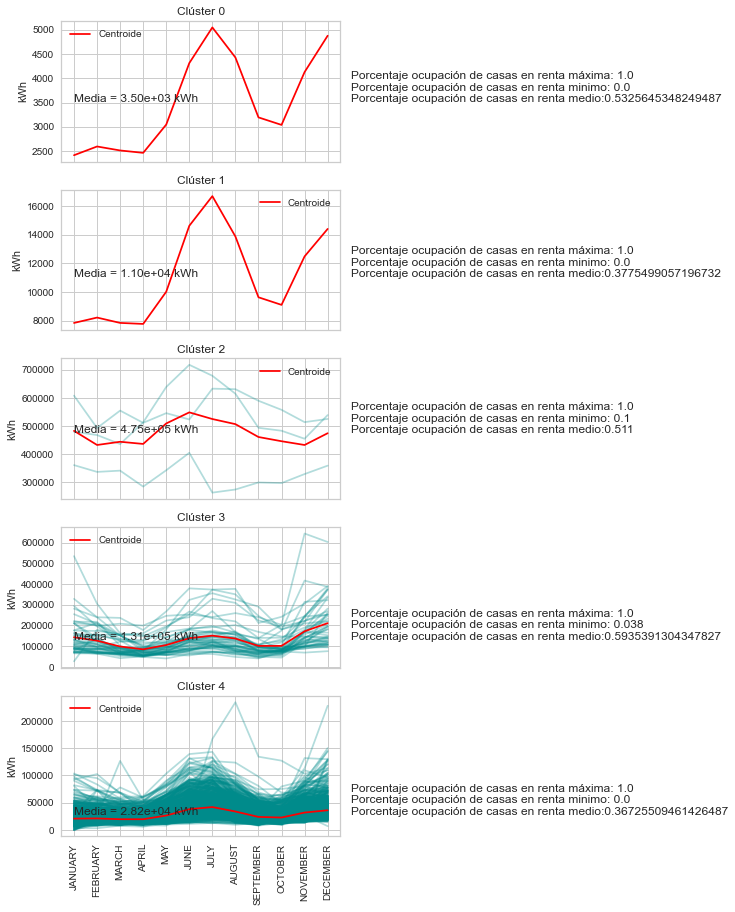

In [19]:
labels = pd.DataFrame(km_labels, columns=["label"])

k = km_centroids.shape[0]

f, axes = plt.subplots(k, 1, figsize=(5, 15), sharex=True)

for ki in range(k):
    cluster = energy_occupied.iloc[labels.query(f'label == {ki}').index][dl.energy_cols]
    
    palette={i:"darkcyan" for i in range(cluster.shape[0])}
    
    if len(cluster) < 10000:
        ax0 = sns.lineplot(data=cluster.values.T, ax=axes[ki], palette=palette, alpha=0.3)
        _ = [line.set_linestyle("-") for line in ax0.lines]
    
    ax0c = sns.lineplot(data=km_centroids[ki, :].T, ax=axes[ki], color="red")
    _ = [line.set_linestyle("-") for line in ax0c.lines]
    
    ax0c.legend(ax0c.lines[-1:], ["Centroide"]);
    
    axes[ki].set_title(f"Clúster {ki}")
    Media = km_centroids[ki, :].mean()
    axes[ki].text(0, Media, f"{Media = :0.2e} kWh")
    
    axes[ki].set_xticks([e for e in range(0, 12)])
    axes[ki].set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)
    axes[ki].set(ylabel="kWh")
    #print(f"Gráfica {ki} realizada")
    
    cluster_occupied = energy_occupied.iloc[labels.query(f'label == {ki}').index]["RENTER-OCCUPIED HOUSING PERCENTAGE"]
    
    txt = f"Porcentaje ocupación de casas en renta máxima: {cluster_occupied.max()}\n" + \
          f"Porcentaje ocupación de casas en renta minimo: {cluster_occupied.min()}\n" + \
          f"Porcentaje ocupación de casas en renta medio:{cluster_occupied.mean()}"
    
    axes[ki].text(12, Media, txt)

path = images_path / Path("ensayos/clustering_por_ocupacion_en_renta/energia")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("grafica.svg"))

In [20]:
comunities_by_cluster = {}

for nlab in range(k):
    com_index = np.where(labels==nlab)[0]
    com_list = []
    for c in energy_occupied.values[com_index][:, -1]:
        com_list.append(c)
    comunities_by_cluster[nlab] = com_list

for k in sorted(comunities_by_cluster, key=lambda k: len(comunities_by_cluster[k])):
    print(f"Al clúster {k} pertenecen las comunidades:")
    for e in np.unique(comunities_by_cluster[k]):
        print("\t", e)

Al clúster 2 pertenecen las comunidades:
	 Garfield Ridge
	 Near West Side
	 Portage Park
Al clúster 3 pertenecen las comunidades:
	 Ashburn
	 Auburn Gresham
	 Avalon Park
	 Belmont Cragin
	 Chatham
	 Edgewater
	 Grand Boulevard
	 Hyde Park
	 Jefferson Park
	 Lakeview
	 Lincoln Park
	 Loop
	 Morgan Park
	 Near North Side
	 Near South Side
	 Near West Side
	 North Center
	 North Lawndale
	 Riverdale
	 South Deering
	 Uptown
	 Washington Park
	 West Lawn
	 West Town
Al clúster 4 pertenecen las comunidades:
	 Albany Park
	 Archer Heights
	 Armour Square
	 Ashburn
	 Auburn Gresham
	 Austin
	 Avalon Park
	 Avondale
	 Belmont Cragin
	 Beverly
	 Bridgeport
	 Brighton Park
	 Calumet Heights
	 Chatham
	 Chicago Lawn
	 Clearing
	 Douglas
	 Dunning
	 East Garfield Park
	 East Side
	 Edgewater
	 Edison Park
	 Englewood
	 Forest Glen
	 Gage Park
	 Garfield Ridge
	 Hegewisch
	 Hermosa
	 Humboldt Park
	 Hyde Park
	 Irving Park
	 Jefferson Park
	 Kenwood
	 Lakeview
	 Lincoln Park
	 Lincoln Square
	 Lo

#### Gas

Seleccionamos las muestras de consumo de gas para las zonas residenciales y aplicamos clustering.

In [21]:
gas_occupied = dl[dl.gas_cols + ['RENTER-OCCUPIED HOUSING PERCENTAGE', 'BUILDING TYPE', 'COMMUNITY AREA NAME']]
gas_occupied = gas_occupied[gas_occupied['BUILDING TYPE'] == "Residential"][dl.gas_cols + ['RENTER-OCCUPIED HOUSING PERCENTAGE', 'COMMUNITY AREA NAME']]
gas_occupied

,THERM JANUARY 2010,THERM FEBRUARY 2010,THERM MARCH 2010,THERM APRIL 2010,THERM MAY 2010,THERM JUNE 2010,THERM JULY 2010,THERM AUGUST 2010,THERM SEPTEMBER 2010,THERM OCTOBER 2010,THERM NOVEMBER 2010,THERM DECEMBER 2010,RENTER-OCCUPIED HOUSING PERCENTAGE,COMMUNITY AREA NAME
0,2326.0,2131.0,1400.0,620.0,502.0,224.0,222.0,187.0,197.0,252.0,744.0,2112.0,0.3910,Archer Heights
19,285.0,285.0,244.0,129.0,73.0,46.0,39.0,27.0,39.0,29.0,50.0,144.0,0.1330,Avondale
22,243.0,195.0,156.0,46.0,6.0,7.0,6.0,6.0,7.0,5.0,26.0,81.0,1.0000,Beverly
39,555.0,440.0,378.0,228.0,126.0,88.0,61.0,62.0,63.0,69.0,173.0,304.0,0.2170,Clearing
41,326.0,305.0,244.0,137.0,96.0,76.0,44.0,27.0,31.0,48.0,71.0,205.0,0.1250,Dunning
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67043,3299.0,1884.0,1944.0,876.0,712.0,372.0,271.0,222.0,184.0,233.0,524.0,1135.0,0.7220,Woodlawn
67045,6914.0,5433.0,5054.0,2967.0,2241.0,1107.0,770.0,674.0,788.0,954.0,2423.0,4619.0,0.7030,Woodlawn
67046,2166.0,1681.0,1858.0,1172.0,708.0,360.0,72.0,67.0,77.0,185.0,623.0,1800.0,0.7030,Woodlawn
67048,2202.0,1874.0,1647.0,906.0,645.0,346.0,84.0,150.0,150.0,260.0,694.0,1335.0,0.8670,Woodlawn


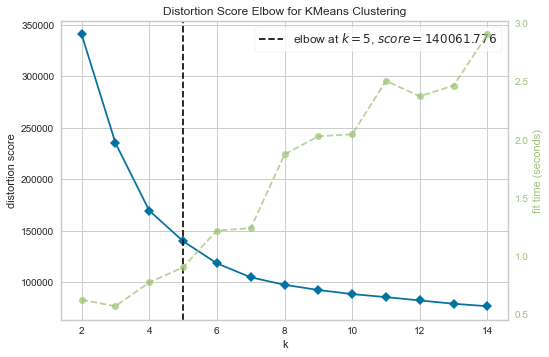

<Figure size 576x396 with 0 Axes>

In [22]:
kmax = 15
k_values = (2, kmax)

scaler = preprocessing.StandardScaler()
norm_data = scaler.fit_transform(gas_occupied[dl.gas_cols])

km = KMeansCluster(norm_data)
km.cluster(k_values)

path = images_path / Path("ensayos/clustering_por_ocupacion_en_renta/gas")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("elbow.svg"))

In [23]:
km_best = km.get_kmeans_of(5)
km_labels = km_best.labels_
km_centroids = scaler.inverse_transform(km_best.cluster_centers_)

np.unique(km_labels, return_counts=True)

(array([0, 1, 2, 3, 4]),
 array([  200, 24350,  3402, 17495,    16], dtype=int64))

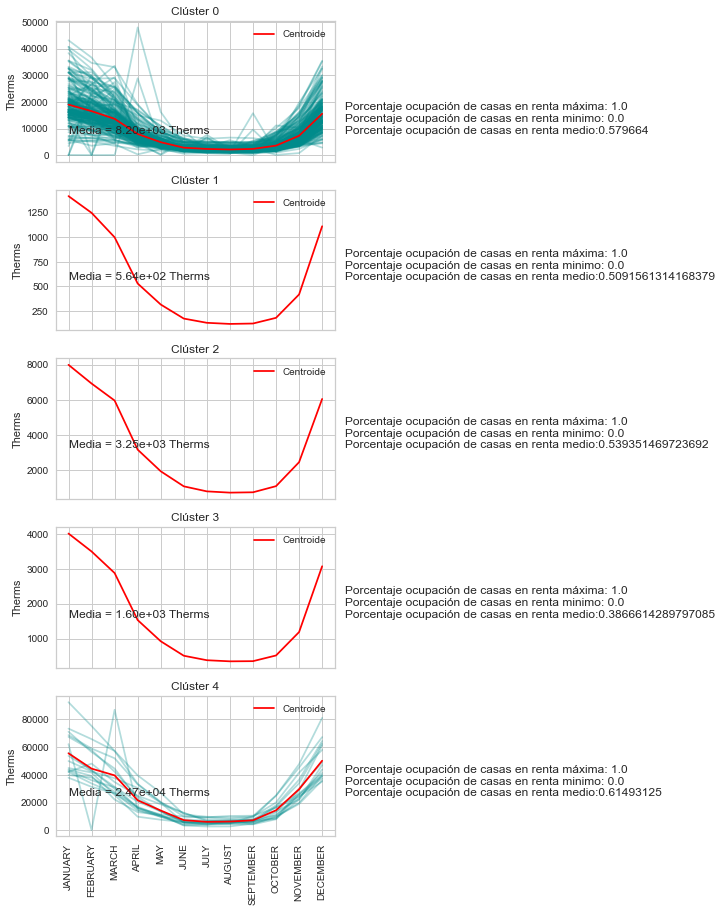

In [24]:
labels = pd.DataFrame(km_labels, columns=["label"])

k = km_centroids.shape[0]

f, axes = plt.subplots(k, 1, figsize=(5, 15), sharex=True)

for ki in range(k):
    cluster = gas_occupied.iloc[labels.query(f'label == {ki}').index][dl.gas_cols]
    
    palette={i:"darkcyan" for i in range(cluster.shape[0])}
    
    if len(cluster) < 1000:
        ax0 = sns.lineplot(data=cluster.values.T, ax=axes[ki], palette=palette, alpha=0.3)
        _ = [line.set_linestyle("-") for line in ax0.lines]
    
    ax0c = sns.lineplot(data=km_centroids[ki, :].T, ax=axes[ki], color="red")
    _ = [line.set_linestyle("-") for line in ax0c.lines]
    
    ax0c.legend(ax0c.lines[-1:], ["Centroide"]);
    
    axes[ki].set_title(f"Clúster {ki}")
    Media = km_centroids[ki, :].mean()
    axes[ki].text(0, Media, f"{Media = :0.2e} Therms")
    
    axes[ki].set_xticks([e for e in range(0, 12)])
    axes[ki].set_xticklabels([f"{datetime.date(2008, i, 1).strftime('%B').upper()}" for i in range(1, 13)], rotation=90)
    axes[ki].set(ylabel="Therms")
    #print(f"Gráfica {ki} realizada")
    
    cluster_occupied = gas_occupied.iloc[labels.query(f'label == {ki}').index]["RENTER-OCCUPIED HOUSING PERCENTAGE"]
    
    txt = f"Porcentaje ocupación de casas en renta máxima: {cluster_occupied.max()}\n" + \
          f"Porcentaje ocupación de casas en renta minimo: {cluster_occupied.min()}\n" + \
          f"Porcentaje ocupación de casas en renta medio:{cluster_occupied.mean()}"
    
    axes[ki].text(12, Media, txt)

path = images_path / Path("ensayos/clustering_por_ocupacion_en_renta/gas")
path.mkdir(parents=True, exist_ok=True)
plt.savefig(path / Path("grafica.svg"))

In [25]:
comunities_by_cluster = {}

for nlab in range(k):
    com_index = np.where(labels==nlab)[0]
    com_list = []
    for c in gas_occupied.values[com_index][:, -1]:
        com_list.append(c)
    comunities_by_cluster[nlab] = com_list

for k in sorted(comunities_by_cluster, key=lambda k: len(comunities_by_cluster[k])):
    print(f"Al clúster {k} pertenecen las comunidades:")
    for e in np.unique(comunities_by_cluster[k]):
        print("\t", e)

Al clúster 4 pertenecen las comunidades:
	 Douglas
	 Hyde Park
	 Lakeview
	 Lincoln Park
	 Loop
	 Near North Side
	 Near South Side
	 New City
	 South Chicago
	 South Shore
	 Washington Park
Al clúster 0 pertenecen las comunidades:
	 Albany Park
	 Ashburn
	 Auburn Gresham
	 Austin
	 Avalon Park
	 Belmont Cragin
	 Beverly
	 Bridgeport
	 Chatham
	 Clearing
	 Douglas
	 Dunning
	 East Garfield Park
	 Edgewater
	 Edison Park
	 Forest Glen
	 Garfield Ridge
	 Grand Boulevard
	 Humboldt Park
	 Hyde Park
	 Irving Park
	 Jefferson Park
	 Kenwood
	 Lakeview
	 Lincoln Park
	 Lincoln Square
	 Logan Square
	 Morgan Park
	 Mount Greenwood
	 Near North Side
	 Near South Side
	 Near West Side
	 New City
	 North Center
	 North Lawndale
	 North Park
	 Norwood Park
	 O'Hare
	 Portage Park
	 Riverdale
	 Rogers Park
	 Roseland
	 South Deering
	 South Shore
	 Uptown
	 Washington Heights
	 West Englewood
	 West Lawn
	 West Pullman
	 West Ridge
	 Woodlawn
Al clúster 2 pertenecen las comunidades:
	 Albany Park


### [Volver al inicio](#Consumo-de-energía-en-Chicago-en-2010)